In [43]:
from ModelFactory import ModelFactory
import tensorflow as tf

import os
import pickle
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd

# from utils import
import utils
from utils import tf_utils

from features import select_features, DEFAULT_FEATURES

import inspect
from defaults import *
from utils.speedup_utils import *


model_infos = [ 
                #("cascades_v0.3_L3", "gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs"),
                ("cascades_v0.3_L3", "gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs"),
                ("cascades_v0.4_L3", "gen2L3_wflux2_bal_allfeat_v0_hyperband4_500epochs"),
                #("cascades_v0.4_L3", "gen2L3_nguncorr_logactspeedup_hyperband3_50epochs"),
                ("cascades_v0.4_L3", "gen2L3_wflux2_bal_Egt1E6_v0_hyperband4_500epochs"),
                ("cascades_v0.4_L3", "gen2L3_wflux2_bal_v0_hyperband1_50epochs"),
                #("cascades_v0.4_L3", "gen2L3_allfeat_bayesian1_50epochs"),
                #("cascades_v0.4_L3", "gen2L3_allfeat_fluxwbalanced"),
                #"gen2L3_merged_combinedall_allfeatures",
                #"gen2L3_merged_combinedall_allfeatures_hyperband1",
                #"gen2L3_merged_combinedall_allfeatures_hyperband4",
              ]



model_names = [] 

mfs = {}

i = 0
for model_name in model_infos:
    if isinstance(model_name, (tuple, list)):
        version_tag, model_name = model_name
    else:
        version_tag = DEFAULT_VERSION_TAG
    if i==0:
        nominal_model = model_name

    mf = ModelFactory.load_model(version_tag=version_tag, model_name=model_name)

    mfs[model_name] = mf
    model_names.append( model_name )
    i += 1

mf = mfs[nominal_model]

loading model from:  /data/user/navidkrad/i3kiss/models/cascades_v0.3_L3/gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs/model.keras
MODEL <keras.src.engine.sequential.Sequential object at 0x7f9f5aa22a50>
loading weights from:  /data/user/navidkrad/i3kiss/models/cascades_v0.3_L3/gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs/weights.h5
loading model from:  /data/user/navidkrad/i3kiss/models/cascades_v0.4_L3/gen2L3_wflux2_bal_allfeat_v0_hyperband4_500epochs/model.keras
MODEL <keras.src.engine.sequential.Sequential object at 0x7f9f59142710>
loading weights from:  /data/user/navidkrad/i3kiss/models/cascades_v0.4_L3/gen2L3_wflux2_bal_allfeat_v0_hyperband4_500epochs/weights.h5
loading model from:  /data/user/navidkrad/i3kiss/models/cascades_v0.4_L3/gen2L3_wflux2_bal_Egt1E6_v0_hyperband4_500epochs/model.keras
MODEL <keras.src.engine.sequential.Sequential object at 0x7f9f5904c890>
loading weights from:  /data/user/navidkrad/i3kiss/models/cascades_v0.4_L3/gen2L3_wflux2

In [3]:
import simweights
simweights.__version__

def get_weights(
    fgen, nfiles=None, flux="GaisserH4a", return_weighter=False, verbose=True
):  
    import simweights

    print(f"{simweights.__path__=}")
    print(f"{simweights.__version__=}")
    hdffile = pd.HDFStore(fgen, "r")

    # instantiate the weighter object by passing the pandas file to it
    weighter = simweights.CorsikaWeighter(hdffile, nfiles=nfiles)
    flux = getattr(simweights, flux)() if isinstance(flux, str) else flux
    weights = weighter.get_weights(flux)
    if verbose:
        print(weighter.tostring(flux))
    if return_weighter:
        return weights, weighter
    else:
        return weights




In [4]:
for model_name, mf in mfs.items():
    print(model_name, mf.model.layers[-1])

gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs <keras.src.layers.core.dense.Dense object at 0x7fa06c7ad810>
gen2L3_wflux2_bal_allfeat_v0_hyperband4_500epochs <keras.src.layers.core.dense.Dense object at 0x7fa06c51dbd0>
gen2L3_wflux2_bal_Egt1E6_v0_hyperband4_500epochs <keras.src.layers.core.dense.Dense object at 0x7fa06c44c490>
gen2L3_wflux2_bal_v0_hyperband1_50epochs <keras.src.layers.core.dense.Dense object at 0x7fa06c4b0150>


In [5]:
#plot_dir = "/data/user/navidkrad/plots/pres/feb2024"
plot_dir = "/data/user/navidkrad/plots/pres/july2024"

label = mf.labels[0]

label_names = {
    'Level3':'L3',
    'filtered':'L2',
}

label_name = label_names.get(label, label)

labels = {
    'n_photons_passed'    : r'$N_{%s}^{\gamma}$'%(label_name),
    'n_photons_accepted' : r'$N_{NN}^{\gamma}$',
    'n_photons_accepted' : r'$N_{NN}^{\gamma}$',
    'n_events_eff'     : r'$N^{NN}_{eff} (pred*gen weights)$',
    'n_events_eff_pred'     : r'$N^{%s}_{eff}$'%(label_name),   
    'n_events_eff_pred_sel'     : r'$N^{%s}_{eff}$'%(label_name),     
    'n_events_eff_gen'     : r'$N^{%s}_{eff} (gen weight)$'%(label_name),    
    'n_events_accepted'  : r'$N^{NN}_{events}$',
    'n_photons_simulated_sel' : r'$N^{simulated}_{\gamma}$ (sel)',
    

    "n_photons_simulated": "$<N_{\gamma}^{sim}>$",
    "n_photons_simulated_0": "$<N_{simulated\ showers}>$",
    "n_photons_simulated_2": "$<N_{\gamma}^{sim} (n_{\gamma}^2)>$",
    "n_eff_passed": "$<N_{eff}^{%s}>$"%(label_name),
    "n_eff_noflux_passed": "$<N_{eff}^{%s, raw}>$"%(label_name),

    'n_eff_sampled_expected' : r'$<N^{%s}_{eff,raw}>$'%(label_name),
    'n_eff_sampled_gen_expected' : r'$<N^{%s}_{eff}>$'%(label_name),
    'n_photons_sampled_expected' : r'$<N_{\gamma}>$',
    # 'n_photons_sampled_gen_expected' : r'$<N^{%s}_{\gamma}>$',

    #'min_pred':'Rejection Probability Threshold',
    'min_pred':'Minimum Acceptance Probability',

    #'fake_pred':'Utopian',
    'fake_pred':'Ideal',
    'pred':'model',
    #'uniform_pred':'Dystopian', 
    'uniform_pred':'Uniform', 
}

colors = {
    'fake_pred': 'green',
    'uniform_pred': 'red',
    'pred': 'blue'
}




for k, v in list(infos.items()):
    infos[k+"_prob"] = dict(color=v.get('color'), label=v['label'], ls='--' )


In [6]:
"""
    Load DF
"""

import glob
test_file = "/data/user/navidkrad/hdf/cascades_v0.2_L3//sim/IceCube/2020/CORSIKA-in-ice/20904/test_train_balanced/test_preproc.hdf5"
train_file = "/data/user/navidkrad/hdf/cascades_v0.2_L3//sim/IceCube/2020/CORSIKA-in-ice/20904/test_train_balanced/train_preproc.hdf5"

# fname = train_file
fname = test_file

df_biased = pd.read_hdf(fname)

label = mf.labels[0]
cls0 = df_biased[label]==0
cls1 = df_biased[label]==1




In [7]:
# d['selection_weight']

df = df_biased

cls0 = df[label]==0
cls1 = df[label]==1

## Adding Predictions

In addition to the model predictions, the following are also added:
- pseudo predictions: used only as a reference in the "ideal" or "worst" case scenarios
- class probabilities: instead of using the NN score as probability, we use the ratio of the number of events in the positive class to the total number of events in the bin
- logistic predictions: we calibrate the activation function of the NN to better seperate the positive and negative classes.


In [8]:
df['pred']   =  mf.model.predict(df[mf.features], batch_size=mf.batch_size)
df['truth']  =  df['Level3'] == 1
df['passed'] = df['truth']

41/41 [==============================] - 0s 5ms/step


In [9]:
print("weight columns:")
print( [k for k in df.columns if "weight" in k] )

weight columns:
['weights', 'selection_weight', 'balanced_weight', 'gen_weights_balanced', 'gen_weights', 'sel_gen_weights', 'normalized_balanced_weights']


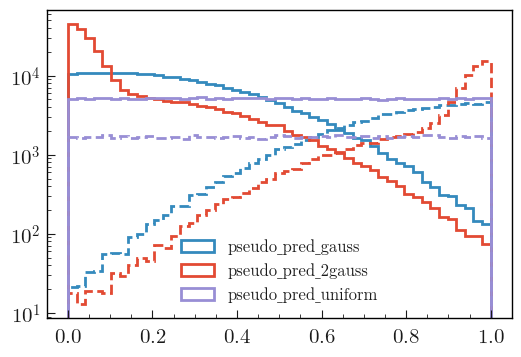

In [10]:
##
## Add pseudo predictions for comparison. 
##

add_pseudo_preds(df)

fig, ax =plt.subplots()

icolor = 0
for pseudo_pred in ['pseudo_pred_gauss', 'pseudo_pred_2gauss', 'pseudo_pred_uniform']:
    kw = dict(histtype='step', lw=2)
    kw['bins'] = np.linspace(0,1,50)
    _ = ax.hist(df[pseudo_pred][df['Level3']==0], **kw, color=f"C{icolor}", label=f'{pseudo_pred}')
    _ = ax.hist(df[pseudo_pred][df['Level3']==1], **kw, color=f"C{icolor}", ls="--") 
    icolor+=1

ax.set_yscale("log")
ax.legend()



In [11]:
preds = {}

for model_name in model_names:
    # print(model_name)
    # print(mf.features)
    mf_ = mfs[model_name]
    pred = mf_.model.predict(df[mf_.features], batch_size=mf_.batch_size)
    #preds[model_name] = pred
    df[model_name] = pred

    _ = get_class_probability(df, "Level3", 
                              pred=model_name, 
                              # weight_columns=['selection_weight', 'weights'],
                              weight_columns=['weights'],
                              # weight_columns=['gen_weights_balanced'],
                              bins=100, return_func="polyfit")

label = mf.labels[0]
df['truth'] = df[label]

41/41 [==============================] - 1s 11ms/step
coefs = array([ 1.7471552 , -3.64120679,  5.73614411, -6.05049207])
 9/41 [=====>........................] - ETA: 0s

41/41 [==============================] - 1s 14ms/step
coefs = array([ 17.27285653, -22.76601823,  13.23375401,  -7.9703689 ])
41/41 [==============================] - 1s 13ms/step
coefs = array([ -7.03306221,  21.97251504, -15.65858945,  -1.45439582])
41/41 [==============================] - 0s 6ms/step
coefs = array([ 34.34092647, -54.96371618,  32.24038337, -10.79509389])


In [12]:
[k for k in df.columns if 'pred' in k]
def calc_expected_livetime(w, p=None):
    if p is None:
        expected_lt = (len(w)) / (w).sum()
    else:
        expected_lt = (p*w).sum()/( p*(w)**2).sum()
    # print(w.sum(), len(w), expected_n_eff)
    return expected_lt

In [13]:
p = df['pseudo_pred_uniform']
# p = df['pred']
w_pred, mask = get_weight_from_pred(p)
w_flux = df['gen_weights']
w_sel = df['selection_weight']

print(calc_livetime(w_flux * w_sel))
print( calc_livetime( (w_flux * w_sel * w_pred)[mask] ) )
print( calc_expected_livetime( (w_flux * w_sel), p ))
#print( calc_)

5.545339685608195
1.127417209750687
5.541275936797972


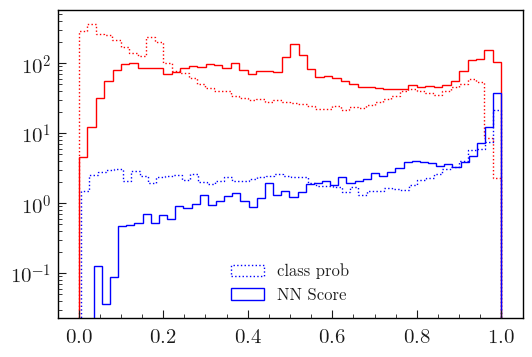

In [14]:
"""
compare the NN score vs the "class probabilities"
"""


pred_key = nominal_model
fig, ax = plt.subplots()

weight_columns = ['selection_weight', 'weights']
weight_columns = ['gen_weights_balanced']
weight_columns = ['weights']

w = combine_weight_columns(df, weight_columns=weight_columns)
                           
kw = dict(bins=50, histtype='step')
ax.hist( df[cls0][f'{pred_key}_prob'], weights=w[cls0], color='red', ls=':', **kw)
ax.hist( df[cls1][f'{pred_key}_prob'], weights=w[cls1], color='blue', ls=':', **kw, label='class prob')

ax.hist( df[cls0][f'{pred_key}'], weights=w[cls0], color='red',  **kw)
ax.hist( df[cls1][f'{pred_key}'], weights=w[cls1], color='blue', label='NN Score', **kw, )

ax.set_yscale('log')
ax.legend()

print()

### Calibrate the activation function
Here we calibrate the the activation function by playing around with the logistic function in order to improve the speedup.

In [15]:
bare_model = remove_final_activation(mf.model)
bare_res = bare_model.predict(df[mf.features], batch_size=mf.batch_size)


pars =     [ (1, 1, 1),
    (2, 1, 1),
    (1, 2, 1),
    (0.5,2,1),
    (1,3,1),
    (1,2,0.5),
    (1, 1, 2),
    (2, 1, 2),
    (0.5,1,2),
           ]


results = {}
logistic_names = []
for par in pars:
    name = "logistic_%s_%s_%s"%par
    df[name] = logistic(bare_res, *par)
    logistic_names.append(name)
    print(name)

    _ = get_class_probability(df, "Level3", 
                              pred=name, 
                              # weight_columns=['selection_weight', 'gen_weights'],
                              # weight_columns=['sel_gen_weights'],
                              weight_columns=['weights'], 
                              # weight_columns=['gen_weights_balanced'],
                              bins=100, return_func="polyfit")



41/41 [==============================] - 0s 5ms/step
logistic_1_1_1
coefs = array([ 10.10520949, -19.08367607,  17.07661409,  -7.76527882])
logistic_2_1_1
coefs = array([ 31.30700159, -59.3579467 ,  42.15264572, -13.25925149])
logistic_1_2_1
coefs = array([  7.67774265, -18.88610523,  17.66170315,  -6.40735912])
logistic_0.5_2_1
coefs = array([  7.86364025, -17.4311714 ,  14.77805192,  -5.12108038])
logistic_1_3_1
coefs = array([ 17.88091319, -35.48135356,  23.41820924,  -5.49021505])
logistic_1_2_0.5
coefs = array([ 34.34086403, -69.27243368,  49.2827938 , -12.9768203 ])
logistic_1_1_2
coefs = array([  9.0817693 , -14.25581442,  10.34410519,  -5.5991977 ])
logistic_2_1_2
coefs = array([ 17.13453069, -29.00006595,  19.32684693,  -7.66111108])
logistic_0.5_1_2
coefs = array([  7.43411827, -11.01808734,   7.96599297,  -4.8646417 ])


/home/navidkrad/work/i3kiss/utils/speedup_utils.py:533: RuntimeWarning: overflow encountered in square
  return 1 / ((1 + a * np.exp(-c*(x-b)))**(1/a))


/home/navidkrad/work/i3kiss/utils/speedup_utils.py:693: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)


truth {'alpha': 0.8, 'ls': None, 'lw': 2}

n_photons_passed = 3.56e+13
n_photons_total  = 3.00e+15
--------------
ratio = 84.29


n_eff_passed = 5.85e+04
n_eff_total  = 1.18e+04
--------------
ratio = 4.95e+00

speed_passed = 1.64e-09
speed_total  = 3.94e-12
--------------
ratio = 4.17e+02

84.28605204474425



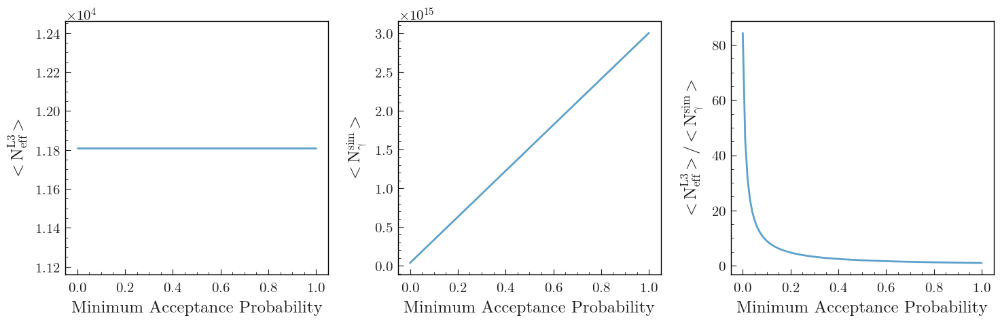

In [16]:
## Best Case Scenario (truth based prediction):

passed = df['passed']
pred_truth = df['passed']
w_sel = df['selection_weight']
w_flux = df['weights']
n_photons = df['n_photons']


sdf = get_pred_speed_up(df, pred_truth, min_pred_range=np.linspace(0,1,100))
fig, axs = make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs={'truth':sdf}, legend=False)

n_photons_passed = (w_sel * n_photons)[passed].sum()
n_photons_total  = (w_sel * n_photons).sum()


n_eff_passed = calc_n_eff( (w_flux * w_sel ) )
n_eff_total  = calc_n_eff( (w_flux * w_sel )[passed] )

print(
f"""
n_photons_passed = { n_photons_passed:0.2e}
n_photons_total  = { n_photons_total:0.2e}
--------------
ratio = {n_photons_total/n_photons_passed:0.2f}


n_eff_passed = { n_eff_passed:0.2e}
n_eff_total  = { n_eff_total:0.2e}
--------------
ratio = {n_eff_passed/n_eff_total:0.2e}

speed_passed = {n_eff_passed/n_photons_passed:0.2e}
speed_total  = {n_eff_total/n_photons_total:0.2e}
--------------
ratio = {n_eff_passed/n_photons_passed / (n_eff_total/n_photons_total):0.2e}

{n_photons_total/n_photons_passed}
"""
)



## Prediction Correlation to Computation Cost?

In [19]:
def label_sim_levels(df, sim_levels=['generated', 'triggered', 'filtered', 'Level3'], key='sim_level'):
    masks = {}
    for i, t in enumerate(sim_levels):
        query_this = f'{t}==1'
        query_rest = [f'{t_}==0' for t_ in sim_levels if sim_levels.index(t_) > sim_levels.index(t) ]
        query = " & ".join( [query_this] + query_rest)
        mask = df.query(query).index
        print( query )
        masks[t] = mask
        df.loc[mask, key] = t
    return df, masks



sim_levels = ['generated', 'triggered', 'filtered', 'Level3']
_ = label_sim_levels(df)

generated==1 & triggered==0 & filtered==0 & Level3==0
triggered==1 & filtered==0 & Level3==0
filtered==1 & Level3==0
Level3==1


In [54]:
matplotlib.colors.NoNorm

matplotlib.colors.NoNorm

10000.0 9.70e+05
1000.0 1.91e+05
200.0 5.14e+04
1.0 5.72e+03


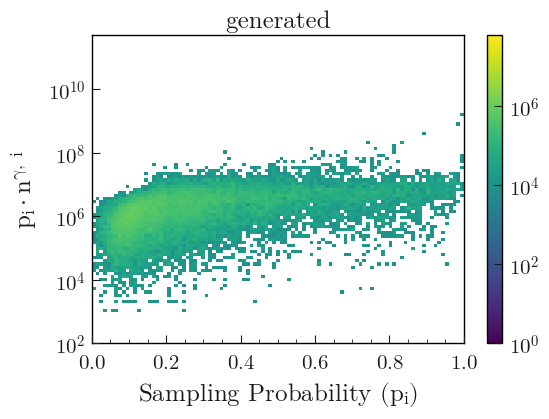

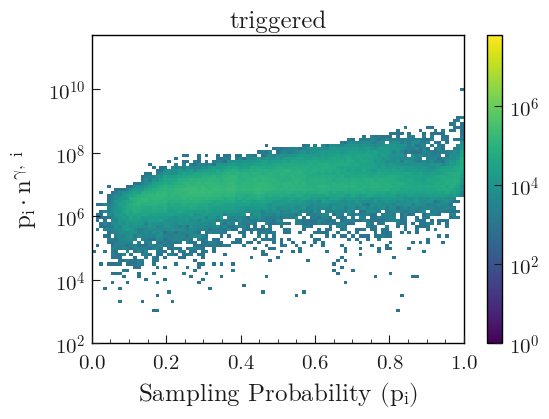

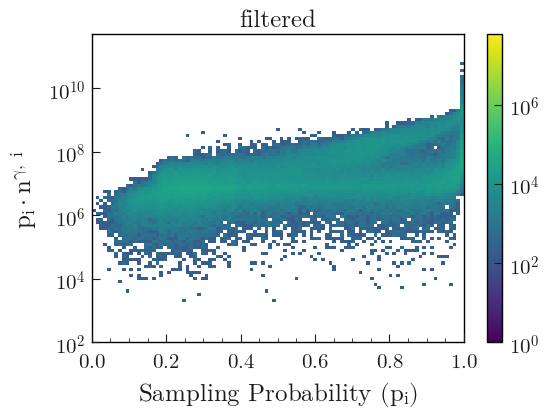

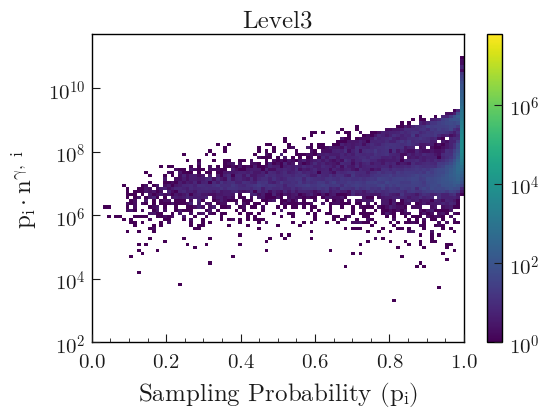

In [72]:
# vals = df[mname]



pred_name = nominal_model

sim_levels = ['generated', 'triggered', 'filtered', 'Level3']
colors = {'generated':'C1', 'triggered':'C2', 'filtered':'C5', 'Level3':'C0'}

vals = df[pred_name] * df['selection_weight'] * df['n_photons']
key = 'sim_level'

hkw = dict(bins=(np.linspace(0,1,100), np.geomspace(1E2,5E11,100) ),  norm='log')

for level in sim_levels:
    fig, ax = plt.subplots()
    mask = df.query(f'sim_level=="{level}"').index

    counts, xedges, yedges, im = ax.hist2d(df[pred_name][mask], (df['n_photons'])[mask], weights=df['selection_weight'][mask], **hkw)
    im.set_clim(1, 6E7)
    ax.set_yscale('log')
    ax.set_xlabel("Sampling Probability ($p_{i}$)")
    ax.set_ylabel("$p_{i} \cdot n^{\gamma,\ i}$")
    cbar = fig.colorbar(im, ax=ax)

    ax.set_title(level)
    ax.set_yscale('log')
    print(np.min( np.where(counts==0, 1E11, counts) ), "%0.2e"%np.max(counts))

i+=1



In [66]:
#"%0.2e"%np.min(counts)
np.min( np.where(counts==0, 1E11, counts) )

1.0

In [46]:
a = ax.hist2d(df[pred_name][mask], (df['n_photons'])[mask], weights=df['selection_weight'][mask], **hkw)

a.set_clim

AttributeError: 'tuple' object has no attribute 'set_clim'

In [59]:
np.max(counts)

9140000.0

In [18]:
# vals = df[mname]

fig, ax = plt.subplots()


pred_name = nominal_model


sim_levels = ['generated', 'triggered', 'filtered', 'Level3']
colors = {'generated':'C1', 'triggered':'C2', 'filtered':'C5', 'Level3':'C0'}


vals = df[pred_name] * df['selection_weight'] * df['n_photons']
# vals = df['gen_weights']
vals = df['sel_gen_weights']  * df['n_photons']
key = 'sim_level'
for level in sim_levels:

    ax.scatter(df['energy_per_nucleon'][mask], vals[mask], s=0.4, alpha=0.1, label=level, color=colors[level])

    ax.set_yscale('log')
    ax.set_xlabel("Primary Energy ($p_{i}$)")
    ax.set_ylabel("$w^{sel.}_{i} \cdot p_{i} \cdot n^{\gamma,\ i}$")
    
ax.set_yscale('log')
ax.set_xscale("log")
#ax.set_title(mname)
ax.legend()
i+=1



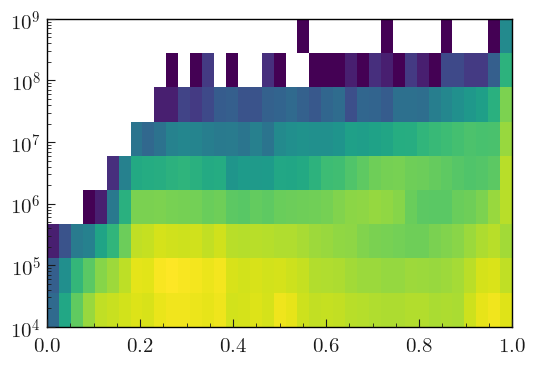

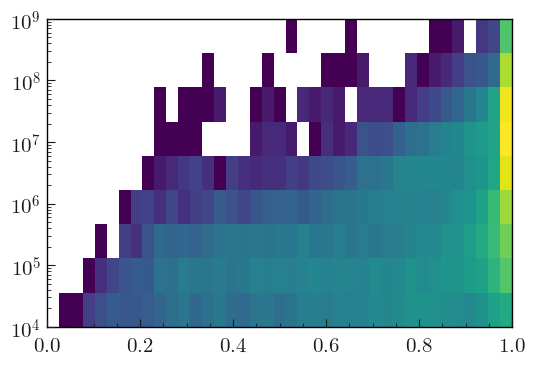

In [109]:
# vals = df[mname]

#fig, ax = plt.subplots()


pred_name = nominal_model


sim_levels = ['generated', 'triggered', 'filtered', 'Level3']
colors = {'generated':'C1', 'triggered':'C2', 'filtered':'C5', 'Level3':'C0'}


vals = df[pred_name] * df['selection_weight'] * df['n_photons']
key  = 'sim_level'


hkw = dict(bins=(np.linspace(0,1,40), np.geomspace(1E4,1E9,10) ),  norm='log')

fig, ax = plt.subplots()
ax.hist2d(df[pred_name][cls0], df['energy'][cls0], **hkw )
ax.set_yscale('log')


fig, ax = plt.subplots()
ax.hist2d(df[pred_name][cls1], df['energy'][cls1], **hkw )
ax.set_yscale('log')



# ax.scatter(df[pred_name][cls0], df['energy'][cls0], s=0.1, alpha=0.1, )
# ax.scatter(df[pred_name][cls1], df['energy'][cls1], s=0.3, alpha=0.4, )

# ax.hist2d(df[pred_name][cls0], df['energy'][cls0], bins=(np.linspace(0,1,40), np.geomspace(1E4,1E9,10) ) )

# ax.set_yscale('log')
# ax.set_xlabel("Sampling Probability ($p_{i}$)")
# ax.set_ylabel("Primary Energy [GeV]")
    
# ax.set_yscale('log')
#ax.set_title(mname)
i+=1



In [ ]:
[k for k in df.columns if 'energy' in k]

In [ ]:
import matplotlib as mpl

colors = {'generated':'C1', 'triggered':'C2', 'filtered':'C5', 'Level3':'C0'}

nplots = len(model_names)
# fig, axs = plt.subplots(nrows=nplots, figsize=(9,15))
# i = 0
for mname in model_names:
    vals = df[mname]
    fig, ax = plt.subplots()
    for t in sim_levels:
        mask = masks[t]
        ax.scatter(vals[mask], vals[mask] * df['selection_weight'][mask] * df['n_photons'][mask], s=0.1, alpha=0.1, label=t, color=colors[t])
        ax.set_yscale('log')
        ax.set_xlabel("Sampling Probability ($p_{i}$)")
        ax.set_ylabel("$w^{sel.}_{i} \cdot p_{i} \cdot n^{\gamma,\ i}$")

    
    ax.set_yscale('log')
    ax.set_title(mname)
    i+=1

# axs[0].legend()


## Model Diagnostics

In [ ]:
#df['log_multiplicity'] = np.log10( df['multiplicity'])
df['log_multiplicity'] = np.log10(df['multiplicity'].replace(0, np.nan))
df = df.fillna(0)
df['log_log_multiplicity'] = np.log10(df['log_multiplicity'].replace(0, np.nan))
df = df.fillna(0)

df_ = df.query("log_rho<6")
for var in mf.features:
    fig, ax = plt.subplots()

    for sim_level in sim_levels:
        mask = df_['sim_level']==sim_level
        #var = 'log_energy'
        #ax.hist(df[mask]['pred'], bins=50, histtype='step', lw=2, label=sim_level)
        d = df_[mask]
        w = combine_weight_columns(d, weight_columns=['weights', 'selection_weight'])
        ax.hist(d[var], weights=w, bins=50, histtype='step', lw=2, label=sim_level)
        
    ax.legend()
    ax.set_xlabel(var)
    ax.set_yscale('log')

#mask

# Making Speed Up Plots

In [ ]:

df['pred']

sdfs = {}
xvals=list(np.linspace(0,1,40))
for pname in ['pseudo_pred_gauss', 'pseudo_pred_uniform', ]:
    #sdf = utils.speedup_utils.get_pred_speed_up(df, pname, min_pred_range=xvals) 
    sdf = get_pred_speed_up(df, pname, min_pred_range=xvals, full=True) 
    sdfs[pname] = sdf


ms = []

for model_name in model_names[:]:
    name = f'{model_name}_new'    
    ms.append(name)
    pred = df[model_name]
    # vals = np.where(pred<=0.5, 1E-5, pred)
    vals = pred
    sdfs[model_name] = get_pred_speed_up(df, vals, min_pred_range=xvals, full=True)
    # sdfs[model_name] = utils.speedup_utils.get_pred_speed_up(df, vals, min_pred_range=xvals)

fig, axs = make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs, legend=dict(fontsize=10))
fig, axs = make_tri_plot('n_eff_noflux_passed', 'n_photons_simulated', sdfs=sdfs, legend=dict(fontsize=10))


In [73]:
energy_edges = np.geomspace(1E2,1E10,5)
energy_cuts  = [ "energy>{low:0.2e} & energy<{high:0.2e}".format(low=energy_edges[i], high=energy_edges[i+1]) for i in range(len(energy_edges)-1) ]
energy_bin_centers = [ "{:0.2e}".format( (energy_edges[i]+energy_edges[i+1])/2) for i in range(len(energy_edges)-1) ] 


energy_bin_centers

['5.05e+03', '5.05e+05', '5.05e+07', '5.05e+09']

/home/navidkrad/work/i3kiss/utils/speedup_utils.py:691: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:691: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:691: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)


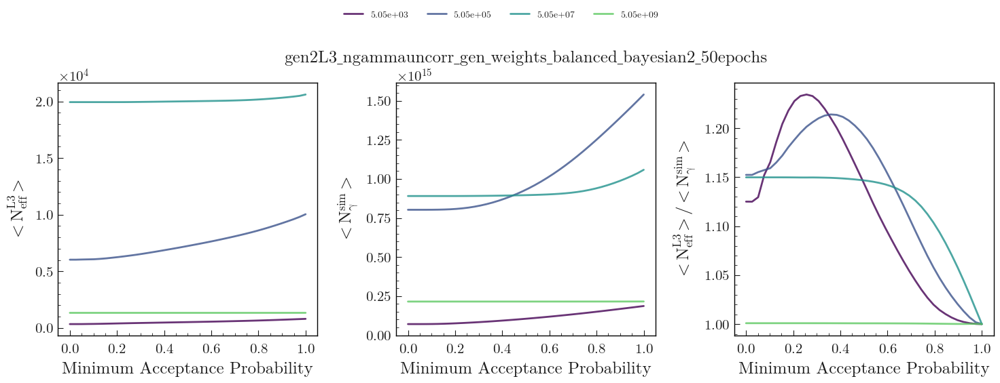

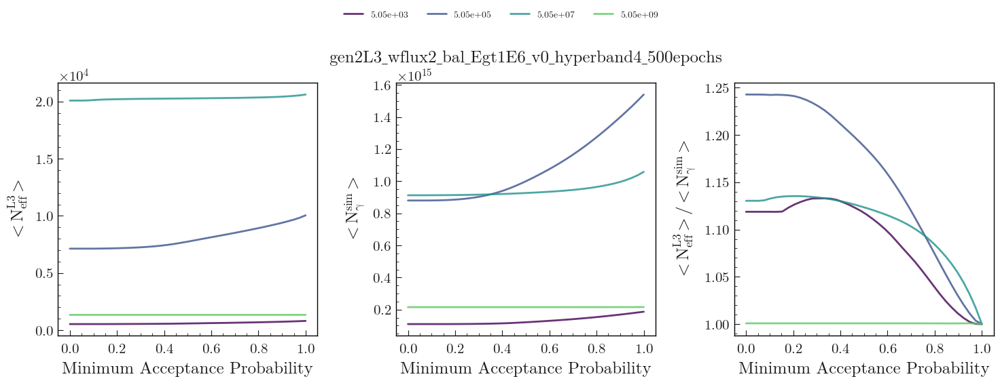

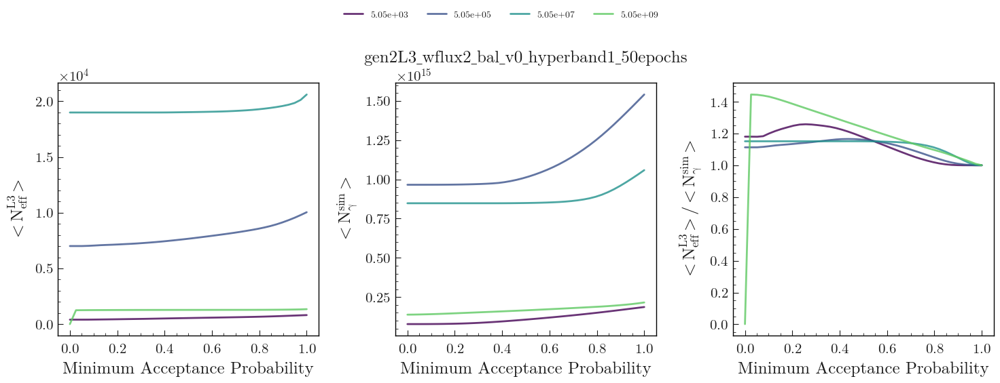

In [74]:
sdfs = {}

cmap = plt.get_cmap('viridis')
for i, ebin in enumerate(energy_bin_centers):
    infos[ebin] = {'color': cmap(i/len(energy_bin_centers)), 'label': ebin}

xvals=list(np.linspace(0,1,40))
for model_name in model_names:
    for bin_center, energy_cut in zip(energy_bin_centers, energy_cuts):
        df_ = df.query(energy_cut)
        pred = df_[model_name]
        sdfs[bin_center] = get_pred_speed_up(df_, pred, min_pred_range=xvals, full=True)
    
    fig, axs = make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs, legend=dict(fontsize=10, ncols=9))
    axs[1].set_title(model_name)

3632       0.0
6128       0.0
8338       0.0
9152       0.0
9289       0.0
          ... 
2375685    0.0
2376967    0.0
2380569    0.0
2384402    0.0
2391090    0.0
Name: Level3, Length: 1475, dtype: float64

In [84]:
for model_name, mf_ in mfs.items():
    for df_ in [mf.df_train, mf.df_test]:
        df_[model_name] = mf_.model.predict(df_[mf_.features], batch_size=mf_.batch_size)



33/33 [==============================] - 0s 3ms/step


gen2L3_wflux2_bal_Egt1E6_v0_hyperband4_500epochs
energy>1.00e+04 & energy<1.00e+06
2 ['C0', 'C1', 'C0', 'C1'] ['test (pos)', 'test (neg)', 'train (pos)', 'train (neg)']
3 ['C0', 'C1', 'C0', 'C1'] ['test (pos)', 'test (neg)', 'train (pos)', 'train (neg)']
{'dpi': 100, 'bbox_inches': 'tight'}
plot saved in: /data/user/navidkrad/plots/cascades_v0.4_L3/models/gen2L3_wflux2_bal_v0_hyperband1_50epochs/gen2L3_wflux2_bal_Egt1E6_v0_hyperband4_500epochs.png
directory /data/user/navidkrad/plots/cascades_v0.4_L3/models/gen2L3_wflux2_bal_v0_hyperband1_50epochs/gen2L3_wflux2_bal_Egt1E6_v0_hyperband4_500epochs.png --> 
https://convey.icecube.wisc.edu/data/user/navidkrad/plots/cascades_v0.4_L3/models/gen2L3_wflux2_bal_v0_hyperband1_50epochs/gen2L3_wflux2_bal_Egt1E6_v0_hyperband4_500epochs.png
energy>1.00e+06 & energy<1.00e+08
2 ['C0', 'C1', 'C0', 'C1'] ['test (pos)', 'test (neg)', 'train (pos)', 'train (neg)']
3 ['C0', 'C1', 'C0', 'C1'] ['test (pos)', 'test (neg)', 'train (pos)', 'train (neg)']
{'dpi'

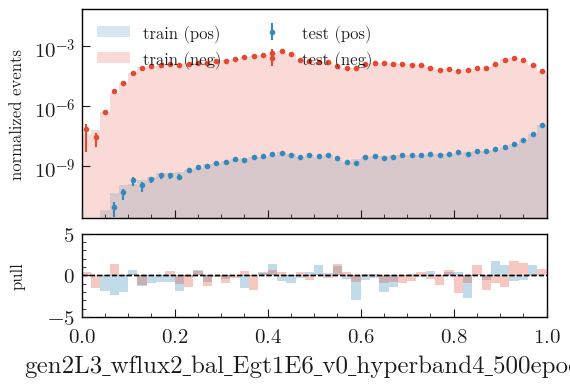

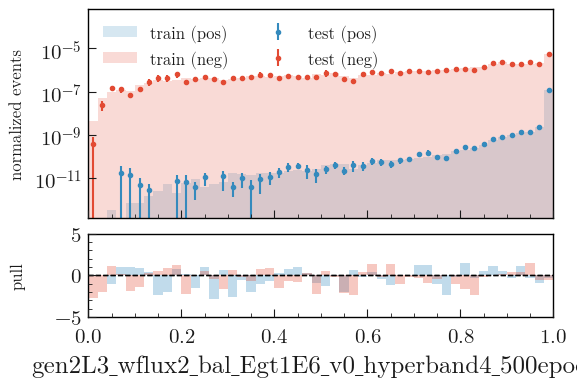

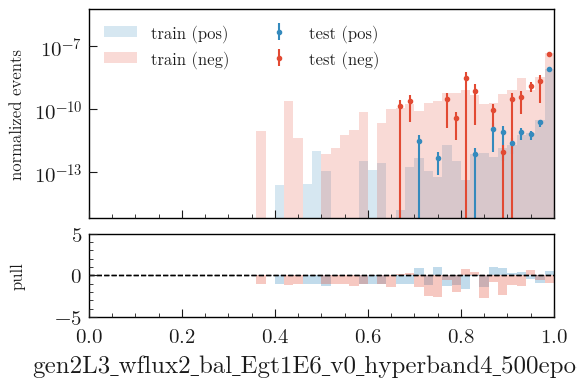

In [86]:
mf.df_train_sample = mf._df_train
mf.df_test_sample = mf._df_test


model_name = model_names[1]
print(model_name)
for bin_center, energy_cut in zip(energy_bin_centers, energy_cuts):
    if energy_cut in [energy_cuts[0]]:
        continue

    print(energy_cut)
    mf.plot_predictions(variable=model_name, query=energy_cut, weights='sel_gen_weights')







In [96]:
# energy_bins = [0, 100_000, 1_000_000, 10_000_000, 100_000_000]
# energy_bins = np.geomspace(1,1E8,11)

energy_edges = np.geomspace(600,1E9,11)
energy_cuts  = [ "energy>{0} & energy<{1}".format(energy_edges[i], energy_edges[i+1]) for i in range(len(energy_edges)-1) ]
energy_bin_centers = [ "{:0.2e}".format( (energy_edges[i]+energy_edges[i+1])/2) for i in range(len(energy_edges)-1) ] 


sdfs = {}
for bin_center, energy_cut in zip(energy_bin_centers, energy_cuts):

    # df_ = df.query(f"energy>{energy_threshold}")
    df_ = df.query(energy_cut)
    # sdfs[model_name] = get_pred_speed_up(df, vals, min_pred_range=xvals, full=True)    
    res = get_pred_speed_up(df_, 'pseudo_pred_uniform', min_pred_range=[0], full=True)
    sdfs[bin_center] = res


res = pd.DataFrame({k:dict(v.loc[0]) for k,v in sdfs.items()}).T
#sdfs[0].loc[0]
res.index.name = 'min_pred'


In [103]:
res['min_pred']

min_pred
1.56e+03    1.56e+03
6.52e+03    6.52e+03
2.73e+04    2.73e+04
1.15e+05    1.15e+05
4.80e+05    4.80e+05
2.01e+06    2.01e+06
8.42e+06    8.42e+06
3.53e+07    3.53e+07
1.48e+08    1.48e+08
6.19e+08    6.19e+08
Name: min_pred, dtype: object

In [106]:
res['min_pred']

min_pred
1.56e+03    1.56e+03
6.52e+03    6.52e+03
2.73e+04    2.73e+04
1.15e+05    1.15e+05
4.80e+05    4.80e+05
2.01e+06    2.01e+06
8.42e+06    8.42e+06
3.53e+07    3.53e+07
1.48e+08    1.48e+08
6.19e+08    6.19e+08
Name: min_pred, dtype: object

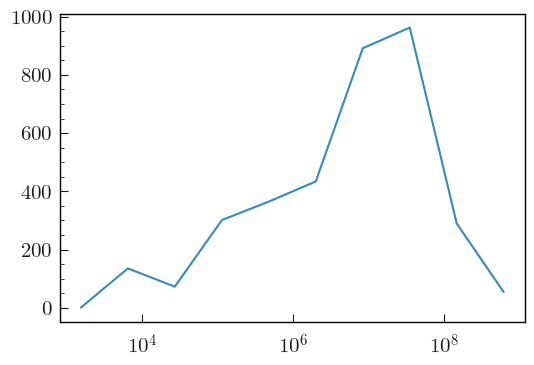

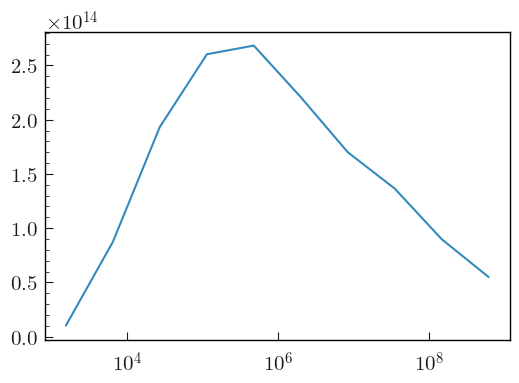

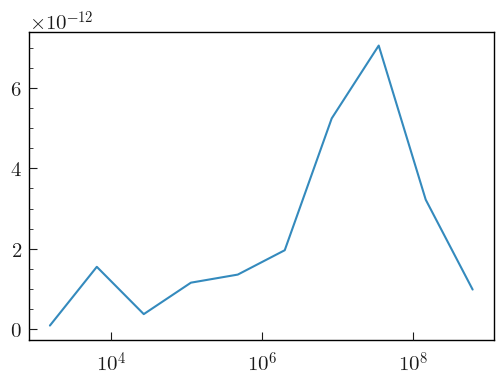

In [110]:


fig, ax = plt.subplots()
ax.plot(res['min_pred'].astype(float), res['n_eff_passed'], label='n_eff_passed')
ax.set_xscale('log')

fig, ax = plt.subplots()
ax.plot(res['min_pred'].astype(float), res['n_photons_simulated'], label='n_photons_simulated')
ax.set_xscale('log')

fig, ax = plt.subplots()
ax.plot(res['min_pred'].astype(float), res['n_eff_passed']/res['n_photons_simulated'], label='n_')
ax.set_xscale('log')

# make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs={'test':res}, legend=dict(fontsize=10) )

/home/navidkrad/work/i3kiss/utils/speedup_utils.py:691: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:691: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:691: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:691: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:691: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)


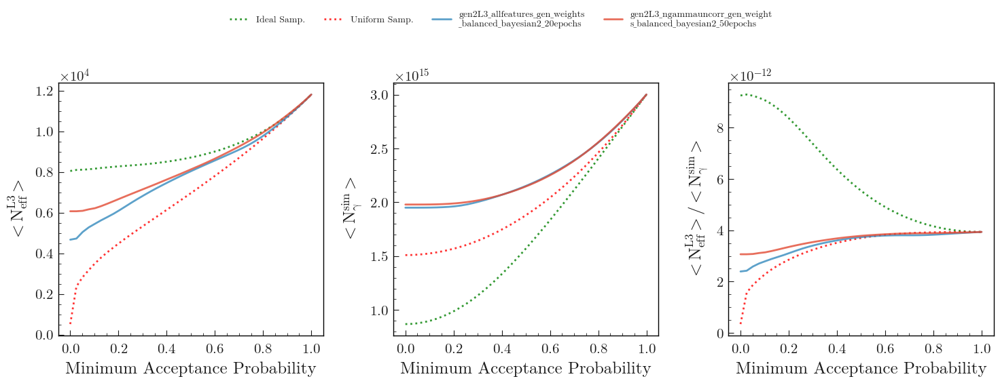

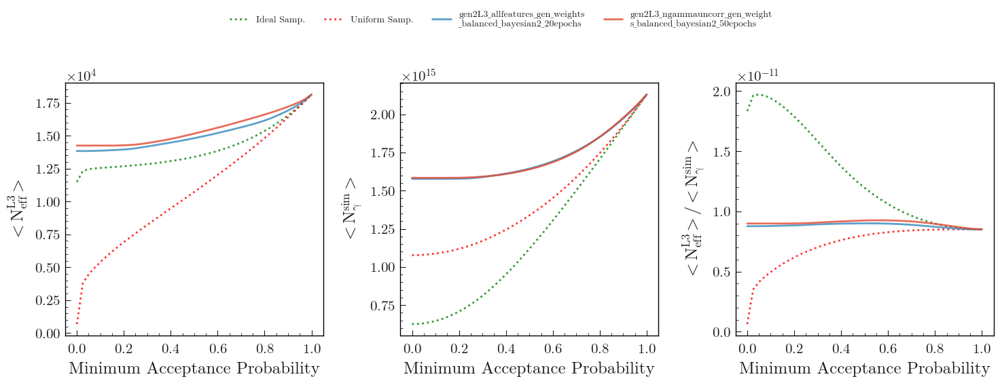

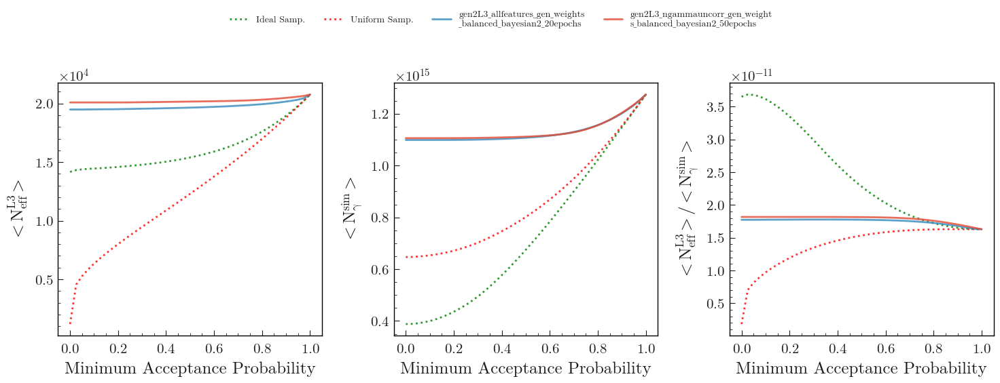

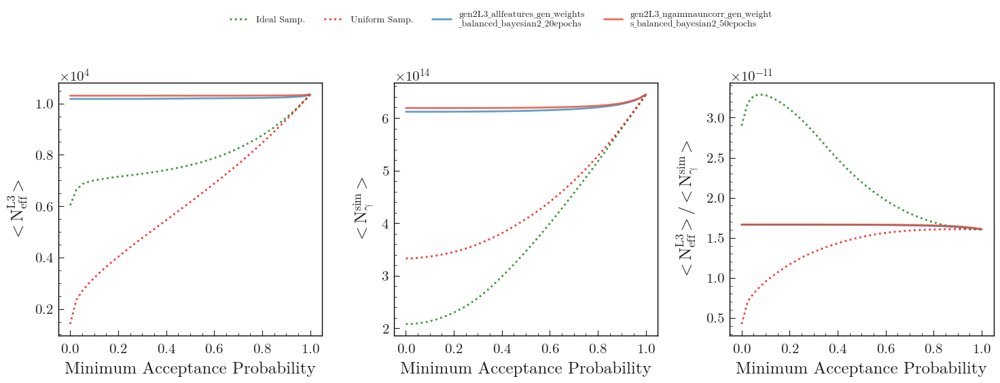

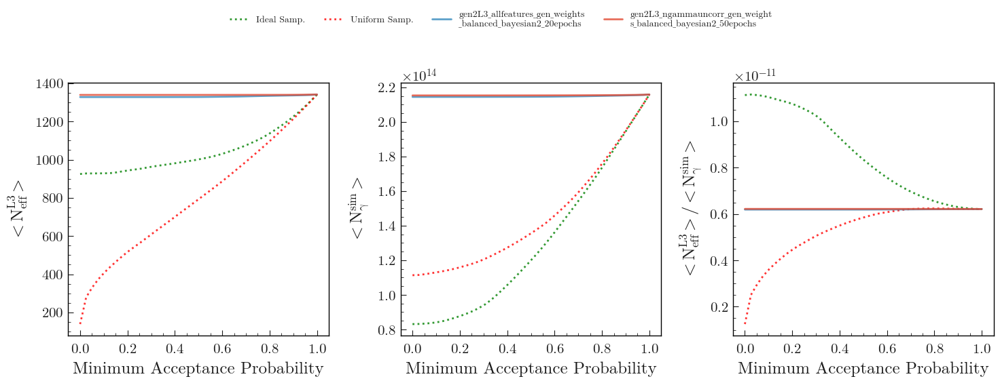

In [79]:

energy_bins = [0, 100_000, 1_000_000, 10_000_000, 100_000_000]

keys = ['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs', 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs']

edfs = {}
for energy_threshold in energy_bins:
    for model_name in keys:
        df_ = df.query(f"energy>{energy_threshold}")
        pred = df_[model_name]
        sdfs[model_name] = get_pred_speed_up(df_, pred, min_pred_range=xvals, full=True)
        edfs[energy_threshold] = sdfs[model_name]
    fig, axs = make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs={k:sdfs[k] for k in keys}, legend=dict(fontsize=10), norm_idx=None )


In [81]:
edfs.keys()

dict_keys([0, 100000, 1000000, 10000000, 100000000])

/tmp/ipykernel_16087/2785421757.py:6: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)


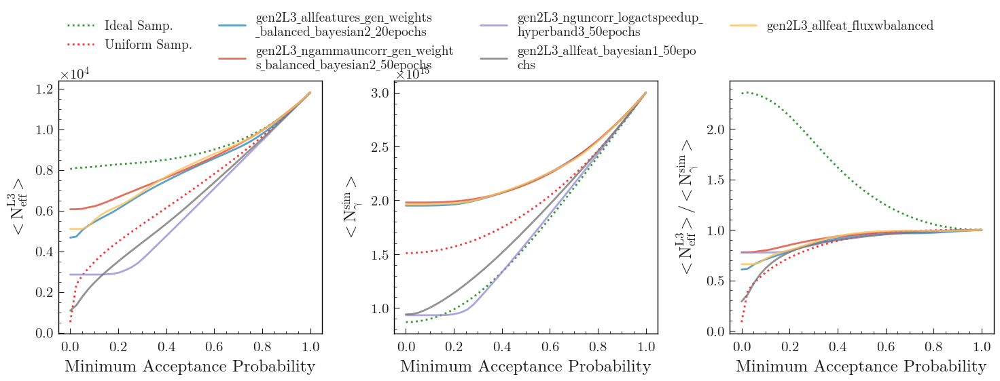

In [28]:
fig, axs = make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs, legend=dict(fontsize=14))

/tmp/ipykernel_16087/2785421757.py:6: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)


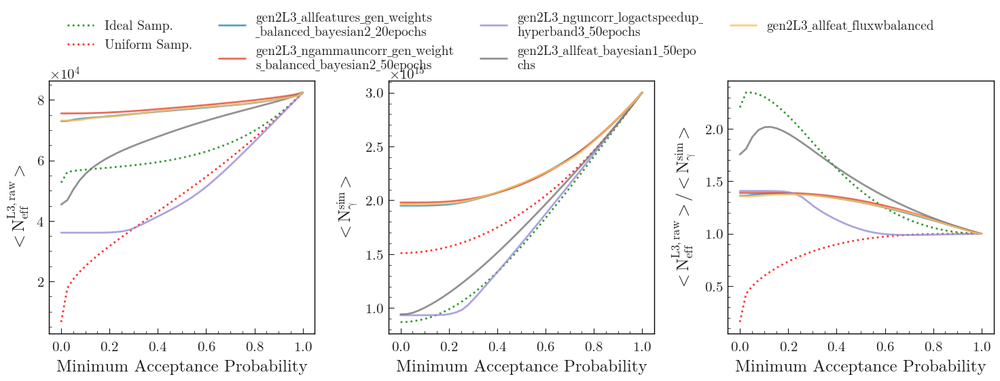

In [31]:
fig, axs = make_tri_plot('n_eff_noflux_passed', 'n_photons_simulated', sdfs=sdfs, legend=dict(fontsize=14))
#sdf

/tmp/ipykernel_16087/2785421757.py:6: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)


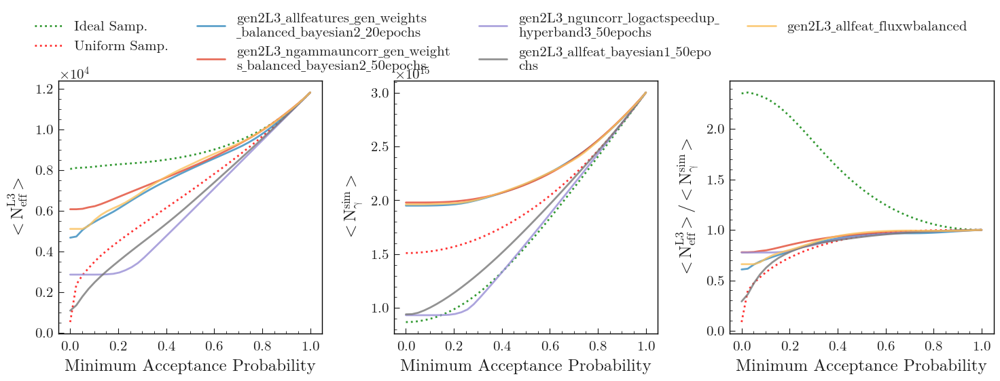

In [19]:
fig, axs = make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs, norm_idx=-1)


/tmp/ipykernel_16087/2785421757.py:6: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)


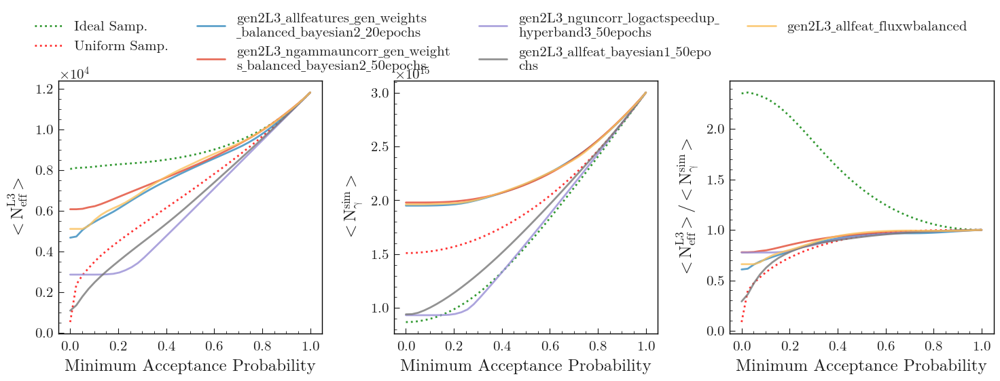

In [18]:
fig, axs = make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs, norm_idx=-1)


# Junks

In [ ]:
# Junks

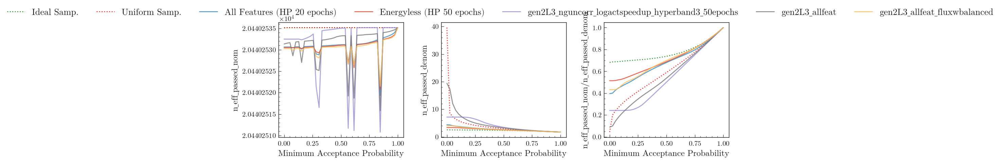

In [ ]:
fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed_nom', 'n_eff_passed_denom', sdfs=sdfs, norm_idx=-1)


In [ ]:
"""
Maximize the speed_up by calibrating the logistic function


"""

def __speed_up(df,
            pred='pred',
            ):

    pred = df[pred]
    min_pred = 0.2
    step_pred = np.where(pred<=min_pred, min_pred, pred )
    w_pred, mask_sample = get_weight_from_pred(step_pred)

    n_photons = df['n_photons']
    w_gen = df['weights']
    w_sel = df['selection_weight']
    passed = df['passed']

    w_pred_passed = w_pred[passed]

    n_photons_sampled_expected = (n_photons * step_pred * w_sel).sum() 
    n_eff_sampled_expected = calc_expected_n_eff(w_pred_passed)

    n_photons_nominal = (n_photons * w_sel).sum()
    n_eff_nominal = np.sum(w_pred_passed)

    speed_sampled = n_eff_sampled_expected/n_photons_sampled_expected
    speed_nominal = n_eff_nominal/n_photons_nominal

    speed_up = speed_sampled/speed_nominal
    # print(f"""{speed_sampled = }, 
    #         {speed_nominal = }, 
    #         {speed_up      = }""")
    print(f"""{speed_up = }""")

    return speed_up

#speed_up(df, 'pseudo_pred_gauss',)

bare_model = remove_final_activation(mf.model)
bare_res = bare_model.predict(df[mf.features], batch_size=mf.batch_size)

def speed_up_wrapper(params):
    df['logistic_pred'] = logistic(bare_res, *params)
    # print(params)
    # -1 * 
    xvals=list(np.linspace(0,0.3,10))
    
    sdf = utils.speedup_utils.get_pred_speed_up(df, 'logistic_pred', min_pred_range=xvals) 
    speedup = max(sdf['speed_normed'])
    print(speedup, params)
    return -1 * speedup

from scipy.optimize import minimize

result = minimize(speed_up_wrapper, x0=(1,1,1), method='Nelder-Mead')




41/41 [==============================] - 1s 10ms/step
0.8723096234162918 [1. 1. 1.]
0.8728926925765838 [1.05 1.   1.  ]
0.8711866524904035 [1.   1.05 1.  ]
0.8709236303758287 [1.   1.   1.05]
0.8736677388815091 [1.03333333 1.03333333 0.95      ]
0.8755646712049701 [1.05 1.05 0.9 ]
0.8756725506837834 [1.06666667 0.98333333 0.93333333]
0.8782948536463548 [1.1  0.95 0.9 ]
0.8794731527232066 [1.13333333 1.         0.86666667]
0.8842377688676755 [1.2 1.  0.8]
0.8880296188178549 [1.18333333 1.         0.73333333]
0.8982041911187593 [1.25 1.   0.6 ]
0.8959505279533875 [1.31666667 0.91666667 0.63333333]
0.9212854692225579 [1.41111111 0.99444444 0.45555556]
0.9734659628544534 [1.56666667 1.01666667 0.23333333]
0.9836726350117169 [1.55555556 0.95555556 0.17777778]
0.9943819466661751 [ 1.73333333  0.93333333 -0.13333333]
0.9905728726589025 [ 1.71666667  1.05       -0.16666667]
0.8882990815991091 [ 2.09444444  1.         -0.64444444]
0.9580591211937999 [1.46111111 1.         0.28888889]
0.96171499

0.997877239656616 [100, 0, 10]
-0.997877239656616


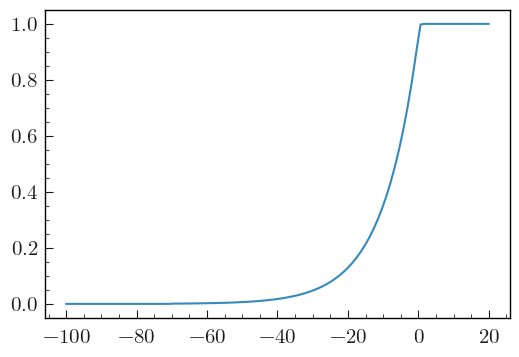

In [ ]:
#speed_up_wrapper()

params = [100,  0 , 10]
x = np.linspace(-100,20,100)
plt.plot(x, logistic(x, *params))
print( speed_up_wrapper(params))



In [ ]:
[k for k in df.columns if 'weight' in k]

['weights',
 'selection_weight',
 'balanced_weight',
 'gen_weights_balanced',
 'gen_weights',
 'sel_gen_weights',
 'normalized_balanced_weights',
 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs',
 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs_prob',
 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs',
 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs_prob']

In [ ]:
mfs

{'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs': <ModelFactory.ModelFactory at 0x7fb2bac3ac50>,
 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs': <ModelFactory.ModelFactory at 0x7fb2c33f5190>,
 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs': <ModelFactory.ModelFactory at 0x7fb2c07afd90>,
 'gen2L3_allfeat': <ModelFactory.ModelFactory at 0x7fb2bac40690>,
 'gen2L3_allfeat_fluxwbalanced': <ModelFactory.ModelFactory at 0x7fb2bae56310>}

In [ ]:

mf = mfs['gen2L3_nguncorr_logactspeedup_hyperband3_50epochs']
mf = mfs['gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs']

bare_model = remove_final_activation(mf.model)
bare_res = bare_model.predict(df[mf.features], batch_size=mf.batch_size)


41/41 [==============================] - 1s 11ms/step


In [ ]:
mf.model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (Batch  (None, 23)                92        
 Normalization)                                                  
                                                                 
 Dense_0_224_leaky_relu (De  (None, 224)               5376      
 nse)                                                            
                                                                 
 dropout (Dropout)           (None, 224)               0         
                                                                 
 Dense_1_224_leaky_relu (De  (None, 224)               50400     
 nse)                                                            
                                                                 
 Dense_2_112_leaky_relu (De  (None, 112)               25200     
 nse)                                                   

In [ ]:
# utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)
# plt.ylim(0,2)

# sdf[['min_pred', 'speed', 'speed_normed']]




/home/navidkrad/work/i3kiss/utils/speedup_utils.py:475: RuntimeWarning: overflow encountered in exp
  return 1 / ((1 + a * np.exp(-c*(x-b)))**(1/a))
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:475: RuntimeWarning: overflow encountered in multiply
  return 1 / ((1 + a * np.exp(-c*(x-b)))**(1/a))


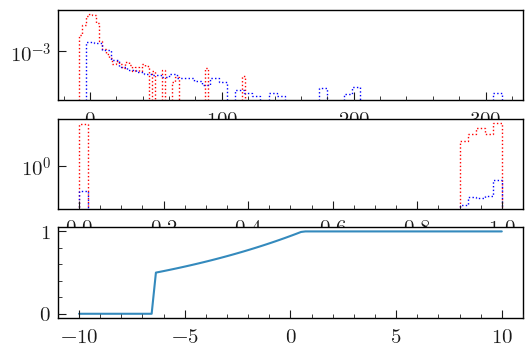

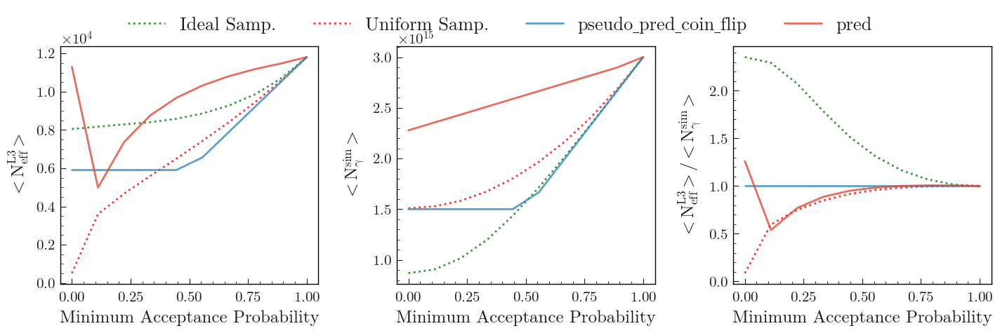

In [ ]:
fig, axs = plt.subplots(3)

ax=axs[0]
kw = dict(bins=50, histtype='step', )
_ = ax.hist( bare_res[cls0], weights=df[cls0]['sel_gen_weights'], color='red', ls=':', label='cls0', **kw)
_ = ax.hist( bare_res[cls1], weights=df[cls1]['sel_gen_weights'], color='blue', ls=':', label='cls1', **kw)
ax.set_yscale('log')

params =[1000,0.5,100]
ax=axs[1]
# act = logistic(*params)
vals = logistic(bare_res, *params)
_ = ax.hist( vals[cls0], weights=df[cls0]['sel_gen_weights'], color='red', ls=':', label='cls0', **kw)
_ = ax.hist( vals[cls1], weights=df[cls1]['sel_gen_weights'], color='blue', ls=':', label='cls1', **kw)
ax.set_yscale('log')

ax=axs[2]
x = np.linspace(min(bare_res), max(bare_res), 1000)
x = np.linspace(-10,10,100)
plt.plot(x, logistic(x, *params))


sdfs['pred'] = utils.speedup_utils.get_pred_speed_up(df, vals.flatten(), min_pred_range=xvals)

fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)


['gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs',
 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs']

In [ ]:
def get_pred_speed(pred, passed=None, n_photons=None, gen_weights=None, sel_weights=None, full=False):
    pred_passed = pred[passed]
    w_pred, mask_sample = get_weight_from_pred(pred)

    
    n_eff_passed = calc_expected_n_eff(w_pred[passed] * gen_weights[passed] * sel_weights[passed], pred[passed] )
    n_eff_noflux_passed = calc_expected_n_eff(w_pred[passed] * sel_weights[passed], pred[passed] )
    # n_eff_passed = calc_n_eff( (w_pred * gen_weights * sel_weights)[passed & mask_sample] )
    n_photons_simulated = (n_photons * sel_weights * pred).sum()
    speed = n_eff_passed / n_photons_simulated
    results = dict(n_eff_passed=n_eff_passed, n_photons_simulated=n_photons_simulated, n_eff_noflux_passed=n_eff_noflux_passed, speed=speed)
    if full:
        results.update(
            n_eff_passed_nom = (pred[passed] * w_pred[passed] * gen_weights[passed] * sel_weights[passed]).sum()**2,
            n_eff_passed_denom = (pred[passed] * (w_pred[passed] * gen_weights[passed] * sel_weights[passed])**2 ).sum(),
        )
    return results


def get_pred_speed_up(df,
                    pred='pred',
                    passed='passed',
                    col_n_photons='n_photons',
                    col_gen_weights='weights',
                    col_sel_weights='selection_weight',
                    min_pred_range=np.linspace(0,1, 100),
                    full=False):
    """
        calculate summary information for a given prediction
    """
    steps = []

    pred = df[pred] if isinstance(pred, str) else pred
    passed = df[passed].astype(bool) if isinstance(passed, str) else passed
    #print(passed)
    w_gen = df[col_gen_weights] if isinstance(col_gen_weights, str) else col_gen_weights
    w_sel = df[col_sel_weights] if isinstance(col_sel_weights, str) else col_sel_weights
    n_photons = df[col_n_photons] if isinstance(col_n_photons, str) else col_n_photons


    speed_dict_nominal = get_pred_speed(np.ones_like(pred), 
                                        passed=passed, 
                                        n_photons=n_photons, 
                                        gen_weights=w_gen, 
                                        sel_weights=w_sel)
    speed_nominal = speed_dict_nominal['speed']
    n_eff_passed_nominal = speed_dict_nominal['n_eff_passed']
    n_photons_simulated_nominal = speed_dict_nominal['n_photons_simulated']

    for min_pred in min_pred_range:
        step_pred = np.where(pred<min_pred, min_pred, pred )

    
        speed_dict = get_pred_speed(step_pred, passed=passed, n_photons=n_photons, gen_weights=w_gen, sel_weights=w_sel, full=full)

        n_eff_passed = speed_dict['n_eff_passed']
        n_photons_simulated = speed_dict['n_photons_simulated']
        speed = speed_dict['speed']

        n_eff_passed_normed = n_eff_passed / n_eff_passed_nominal
        n_photons_simulated_normed = n_photons_simulated / n_photons_simulated_nominal
        speed_normed = speed / speed_nominal
        
        steps_dict = dict(min_pred=min_pred,
                            **speed_dict,
                            n_eff_passed_normed=n_eff_passed_normed,
                            n_photons_simulated_normed=n_photons_simulated_normed,
                            speed_normed=speed_normed

                          )
                    
        steps.append(steps_dict)
    
    sdf = pd.DataFrame(steps)
    return sdf



In [ ]:
sdf

,min_pred,n_eff_passed,n_photons_simulated,n_eff_noflux_passed,speed,n_eff_passed_nom,n_eff_passed_denom,n_eff_passed_normed,n_photons_simulated_normed,speed_normed
0,0.000000,516.102519,1.510242e+15,6547.012635,3.417349e-13,20440.253508,39.605026,0.043701,0.503217,0.086843
1,0.111111,3601.923200,1.529008e+15,25850.747454,2.355725e-12,20440.253515,5.674817,0.304994,0.509469,0.598649
2,0.222222,4672.477824,1.582953e+15,33019.575552,2.951749e-12,20440.253515,4.374607,0.395643,0.527444,0.750114
3,0.333333,5594.390143,1.674806e+15,39380.473923,3.340321e-12,20440.253515,3.653705,0.473706,0.558050,0.848860
4,0.444444,6497.476396,1.803099e+15,45612.427337,3.603505e-12,20440.253516,3.145876,0.550175,0.600797,0.915742
5,0.555556,7423.203543,1.967235e+15,51985.518680,3.773420e-12,20440.253516,2.753562,0.628561,0.655488,0.958921
6,0.666667,8392.230327,2.168903e+15,58701.184454,3.869343e-12,20440.253516,2.435616,0.710614,0.722684,0.983298
7,0.777778,9428.384714,2.408193e+15,65917.808557,3.915129e-12,20440.253516,2.167949,0.798350,0.802416,0.994933
8,0.888889,10558.602536,2.686007e+15,73784.943154,3.930967e-12,20440.253516,1.935886,0.894052,0.894984,0.998958
9,1.000000,11809.835110,3.001177e+15,82478.000000,3.935067e-12,20440.253516,1.730782,1.000000,1.000000,1.000000


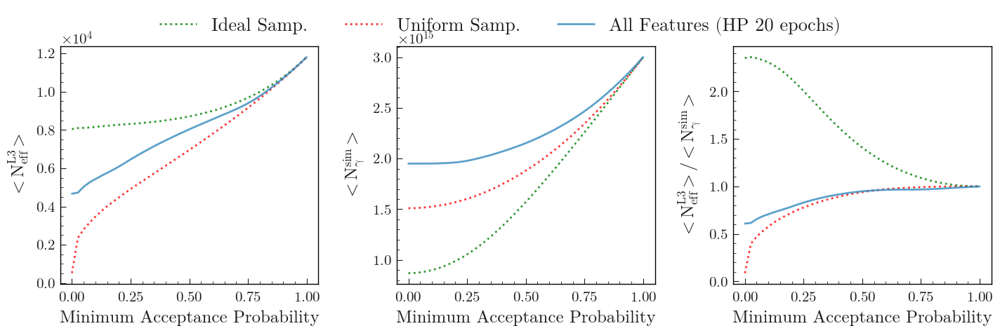

In [ ]:

df['pred']

sdfs = {}
xvals=list(np.linspace(0,1,40))
for pname in ['pseudo_pred_gauss', 'pseudo_pred_uniform', ]:
    #sdf = utils.speedup_utils.get_pred_speed_up(df, pname, min_pred_range=xvals) 
    sdf = get_pred_speed_up(df, pname, min_pred_range=xvals, full=True) 
    sdfs[pname] = sdf


ms = []

for model_name in [nominal_model]: #model_names[:]:
    name = f'{model_name}_new'    
    ms.append(name)
    pred = df[model_name]
    # vals = np.where(pred<=0.5, 1E-5, pred)
    vals = pred
    sdfs[model_name] = get_pred_speed_up(df, vals, min_pred_range=xvals, full=True)
    # sdfs[model_name] = utils.speedup_utils.get_pred_speed_up(df, vals, min_pred_range=xvals)

fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)



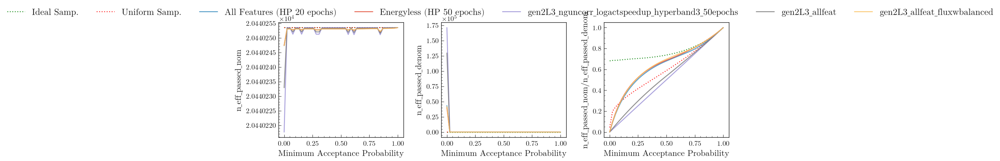

In [ ]:
fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed_nom', 'n_eff_passed_denom', sdfs=sdfs)

dict_keys(['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs', 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs', 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs', 'gen2L3_allfeat', 'gen2L3_allfeat_fluxwbalanced'])


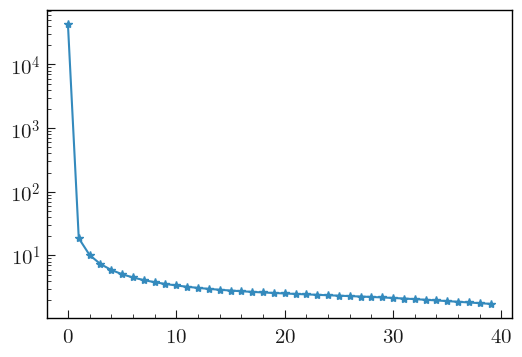

In [ ]:
print( sdfs.keys() )

plt.plot( sdfs[model_names[0]]['n_eff_passed_denom'] , marker='*')
plt.yscale("log")

In [ ]:
sdfs[model_names[0]]['n_eff_passed']

0         0.470957
1      1098.817203
2      2015.990609
3      2793.122724
4      3460.011920
5      4038.563473
6      4545.239103
7      4992.649297
8      5390.617930
9      5746.911415
10     6067.750718
11     6358.176648
12     6622.317819
13     6863.587961
14     7084.834976
15     7288.451534
16     7476.464360
17     7650.601043
18     7812.343034
19     7962.968316
20     8104.135867
21     8241.434432
22     8377.167994
23     8511.266347
24     8645.175308
25     8779.024568
26     8913.213381
27     9049.860488
28     9194.735164
29     9355.121718
30     9533.255559
31     9731.554634
32     9948.402077
33    10180.765715
34    10427.250122
35    10684.315751
36    10950.615306
37    11226.383960
38    11512.187379
39    11809.835110
Name: n_eff_passed, dtype: float64

In [ ]:
min_pred = 0.3

np.where(pred<=min_pred, min_pred, pred )

array([0.3       , 0.7263376 , 0.3       , ..., 0.6965536 , 0.3       ,
       0.97757125], dtype=float32)

generated==1 & triggered==0 & filtered==0 & Level3==0
triggered==1 & filtered==0 & Level3==0
filtered==1 & Level3==0
Level3==1


In [ ]:
print( sdfs.keys() )

sdfs[model_names[0]]['n_eff_passed']

dict_keys(['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs', 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs', 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs', 'gen2L3_allfeat', 'gen2L3_allfeat_fluxwbalanced'])


0         0.470957
1      1098.817203
2      2015.990609
3      2793.122724
4      3460.011920
5      4038.563473
6      4545.239103
7      4992.649297
8      5390.617930
9      5746.911415
10     6067.750718
11     6358.176648
12     6622.317819
13     6863.587961
14     7084.834976
15     7288.451534
16     7476.464360
17     7650.601043
18     7812.343034
19     7962.968316
20     8104.135867
21     8241.434432
22     8377.167994
23     8511.266347
24     8645.175308
25     8779.024568
26     8913.213381
27     9049.860488
28     9194.735164
29     9355.121718
30     9533.255559
31     9731.554634
32     9948.402077
33    10180.765715
34    10427.250122
35    10684.315751
36    10950.615306
37    11226.383960
38    11512.187379
39    11809.835110
Name: n_eff_passed, dtype: float64

In [ ]:
types = ['generated', 'triggered', 'filtered', 'Level3']

masks = {}

for i, t in enumerate(types):
    query_this = f'{t}==1'
    query_rest = [f'{t_}==0' for t_ in types if types.index(t_) > types.index(t) ]
    query = " & ".join( [query_this] + query_rest)
    mask = df.query(query).index
    print( query )
    masks[t] = mask
    df.loc[mask, 'level'] = t


    

generated==1 & triggered==0 & filtered==0 & Level3==0
triggered==1 & filtered==0 & Level3==0
filtered==1 & Level3==0
Level3==1


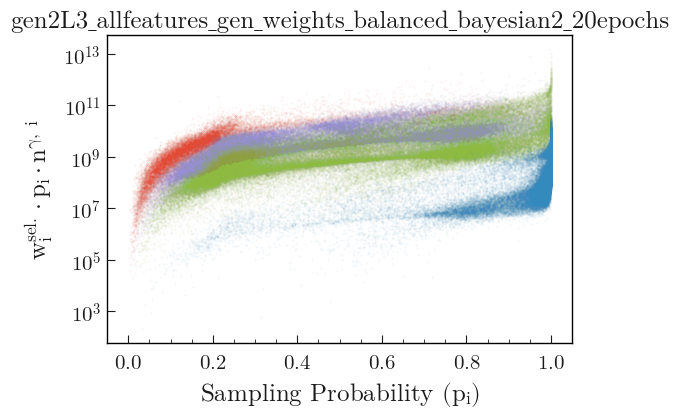

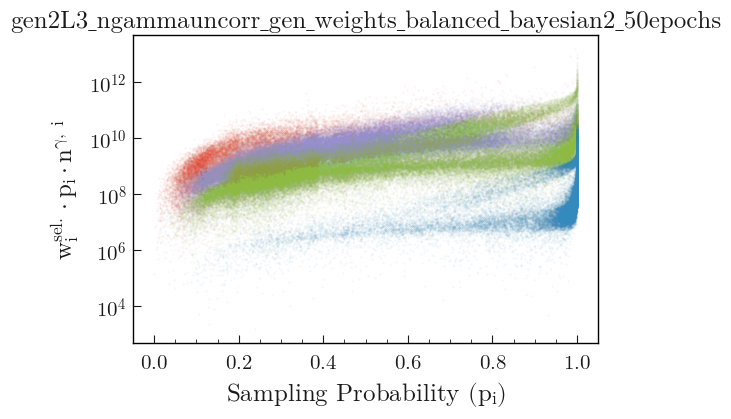

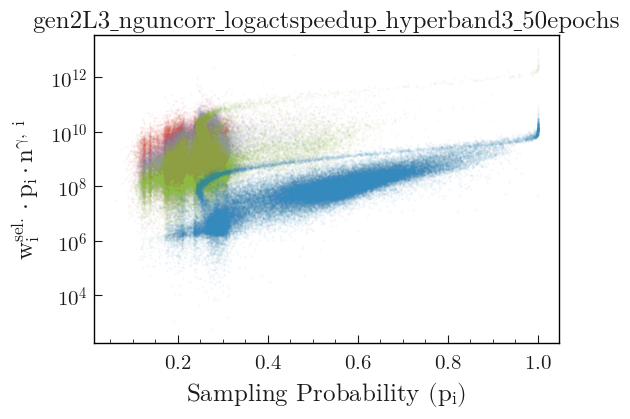

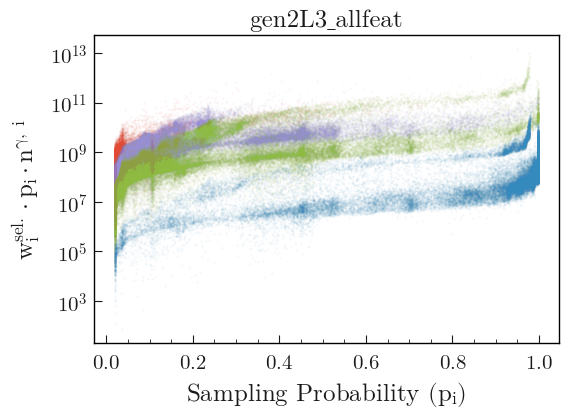

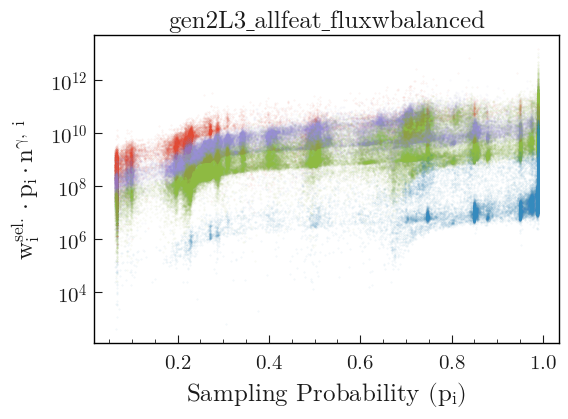

In [ ]:
import matplotlib as mpl

colors = {'generated':'C1', 'triggered':'C2', 'filtered':'C5', 'Level3':'C0'}

nplots = len(model_names)
# fig, axs = plt.subplots(nrows=nplots, figsize=(9,15))
# i = 0
for mname in model_names:
    vals = df[mname]
    fig, ax = plt.subplots()
    for t in types:
        mask = masks[t]
        ax.scatter(vals[mask], vals[mask] * df['selection_weight'][mask] * df['n_photons'][mask], s=0.1, alpha=0.1, label=t, color=colors[t])
        ax.set_yscale('log')
        ax.set_xlabel("Sampling Probability ($p_{i}$)")
        ax.set_ylabel("$w^{sel.}_{i} \cdot p_{i} \cdot n^{\gamma,\ i}$")
        
    ax.set_yscale('log')
    ax.set_title(mname)
    i+=1

# axs[0].legend()


/tmp/ipykernel_36536/3635087722.py:6: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)


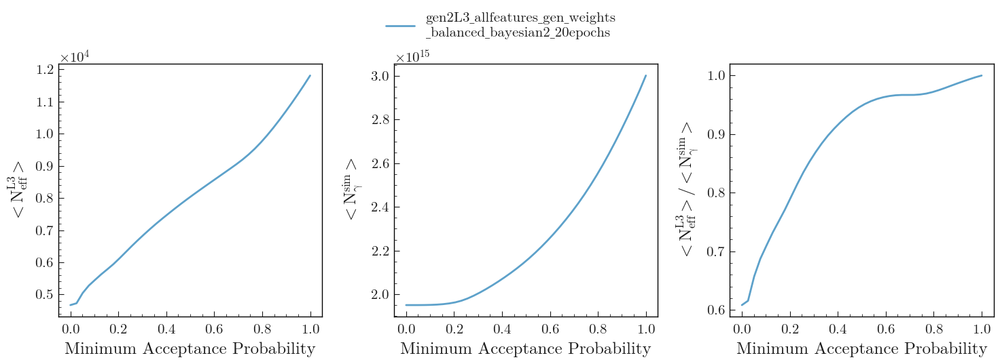

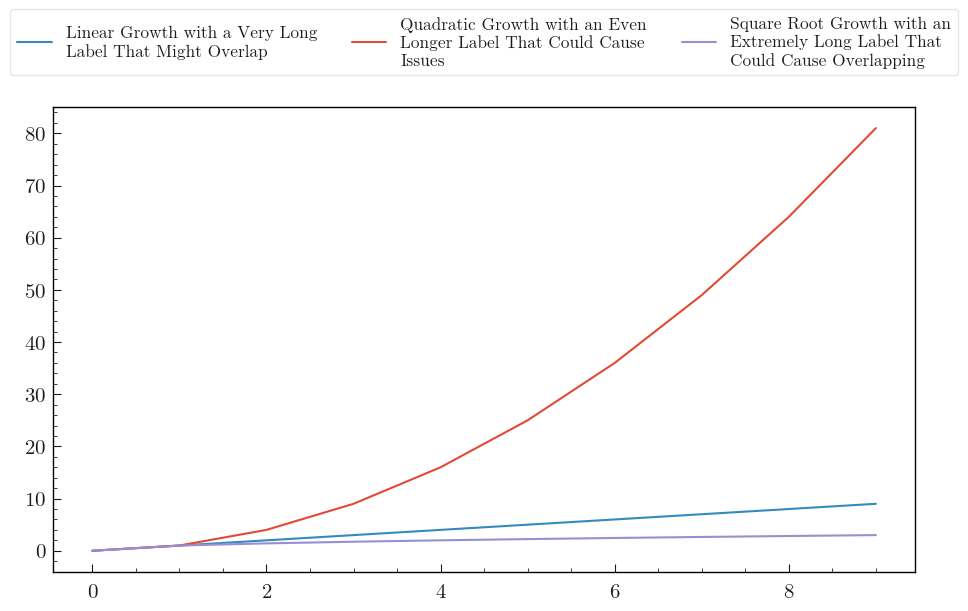

41/41 [==============================] - 1s 10ms/step
0.8723096234162918 [1. 1. 1.]
0.8728926925765838 [1.05 1.   1.  ]
0.8711866524904035 [1.   1.05 1.  ]
0.8709236303758287 [1.   1.   1.05]
0.8736677388815091 [1.03333333 1.03333333 0.95      ]
0.8755646712049701 [1.05 1.05 0.9 ]
0.8756725506837834 [1.06666667 0.98333333 0.93333333]
0.8782948536463548 [1.1  0.95 0.9 ]
0.8794731527232066 [1.13333333 1.         0.86666667]
0.8842377688676755 [1.2 1.  0.8]
0.8880296188178549 [1.18333333 1.         0.73333333]
0.8982041911187593 [1.25 1.   0.6 ]
0.8959505279533875 [1.31666667 0.91666667 0.63333333]
0.9212854692225579 [1.41111111 0.99444444 0.45555556]
0.9734659628544534 [1.56666667 1.01666667 0.23333333]
0.9836726350117169 [1.55555556 0.95555556 0.17777778]
0.9943819466661751 [ 1.73333333  0.93333333 -0.13333333]
0.9905728726589025 [ 1.71666667  1.05       -0.16666667]
0.8882990815991091 [ 2.09444444  1.         -0.64444444]
0.9580591211937999 [1.46111111 1.         0.28888889]
0.96171499

/home/navidkrad/work/i3kiss/utils/speedup_utils.py:491: RuntimeWarning: overflow encountered in exp
  return 1 / ((1 + a * np.exp(-c*(x-b)))**(1/a))
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:491: RuntimeWarning: overflow encountered in multiply
  return 1 / ((1 + a * np.exp(-c*(x-b)))**(1/a))


0.997877239656616 [100, 0, 10]
-0.997877239656616
41/41 [==============================] - 1s 10ms/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (Batch  (None, 23)                92        
 Normalization)                                                  
                                                                 
 Dense_0_224_leaky_relu (De  (None, 224)               5376      
 nse)                                                            
                                                                 
 dropout (Dropout)           (None, 224)               0         
                                                                 
 Dense_1_224_leaky_relu (De  (None, 224)               50400     
 nse)                                                            
                                                                 
 Dense_2_112_leaky

/home/navidkrad/work/i3kiss/utils/speedup_utils.py:491: RuntimeWarning: overflow encountered in exp
  return 1 / ((1 + a * np.exp(-c*(x-b)))**(1/a))
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:491: RuntimeWarning: overflow encountered in multiply
  return 1 / ((1 + a * np.exp(-c*(x-b)))**(1/a))


dict_keys(['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs'])
dict_keys(['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs'])
generated==1 & triggered==0 & filtered==0 & Level3==0
triggered==1 & filtered==0 & Level3==0
filtered==1 & Level3==0
Level3==1


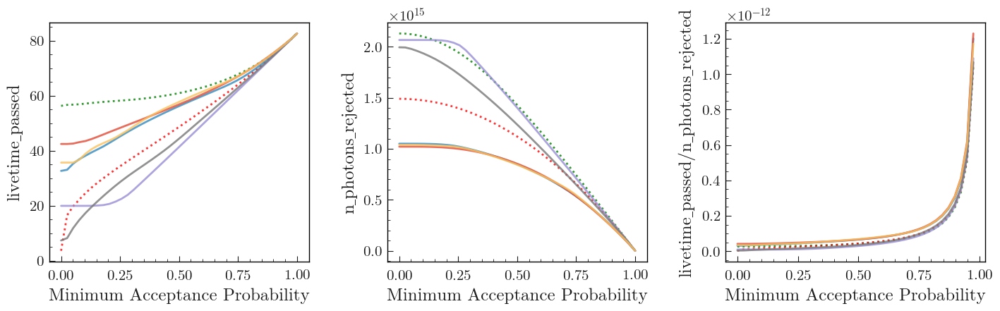

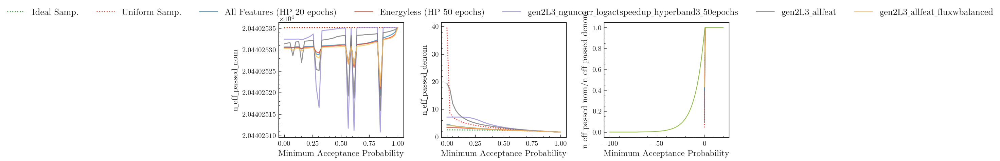

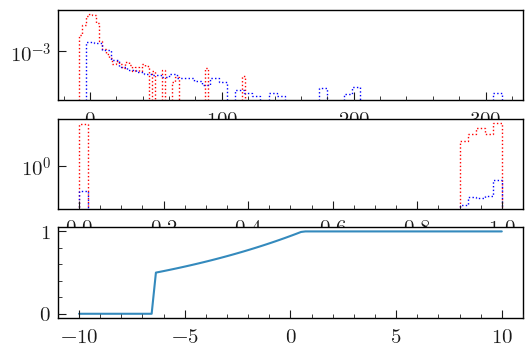

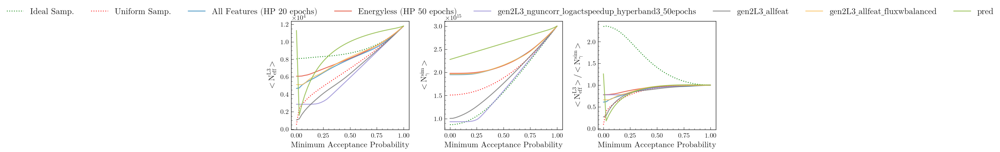

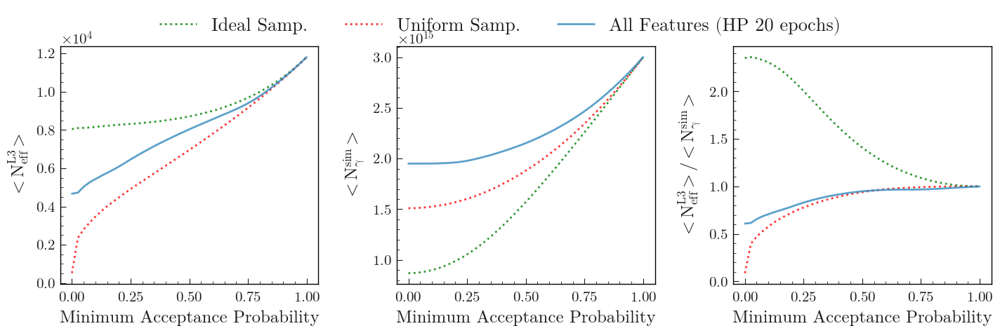

...

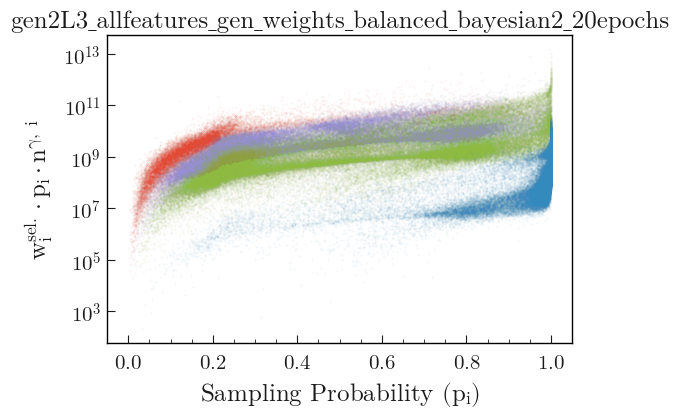

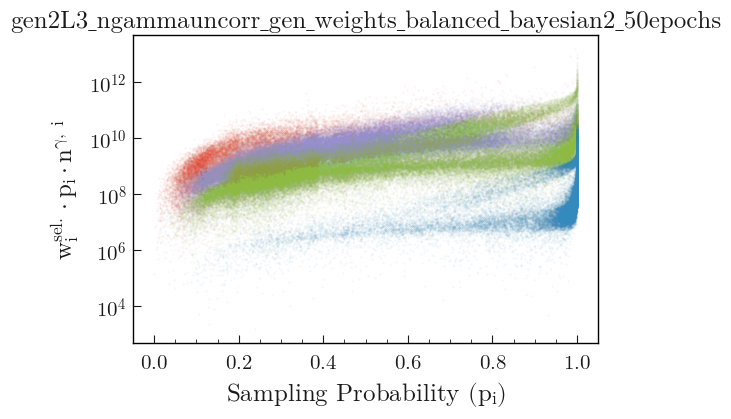

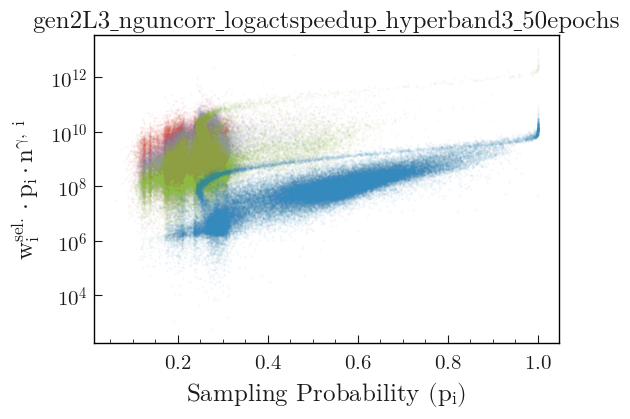

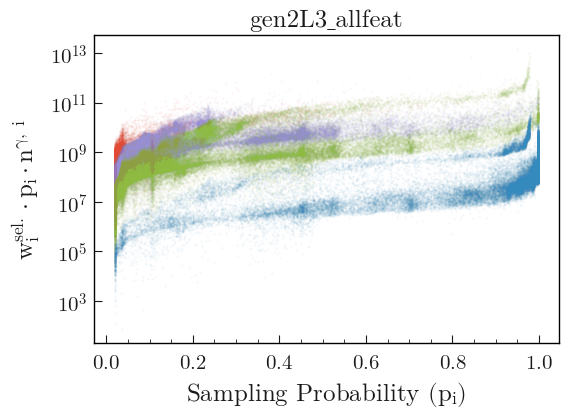

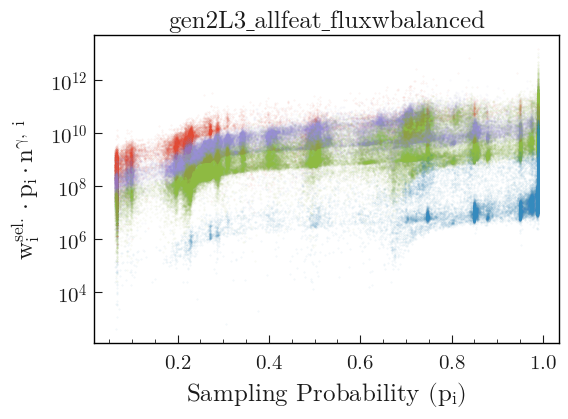

In [19]:


def get_pred_speed(pred, passed=None, n_photons=None, gen_weights=None, sel_weights=None, full=False):
    pred_passed = pred[passed]
    w_pred, mask_sample = get_weight_from_pred(pred)
    
    n_eff_passed = calc_expected_n_eff(w_pred[passed] * gen_weights[passed] * sel_weights[passed], pred[passed] )
    n_eff_noflux_passed = calc_expected_n_eff(w_pred[passed] * sel_weights[passed], pred[passed] )
    # n_eff_passed = calc_n_eff( (w_pred * gen_weights * sel_weights)[passed & mask_sample] )
    n_photons_simulated = (n_photons * sel_weights * pred).sum()
    speed = n_eff_passed / n_photons_simulated
    results = dict(n_eff_passed=n_eff_passed, n_photons_simulated=n_photons_simulated, n_eff_noflux_passed=n_eff_noflux_passed, speed=speed)


    if full:
        n_eff_passed_nom = (pred[passed] * w_pred[passed] * gen_weights[passed] * sel_weights[passed]).sum()**2
        n_eff_passed_denom = (pred[passed] * (w_pred[passed] * gen_weights[passed] * sel_weights[passed])**2 ).sum()

        livetime_passed_nom = (pred[passed] * w_pred[passed] * gen_weights[passed] * sel_weights[passed]).sum()
        livetime_passed_denom = n_eff_passed_denom
        results.update(
            n_eff_passed_nom=n_eff_passed_nom,
            n_eff_passed_denom=n_eff_passed_denom,
            livetime_passed_nom=livetime_passed_nom,
            liveitme_passed_denom=livetime_passed_denom,
            livetime_passed=livetime_passed_nom/livetime_passed_denom,
            n_photons_rejected=(n_photons * sel_weights * (1-pred)).sum()
            
        )
    return results


def get_pred_speed_up(df,
                    pred='pred',
                    passed='passed',
                    col_n_photons='n_photons',
                    col_gen_weights='weights',
                    col_sel_weights='selection_weight',
                    min_pred_range=np.linspace(0,1, 100),
                    full=False):
    """
        calculate summary information for a given prediction
    """
    steps = []

    pred = df[pred] if isinstance(pred, str) else pred
    passed = df[passed].astype(bool) if isinstance(passed, str) else passed
    #print(passed)
    w_gen = df[col_gen_weights] if isinstance(col_gen_weights, str) else col_gen_weights
    w_sel = df[col_sel_weights] if isinstance(col_sel_weights, str) else col_sel_weights
    n_photons = df[col_n_photons] if isinstance(col_n_photons, str) else col_n_photons


    speed_dict_nominal = get_pred_speed(np.ones_like(pred), 
                                        passed=passed, 
                                        n_photons=n_photons, 
                                        gen_weights=w_gen, 
                                        sel_weights=w_sel)
    speed_nominal = speed_dict_nominal['speed']
    n_eff_passed_nominal = speed_dict_nominal['n_eff_passed']
    n_photons_simulated_nominal = speed_dict_nominal['n_photons_simulated']

    for min_pred in min_pred_range:
        step_pred = np.where(pred<=min_pred, min_pred, pred )

    
        speed_dict = get_pred_speed(step_pred, passed=passed, n_photons=n_photons, gen_weights=w_gen, sel_weights=w_sel, full=full)

        n_eff_passed = speed_dict['n_eff_passed']
        n_photons_simulated = speed_dict['n_photons_simulated']
        speed = speed_dict['speed']

        n_eff_passed_normed = n_eff_passed / n_eff_passed_nominal
        n_photons_simulated_normed = n_photons_simulated / n_photons_simulated_nominal
        speed_normed = speed / speed_nominal
        
        steps_dict = dict(min_pred=min_pred,
                            **speed_dict,
                            n_eff_passed_normed=n_eff_passed_normed,
                            n_photons_simulated_normed=n_photons_simulated_normed,
                            speed_normed=speed_normed

                          )
                    
        steps.append(steps_dict)
    
    sdf = pd.DataFrame(steps)
    return sdf



(<Figure size 1500x500 with 3 Axes>,
 array([<Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{eff}^{L3}>$'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{\\gamma}^{sim}>$'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{eff}^{L3}>$/$<N_{\\gamma}^{sim}>$'>],
       dtype=object))

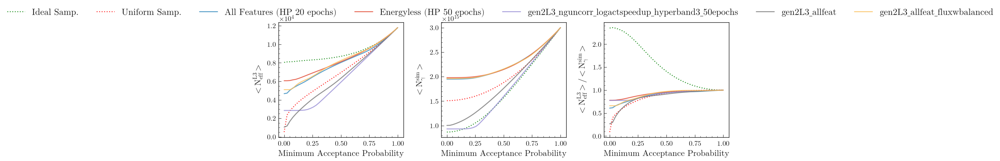

In [279]:

df['pred']

sdfs = {}
xvals=list(np.linspace(0,1,40))
for pname in ['pseudo_pred_gauss', 'pseudo_pred_uniform', ]:
    #sdf = utils.speedup_utils.get_pred_speed_up(df, pname, min_pred_range=xvals) 
    sdf = get_pred_speed_up(df, pname, min_pred_range=xvals, full=True) 
    sdfs[pname] = sdf


ms = []

for model_name in model_names[:]:
    name = f'{model_name}_new'    
    ms.append(name)
    pred = df[model_name]
    #vals = np.where(pred<=0.5, 1E-5, pred)
    vals = pred
    sdfs[model_name] = get_pred_speed_up(df, vals, min_pred_range=xvals, full=True)
    # sdfs[model_name] = utils.speedup_utils.get_pred_speed_up(df, vals, min_pred_range=xvals)


#fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)
make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)


In [329]:
"\n".join(textwrap.wrap(model_names[1], width=3))
labels

['Linear Growth with a Very Long Label That Might Overlap',
 'Quadratic Growth with an Even Longer Label That Could Cause Issues',
 'Square Root Growth with an Extremely Long Label That Could Cause Overlapping']

/tmp/ipykernel_16087/2785421757.py:6: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=3)


(<Figure size 1500x500 with 3 Axes>,
 array([<Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{eff}^{L3}>$'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{\\gamma}^{sim}>$'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{eff}^{L3}>$/$<N_{\\gamma}^{sim}>$'>],
       dtype=object))

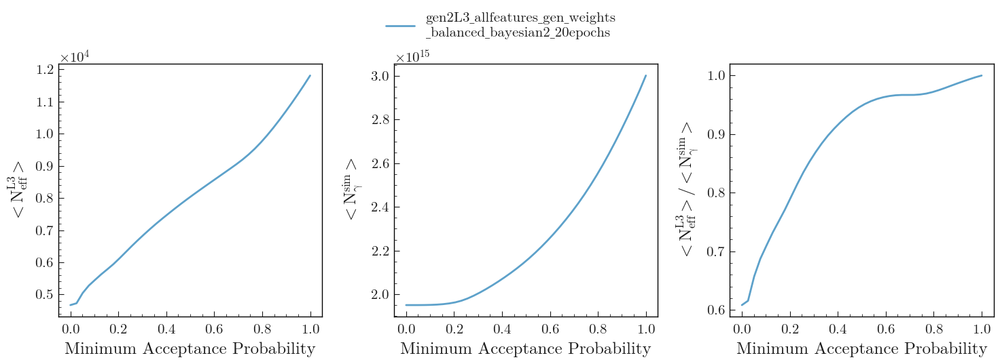

In [17]:

import textwrap

def make_tri_plot(nom, denom, x='min_pred', sdfs=None, norm_idx=-1, save_path=None, legend=True,  ):
    model_names = list(sdfs)
    fig, axs = plt.subplots(ncols=3, nrows=1, squeeze=True, figsize=(15, 5), constrained_layout=True )
    fig.tight_layout(pad=3)
    axs = axs.flatten()
    for pred_name in model_names:
        sdf = sdfs[pred_name]
        plot_nom_denom_ratio(axs, 
                             sdf, 
                             nom, 
                             denom, 
                             x, 
                             label="\n".join(textwrap.wrap(pred_name,30)), 
                             #label=pred_name,
                             norm_idx=norm_idx )
    if legend:
        # fig.legend(ncol=min(4, len(model_names)), loc='upper center', prop={'size':19})
        legend_kwargs = dict(ncol=min(4, len(model_names)), fontsize=15, loc='upper center', bbox_to_anchor=(0.5, 1.15))
        if isinstance(legend, dict):
            legend_kwargs.update(legend)
        fig.legend(**legend_kwargs)

    if save_path:
        utils.savefig(fig, save_path)
    fig.tight_layout()
    return fig, axs

s = {k:v for k,v in sdfs.items() if 'pseudo' in k}
#s.update(**{k+"even_longer_name":v for k,v in sdfs.items()})
#s.update(**{k+"even_longer_name_than_before":v for k,v in sdfs.items()})
make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs={nominal_model:sdfs[nominal_model]}, legend=dict(bbox_to_anchor=(0.5,1.1)))

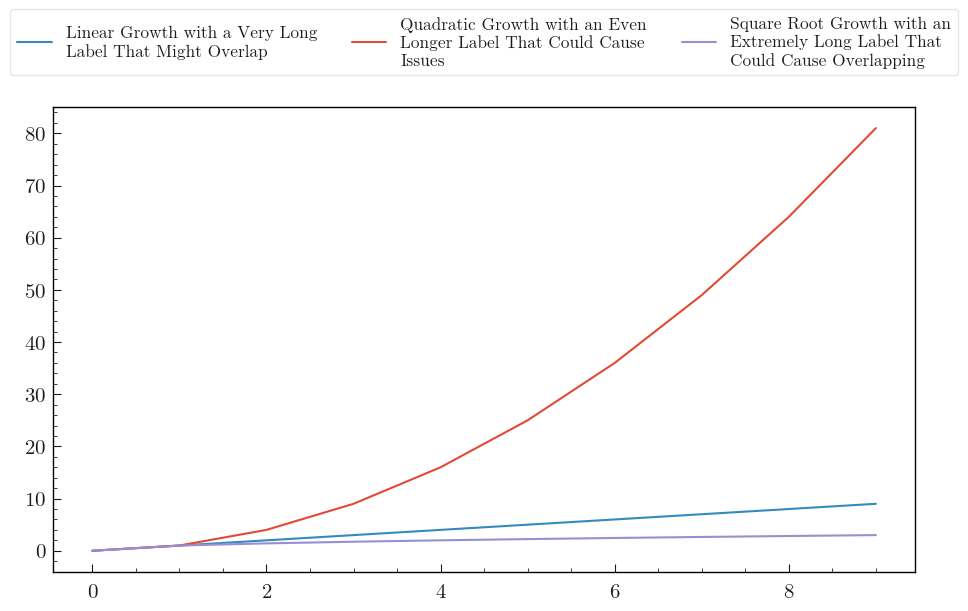

In [314]:
import matplotlib.pyplot as plt
import textwrap

# Sample data
x = range(10)
y1 = [i for i in x]
y2 = [i**2 for i in x]
y3 = [i**0.5 for i in x]

# Create the plot with constrained layout
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# Long labels
labels = [
    'Linear Growth with a Very Long Label That Might Overlap',
    'Quadratic Growth with an Even Longer Label That Could Cause Issues',
    'Square Root Growth with an Extremely Long Label That Could Cause Overlapping'
]

# Wrap labels and plot
for y, label in zip([y1, y2, y3], labels):
    ax.plot(x, y, label='\n'.join(textwrap.wrap(label, 30)))

# Position the legend on top
ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.05),
          ncol=4, fontsize='small', frameon=True)

plt.show()

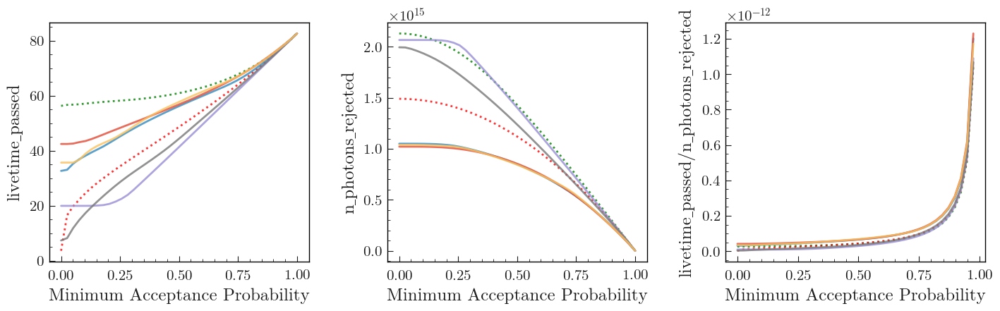

In [132]:
fig, axs = utils.speedup_utils.make_tri_plot('livetime_passed', 'n_photons_rejected', sdfs=sdfs, norm_idx=None, legend=False)


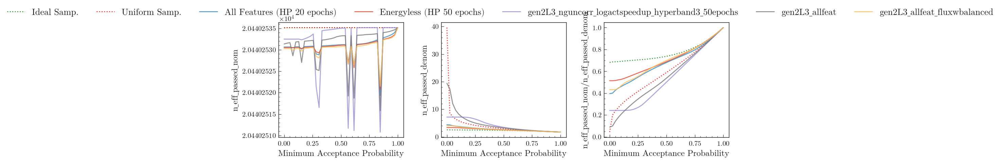

In [136]:
fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed_nom', 'n_eff_passed_denom', sdfs=sdfs, norm_idx=-1)


In [14]:
"""
Maximize the speed_up by calibrating the logistic function


"""

def __speed_up(df,
            pred='pred',
            ):

    pred = df[pred]
    min_pred = 0.2
    step_pred = np.where(pred<=min_pred, min_pred, pred )
    w_pred, mask_sample = get_weight_from_pred(step_pred)

    n_photons = df['n_photons']
    w_gen = df['weights']
    w_sel = df['selection_weight']
    passed = df['passed']

    w_pred_passed = w_pred[passed]

    n_photons_sampled_expected = (n_photons * step_pred * w_sel).sum() 
    n_eff_sampled_expected = calc_expected_n_eff(w_pred_passed)

    n_photons_nominal = (n_photons * w_sel).sum()
    n_eff_nominal = np.sum(w_pred_passed)

    speed_sampled = n_eff_sampled_expected/n_photons_sampled_expected
    speed_nominal = n_eff_nominal/n_photons_nominal

    speed_up = speed_sampled/speed_nominal
    # print(f"""{speed_sampled = }, 
    #         {speed_nominal = }, 
    #         {speed_up      = }""")
    print(f"""{speed_up = }""")

    return speed_up

#speed_up(df, 'pseudo_pred_gauss',)

bare_model = remove_final_activation(mf.model)
bare_res = bare_model.predict(df[mf.features], batch_size=mf.batch_size)

def speed_up_wrapper(params):
    df['logistic_pred'] = logistic(bare_res, *params)
    # print(params)
    # -1 * 
    xvals=list(np.linspace(0,0.3,10))
    
    sdf = utils.speedup_utils.get_pred_speed_up(df, 'logistic_pred', min_pred_range=xvals) 
    speedup = max(sdf['speed_normed'])
    print(speedup, params)
    return -1 * speedup

from scipy.optimize import minimize

result = minimize(speed_up_wrapper, x0=(1,1,1), method='Nelder-Mead')




41/41 [==============================] - 1s 10ms/step
0.8723096234162918 [1. 1. 1.]
0.8728926925765838 [1.05 1.   1.  ]
0.8711866524904035 [1.   1.05 1.  ]
0.8709236303758287 [1.   1.   1.05]
0.8736677388815091 [1.03333333 1.03333333 0.95      ]
0.8755646712049701 [1.05 1.05 0.9 ]
0.8756725506837834 [1.06666667 0.98333333 0.93333333]
0.8782948536463548 [1.1  0.95 0.9 ]
0.8794731527232066 [1.13333333 1.         0.86666667]
0.8842377688676755 [1.2 1.  0.8]
0.8880296188178549 [1.18333333 1.         0.73333333]
0.8982041911187593 [1.25 1.   0.6 ]
0.8959505279533875 [1.31666667 0.91666667 0.63333333]
0.9212854692225579 [1.41111111 0.99444444 0.45555556]
0.9734659628544534 [1.56666667 1.01666667 0.23333333]
0.9836726350117169 [1.55555556 0.95555556 0.17777778]
0.9943819466661751 [ 1.73333333  0.93333333 -0.13333333]
0.9905728726589025 [ 1.71666667  1.05       -0.16666667]
0.8882990815991091 [ 2.09444444  1.         -0.64444444]
0.9580591211937999 [1.46111111 1.         0.28888889]
0.96171499

0.997877239656616 [100, 0, 10]
-0.997877239656616


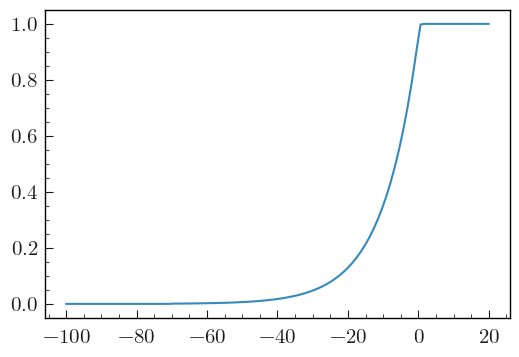

In [72]:
#speed_up_wrapper()

params = [100,  0 , 10]
x = np.linspace(-100,20,100)
plt.plot(x, logistic(x, *params))
print( speed_up_wrapper(params))



In [73]:
[k for k in df.columns if 'weight' in k]

['weights',
 'selection_weight',
 'balanced_weight',
 'gen_weights_balanced',
 'gen_weights',
 'sel_gen_weights',
 'normalized_balanced_weights',
 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs',
 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs_prob',
 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs',
 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs_prob']

In [74]:
mfs

{'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs': <ModelFactory.ModelFactory at 0x7fb2bac3ac50>,
 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs': <ModelFactory.ModelFactory at 0x7fb2c33f5190>,
 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs': <ModelFactory.ModelFactory at 0x7fb2c07afd90>,
 'gen2L3_allfeat': <ModelFactory.ModelFactory at 0x7fb2bac40690>,
 'gen2L3_allfeat_fluxwbalanced': <ModelFactory.ModelFactory at 0x7fb2bae56310>}

In [75]:

mf = mfs['gen2L3_nguncorr_logactspeedup_hyperband3_50epochs']
mf = mfs['gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs']

bare_model = remove_final_activation(mf.model)
bare_res = bare_model.predict(df[mf.features], batch_size=mf.batch_size)


41/41 [==============================] - 1s 11ms/step


In [76]:
mf.model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (Batch  (None, 23)                92        
 Normalization)                                                  
                                                                 
 Dense_0_224_leaky_relu (De  (None, 224)               5376      
 nse)                                                            
                                                                 
 dropout (Dropout)           (None, 224)               0         
                                                                 
 Dense_1_224_leaky_relu (De  (None, 224)               50400     
 nse)                                                            
                                                                 
 Dense_2_112_leaky_relu (De  (None, 112)               25200     
 nse)                                                   

In [79]:
# utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)
# plt.ylim(0,2)

# sdf[['min_pred', 'speed', 'speed_normed']]




/home/navidkrad/work/i3kiss/utils/speedup_utils.py:475: RuntimeWarning: overflow encountered in exp
  return 1 / ((1 + a * np.exp(-c*(x-b)))**(1/a))
/home/navidkrad/work/i3kiss/utils/speedup_utils.py:475: RuntimeWarning: overflow encountered in multiply
  return 1 / ((1 + a * np.exp(-c*(x-b)))**(1/a))


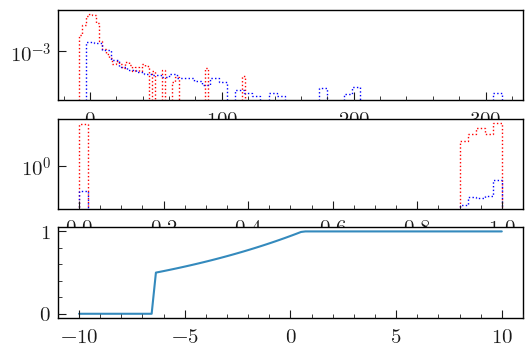

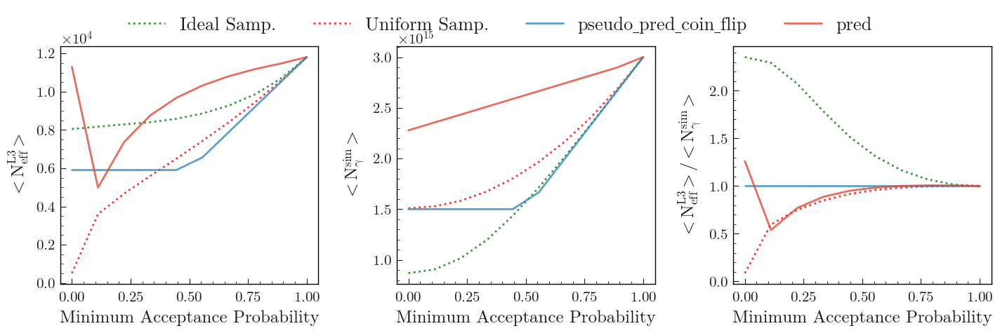

In [37]:
fig, axs = plt.subplots(3)

ax=axs[0]
kw = dict(bins=50, histtype='step', )
_ = ax.hist( bare_res[cls0], weights=df[cls0]['sel_gen_weights'], color='red', ls=':', label='cls0', **kw)
_ = ax.hist( bare_res[cls1], weights=df[cls1]['sel_gen_weights'], color='blue', ls=':', label='cls1', **kw)
ax.set_yscale('log')

params =[1000,0.5,100]
ax=axs[1]
# act = logistic(*params)
vals = logistic(bare_res, *params)
_ = ax.hist( vals[cls0], weights=df[cls0]['sel_gen_weights'], color='red', ls=':', label='cls0', **kw)
_ = ax.hist( vals[cls1], weights=df[cls1]['sel_gen_weights'], color='blue', ls=':', label='cls1', **kw)
ax.set_yscale('log')

ax=axs[2]
x = np.linspace(min(bare_res), max(bare_res), 1000)
x = np.linspace(-10,10,100)
plt.plot(x, logistic(x, *params))


sdfs['pred'] = utils.speedup_utils.get_pred_speed_up(df, vals.flatten(), min_pred_range=xvals)

fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)


['gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs',
 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs']

In [14]:
def get_pred_speed(pred, passed=None, n_photons=None, gen_weights=None, sel_weights=None, full=False):
    pred_passed = pred[passed]
    w_pred, mask_sample = get_weight_from_pred(pred)

    
    n_eff_passed = calc_expected_n_eff(w_pred[passed] * gen_weights[passed] * sel_weights[passed], pred[passed] )
    n_eff_noflux_passed = calc_expected_n_eff(w_pred[passed] * sel_weights[passed], pred[passed] )
    # n_eff_passed = calc_n_eff( (w_pred * gen_weights * sel_weights)[passed & mask_sample] )
    n_photons_simulated = (n_photons * sel_weights * pred).sum()
    speed = n_eff_passed / n_photons_simulated
    results = dict(n_eff_passed=n_eff_passed, n_photons_simulated=n_photons_simulated, n_eff_noflux_passed=n_eff_noflux_passed, speed=speed)
    if full:
        results.update(
            n_eff_passed_nom = (pred[passed] * w_pred[passed] * gen_weights[passed] * sel_weights[passed]).sum()**2,
            n_eff_passed_denom = (pred[passed] * (w_pred[passed] * gen_weights[passed] * sel_weights[passed])**2 ).sum(),
        )
    return results


def get_pred_speed_up(df,
                    pred='pred',
                    passed='passed',
                    col_n_photons='n_photons',
                    col_gen_weights='weights',
                    col_sel_weights='selection_weight',
                    min_pred_range=np.linspace(0,1, 100),
                    full=False):
    """
        calculate summary information for a given prediction
    """
    steps = []

    pred = df[pred] if isinstance(pred, str) else pred
    passed = df[passed].astype(bool) if isinstance(passed, str) else passed
    #print(passed)
    w_gen = df[col_gen_weights] if isinstance(col_gen_weights, str) else col_gen_weights
    w_sel = df[col_sel_weights] if isinstance(col_sel_weights, str) else col_sel_weights
    n_photons = df[col_n_photons] if isinstance(col_n_photons, str) else col_n_photons


    speed_dict_nominal = get_pred_speed(np.ones_like(pred), 
                                        passed=passed, 
                                        n_photons=n_photons, 
                                        gen_weights=w_gen, 
                                        sel_weights=w_sel)
    speed_nominal = speed_dict_nominal['speed']
    n_eff_passed_nominal = speed_dict_nominal['n_eff_passed']
    n_photons_simulated_nominal = speed_dict_nominal['n_photons_simulated']

    for min_pred in min_pred_range:
        step_pred = np.where(pred<min_pred, min_pred, pred )

    
        speed_dict = get_pred_speed(step_pred, passed=passed, n_photons=n_photons, gen_weights=w_gen, sel_weights=w_sel, full=full)

        n_eff_passed = speed_dict['n_eff_passed']
        n_photons_simulated = speed_dict['n_photons_simulated']
        speed = speed_dict['speed']

        n_eff_passed_normed = n_eff_passed / n_eff_passed_nominal
        n_photons_simulated_normed = n_photons_simulated / n_photons_simulated_nominal
        speed_normed = speed / speed_nominal
        
        steps_dict = dict(min_pred=min_pred,
                            **speed_dict,
                            n_eff_passed_normed=n_eff_passed_normed,
                            n_photons_simulated_normed=n_photons_simulated_normed,
                            speed_normed=speed_normed

                          )
                    
        steps.append(steps_dict)
    
    sdf = pd.DataFrame(steps)
    return sdf



In [16]:
sdf

,min_pred,n_eff_passed,n_photons_simulated,n_eff_noflux_passed,speed,n_eff_passed_nom,n_eff_passed_denom,n_eff_passed_normed,n_photons_simulated_normed,speed_normed
0,0.000000,516.102519,1.510242e+15,6547.012635,3.417349e-13,20440.253508,39.605026,0.043701,0.503217,0.086843
1,0.111111,3601.923200,1.529008e+15,25850.747454,2.355725e-12,20440.253515,5.674817,0.304994,0.509469,0.598649
2,0.222222,4672.477824,1.582953e+15,33019.575552,2.951749e-12,20440.253515,4.374607,0.395643,0.527444,0.750114
3,0.333333,5594.390143,1.674806e+15,39380.473923,3.340321e-12,20440.253515,3.653705,0.473706,0.558050,0.848860
4,0.444444,6497.476396,1.803099e+15,45612.427337,3.603505e-12,20440.253516,3.145876,0.550175,0.600797,0.915742
5,0.555556,7423.203543,1.967235e+15,51985.518680,3.773420e-12,20440.253516,2.753562,0.628561,0.655488,0.958921
6,0.666667,8392.230327,2.168903e+15,58701.184454,3.869343e-12,20440.253516,2.435616,0.710614,0.722684,0.983298
7,0.777778,9428.384714,2.408193e+15,65917.808557,3.915129e-12,20440.253516,2.167949,0.798350,0.802416,0.994933
8,0.888889,10558.602536,2.686007e+15,73784.943154,3.930967e-12,20440.253516,1.935886,0.894052,0.894984,0.998958
9,1.000000,11809.835110,3.001177e+15,82478.000000,3.935067e-12,20440.253516,1.730782,1.000000,1.000000,1.000000


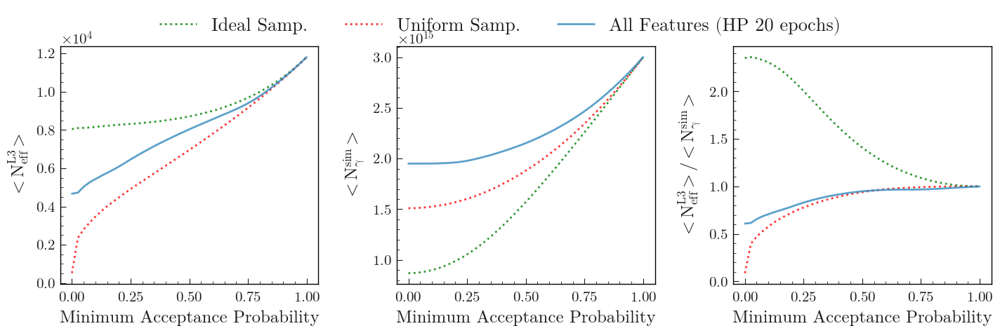

In [151]:

df['pred']

sdfs = {}
xvals=list(np.linspace(0,1,40))
for pname in ['pseudo_pred_gauss', 'pseudo_pred_uniform', ]:
    #sdf = utils.speedup_utils.get_pred_speed_up(df, pname, min_pred_range=xvals) 
    sdf = get_pred_speed_up(df, pname, min_pred_range=xvals, full=True) 
    sdfs[pname] = sdf


ms = []

for model_name in [nominal_model]: #model_names[:]:
    name = f'{model_name}_new'    
    ms.append(name)
    pred = df[model_name]
    # vals = np.where(pred<=0.5, 1E-5, pred)
    vals = pred
    sdfs[model_name] = get_pred_speed_up(df, vals, min_pred_range=xvals, full=True)
    # sdfs[model_name] = utils.speedup_utils.get_pred_speed_up(df, vals, min_pred_range=xvals)

fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)



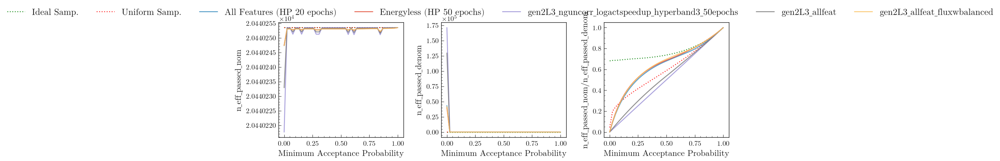

In [24]:
fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed_nom', 'n_eff_passed_denom', sdfs=sdfs)

dict_keys(['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs', 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs', 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs', 'gen2L3_allfeat', 'gen2L3_allfeat_fluxwbalanced'])


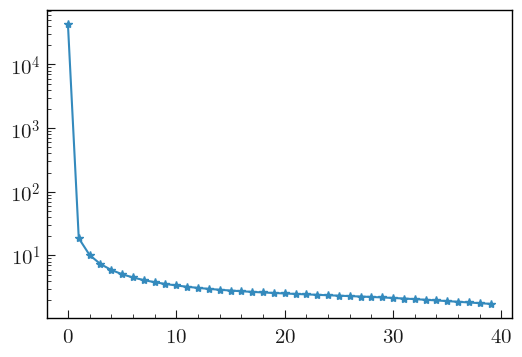

In [36]:
print( sdfs.keys() )

plt.plot( sdfs[model_names[0]]['n_eff_passed_denom'] , marker='*')
plt.yscale("log")

In [69]:
sdfs[model_names[0]]['n_eff_passed']

0         0.470957
1      1098.817203
2      2015.990609
3      2793.122724
4      3460.011920
5      4038.563473
6      4545.239103
7      4992.649297
8      5390.617930
9      5746.911415
10     6067.750718
11     6358.176648
12     6622.317819
13     6863.587961
14     7084.834976
15     7288.451534
16     7476.464360
17     7650.601043
18     7812.343034
19     7962.968316
20     8104.135867
21     8241.434432
22     8377.167994
23     8511.266347
24     8645.175308
25     8779.024568
26     8913.213381
27     9049.860488
28     9194.735164
29     9355.121718
30     9533.255559
31     9731.554634
32     9948.402077
33    10180.765715
34    10427.250122
35    10684.315751
36    10950.615306
37    11226.383960
38    11512.187379
39    11809.835110
Name: n_eff_passed, dtype: float64

In [68]:
min_pred = 0.3

np.where(pred<=min_pred, min_pred, pred )

array([0.3       , 0.7263376 , 0.3       , ..., 0.6965536 , 0.3       ,
       0.97757125], dtype=float32)

generated==1 & triggered==0 & filtered==0 & Level3==0
triggered==1 & filtered==0 & Level3==0
filtered==1 & Level3==0
Level3==1


In [63]:
print( sdfs.keys() )

sdfs[model_names[0]]['n_eff_passed']

dict_keys(['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs', 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs', 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs', 'gen2L3_allfeat', 'gen2L3_allfeat_fluxwbalanced'])


0         0.470957
1      1098.817203
2      2015.990609
3      2793.122724
4      3460.011920
5      4038.563473
6      4545.239103
7      4992.649297
8      5390.617930
9      5746.911415
10     6067.750718
11     6358.176648
12     6622.317819
13     6863.587961
14     7084.834976
15     7288.451534
16     7476.464360
17     7650.601043
18     7812.343034
19     7962.968316
20     8104.135867
21     8241.434432
22     8377.167994
23     8511.266347
24     8645.175308
25     8779.024568
26     8913.213381
27     9049.860488
28     9194.735164
29     9355.121718
30     9533.255559
31     9731.554634
32     9948.402077
33    10180.765715
34    10427.250122
35    10684.315751
36    10950.615306
37    11226.383960
38    11512.187379
39    11809.835110
Name: n_eff_passed, dtype: float64

In [72]:
types = ['generated', 'triggered', 'filtered', 'Level3']

masks = {}

for i, t in enumerate(types):
    query_this = f'{t}==1'
    query_rest = [f'{t_}==0' for t_ in types if types.index(t_) > types.index(t) ]
    query = " & ".join( [query_this] + query_rest)
    mask = df.query(query).index
    print( query )
    masks[t] = mask
    df.loc[mask, 'level'] = t


    

generated==1 & triggered==0 & filtered==0 & Level3==0
triggered==1 & filtered==0 & Level3==0
filtered==1 & Level3==0
Level3==1


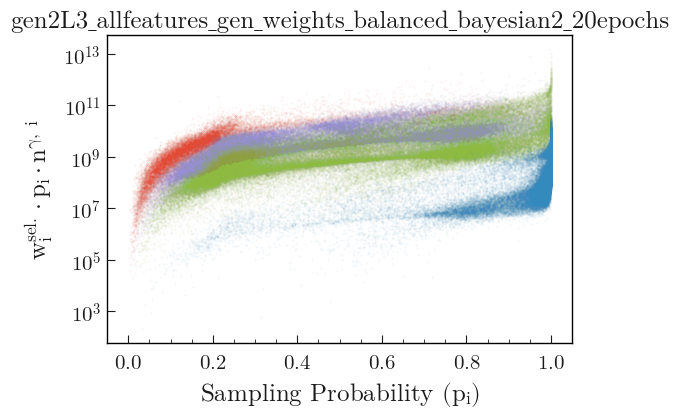

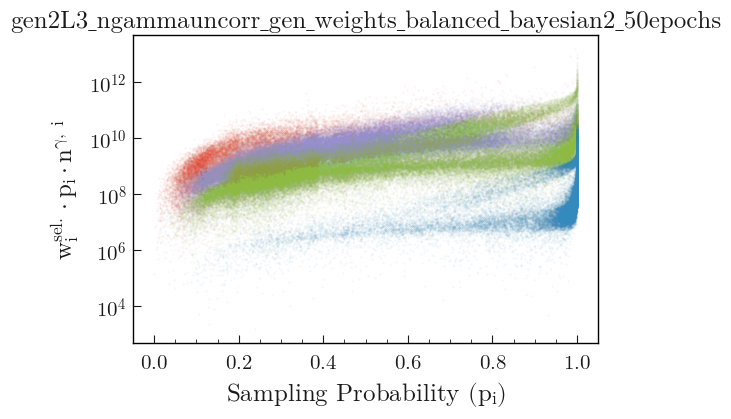

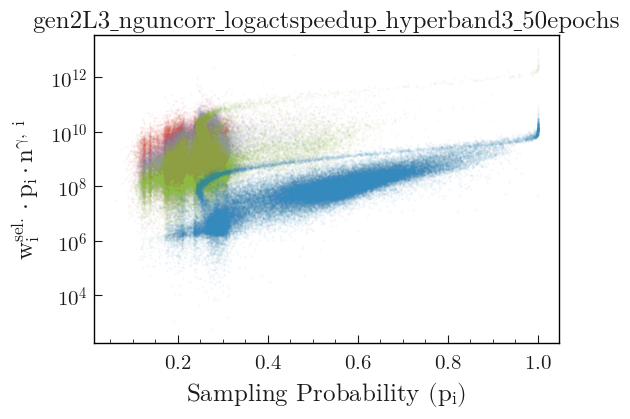

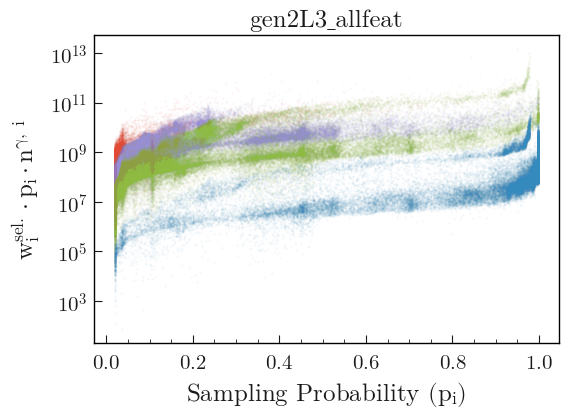

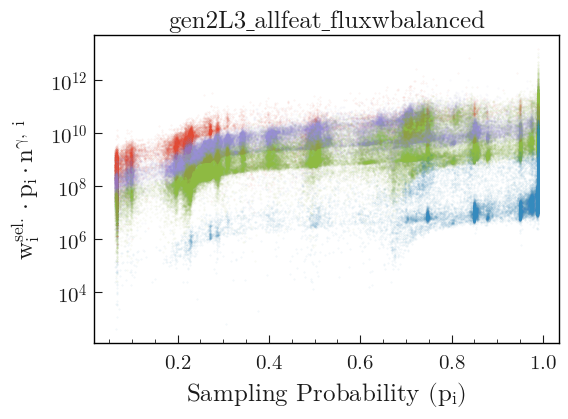

In [74]:
import matplotlib as mpl

colors = {'generated':'C1', 'triggered':'C2', 'filtered':'C5', 'Level3':'C0'}

nplots = len(model_names)
# fig, axs = plt.subplots(nrows=nplots, figsize=(9,15))
# i = 0
for mname in model_names:
    vals = df[mname]
    fig, ax = plt.subplots()
    for t in types:
        mask = masks[t]
        ax.scatter(vals[mask], vals[mask] * df['selection_weight'][mask] * df['n_photons'][mask], s=0.1, alpha=0.1, label=t, color=colors[t])
        ax.set_yscale('log')
        ax.set_xlabel("Sampling Probability ($p_{i}$)")
        ax.set_ylabel("$w^{sel.}_{i} \cdot p_{i} \cdot n^{\gamma,\ i}$")
        
    ax.set_yscale('log')
    ax.set_title(mname)
    i+=1

# axs[0].legend()


In [273]:
axs[]

array([<Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{eff}^{L3}>$'>,
       <Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{\\gamma}^{sim}>$'>,
       <Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{eff}^{L3}>$/$<N_{\\gamma}^{sim}>$'>],
      dtype=object)

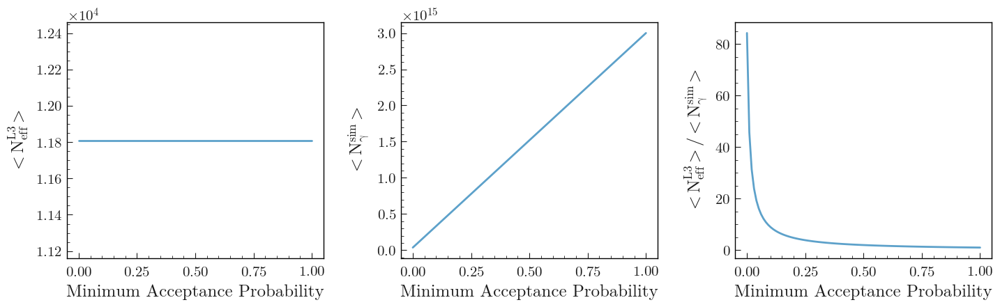

,min_pred,n_eff_passed,n_photons_simulated,speed,speed_normed
0,0.000000,4668.400686,1.950608e+15,2.393305e-12,0.608199
1,0.025641,4725.160092,1.950612e+15,2.422399e-12,0.615593
2,0.051282,5044.259961,1.950670e+15,2.585911e-12,0.657145
3,0.076923,5275.940198,1.950920e+15,2.704335e-12,0.687240
4,0.102564,5451.021052,1.951553e+15,2.793171e-12,0.709815
5,0.128205,5623.189286,1.952794e+15,2.879561e-12,0.731769
6,0.153846,5780.483446,1.954925e+15,2.956883e-12,0.751419
7,0.179487,5942.659988,1.958235e+15,3.034702e-12,0.771194
8,0.205128,6125.104907,1.963207e+15,3.119948e-12,0.792858
9,0.230769,6316.293714,1.970676e+15,3.205141e-12,0.814507


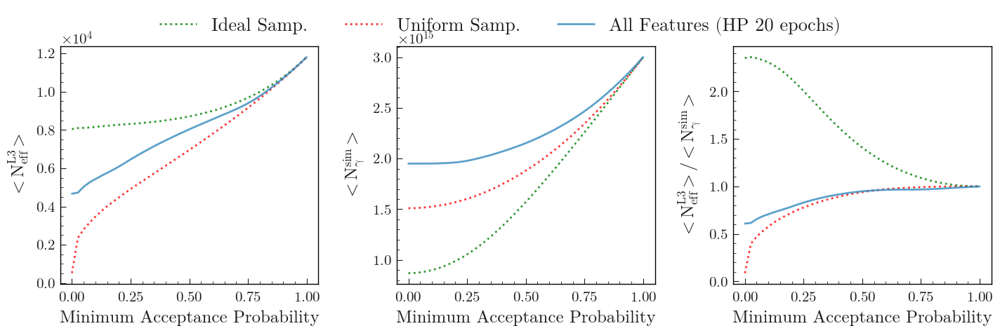

In [156]:
fig, axs = utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)

sdfs[nominal_model][['min_pred', 'n_eff_passed', 'n_photons_simulated', 'speed', 'speed_normed']]

In [163]:
print( sdfs[nominal_model]['n_eff_passed'].iloc[0] )
print( sdfs[nominal_model]['n_photons_simulated'].iloc[0] )
print( sdfs[nominal_model]['speed'].iloc[0] )
print( sdfs[nominal_model]['speed_normed'].iloc[0] )
(calc_expected_n_eff( (df_passed['weights'] * df_passed['selection_weight'] * 1.0/step_pred[passed]), p=step_pred[passed] ) )  / (df['selection_weight']*df['n_photons']*step_pred).sum()



4668.400685897367
1950608350498321.0
2.39330498339389e-12
0.6081992394790845


2.3933049876006418e-12

In [149]:
sdfs[nominal_model].iloc[0]

min_pred                      0.000000e+00
n_eff_passed                  4.668401e+03
n_photons_simulated           1.950608e+15
n_eff_noflux_passed           7.299887e+04
speed                         2.393305e-12
n_eff_passed_nom              2.044025e+04
n_eff_passed_denom            4.378427e+00
livetime_passed_nom           1.429694e+02
liveitme_passed_denom         4.378427e+00
livetime_passed               3.265314e+01
n_photons_rejected            1.050569e+15
n_eff_passed_normed           3.952977e-01
n_photons_simulated_normed    6.499477e-01
speed_normed                  6.081992e-01
Name: 0, dtype: float64

In [216]:
passed = df['truth'].astype(bool)

df_passed = df.loc[passed]

pred = df[nominal_model]
pred = df['truth']

min_pred = xvals[0]
step_pred = np.where(pred<=min_pred, min_pred, pred)


# step_pred = pred
# (calc_expected_n_eff( (df_passed['weights'] * df_passed['selection_weight'] * 1.0/step_pred[passed]), p=step_pred[passed] ) / (df['selection_weight']*df['n_photons']*step_pred).sum() ) / (calc_expected_n_eff( (df_passed['weights']*df_passed['selection_weight']), np.ones(len(df)) ) / (df['selection_weight']*df['n_photons']).sum() )


w_flux = df['weights']
w_sel = df['selection_weight']
n_photons = df['n_photons']
p = step_pred
w_pred = 1.0/(p+1E-11)


(calc_expected_n_eff( (w_flux * w_sel * w_pred)[passed], p[passed]) / (w_sel * n_photons * p).sum()) / \
(calc_expected_n_eff( (w_flux * w_sel)[passed], np.ones(passed.sum() ) ) / (w_sel * n_photons).sum() )




84.28605204474428

In [267]:
(calc_expected_n_eff( (w_flux * w_sel * w_pred)[passed], p[passed])) , (calc_expected_n_eff( (w_flux * w_sel)[passed], np.ones(passed.sum() ) ))


(11809.835109626207, 11809.835109626203)

In [263]:
calc_expected_n_eff( (w_flux * w_sel)[passed], np.ones(passed.sum()) ) , calc_n_eff( (w_flux * w_sel )[passed] )

(calc_expected_n_eff( (w_flux * w_sel)[passed], np.ones(passed.sum() ) ) / (w_sel * n_photons).sum() )


f"{(w_sel * n_photons ).sum():0.2e}"


'3.00e+15'

In [271]:
n_photons_passed = (w_sel * n_photons)[passed].sum()
n_photons_total  = (w_sel * n_photons).sum()


n_eff_passed = calc_n_eff( (w_flux * w_sel ) )
n_eff_total  = calc_n_eff( (w_flux * w_sel )[passed] )

print(
f"""
n_photons_passed = { n_photons_passed:0.2e}
n_photons_total  = { n_photons_total:0.2e}
--------------
ratio = {n_photons_total/n_photons_passed:0.2f}


n_eff_passed = { n_eff_passed:0.2e}
n_eff_total  = { n_eff_total:0.2e}
--------------
ratio = {n_eff_passed/n_eff_total:0.2e}

speed_passed = {n_eff_passed/n_photons_passed:0.2e}
speed_total  = {n_eff_total/n_photons_total:0.2e}
--------------
ratio = {n_eff_passed/n_photons_passed / (n_eff_total/n_photons_total):0.2e}

{n_photons_total/n_photons_passed}
"""
)



n_photons_passed = 3.56e+13
n_photons_total  = 3.00e+15
--------------
ratio = 84.29


n_eff_passed = 5.85e+04
n_eff_total  = 1.18e+04
--------------
ratio = 4.95e+00

speed_passed = 1.64e-09
speed_total  = 3.94e-12
--------------
ratio = 4.17e+02

84.28605204474425



In [245]:
1.64e-09/3.94e-12

416.24365482233503

In [212]:
get_pred_speed(np.ones_like(pred), passed=passed, n_photons=n_photons, gen_weights=w_flux, sel_weights=w_sel,)

{'n_eff_passed': 11809.835109626207,
 'n_photons_simulated': 3001177360130000.0,
 'n_eff_noflux_passed': 82477.9999999999,
 'speed': 3.935067372730896e-12}

In [204]:
get_pred_speed(pred_truth, passed=passed, n_photons=n_photons, gen_weights=w_flux, sel_weights=w_sel,)

{'n_eff_passed': 11809.835109626207,
 'n_photons_simulated': 35607046330000.0,
 'n_eff_noflux_passed': 82477.9999999999,
 'speed': 3.316712933775714e-10}

In [168]:
calc_expected_n_eff( (w_flux * w_sel), np.ones(len(df)) ), calc_n_eff(w_flux*w_sel)

(58484.31956584191, 58484.31956584191)

In [137]:
#get_pred_speed(step_pred, passed=passed, n_photons=n_photons, gen_weights=w_flux, sel_weights=w_sel)
get_pred_speed_up(df, df[nominal_model], full=True, min_pred_range=xvals)

,min_pred,n_eff_passed,n_photons_simulated,n_eff_noflux_passed,speed,n_eff_passed_nom,n_eff_passed_denom,livetime_passed_nom,liveitme_passed_denom,livetime_passed,n_photons_rejected,n_eff_passed_normed,n_photons_simulated_normed,speed_normed
0,0.000000,4668.400686,1.950608e+15,72998.865039,2.393305e-12,20440.253064,4.378427,142.969413,4.378427,32.653142,1.050569e+15,0.395298,0.649948,0.608199
1,0.025641,4725.160092,1.950612e+15,73050.131899,2.422399e-12,20440.253064,4.325833,142.969413,4.325833,33.050146,1.050565e+15,0.400104,0.649949,0.615593
2,0.051282,5044.259961,1.950670e+15,73454.016550,2.585911e-12,20440.253064,4.052181,142.969413,4.052181,35.282091,1.050507e+15,0.427124,0.649968,0.657145
3,0.076923,5275.940198,1.950920e+15,73765.229890,2.704335e-12,20440.253043,3.874239,142.969413,3.874239,36.902579,1.050258e+15,0.446741,0.650051,0.687240
4,0.102564,5451.021052,1.951553e+15,73977.852383,2.793171e-12,20440.253068,3.749803,142.969413,3.749803,38.127183,1.049624e+15,0.461566,0.650262,0.709815
5,0.128205,5623.189286,1.952794e+15,74153.954938,2.879561e-12,20440.253069,3.634993,142.969413,3.634993,39.331414,1.048383e+15,0.476145,0.650676,0.731769
6,0.153846,5780.483446,1.954925e+15,74311.427170,2.956883e-12,20440.253015,3.536080,142.969413,3.536080,40.431608,1.046253e+15,0.489464,0.651386,0.751419
7,0.179487,5942.659988,1.958235e+15,74472.141808,3.034702e-12,20440.253073,3.439580,142.969413,3.439580,41.565953,1.042942e+15,0.503196,0.652489,0.771194
8,0.205128,6125.104907,1.963207e+15,74646.996955,3.119948e-12,20440.253076,3.337127,142.969413,3.337127,42.842064,1.037970e+15,0.518644,0.654146,0.792858
9,0.230769,6316.293714,1.970676e+15,74834.460193,3.205141e-12,20440.253081,3.236115,142.969413,3.236115,44.179335,1.030502e+15,0.534833,0.656634,0.814507


In [138]:
sdfs[nominal_model]

,min_pred,n_eff_passed,n_photons_simulated,n_eff_noflux_passed,speed,n_eff_passed_nom,n_eff_passed_denom,livetime_passed_nom,liveitme_passed_denom,livetime_passed,n_photons_rejected,n_eff_passed_normed,n_photons_simulated_normed,speed_normed
0,0.000000,4668.400686,1.950608e+15,72998.865039,2.393305e-12,20440.253064,4.378427,142.969413,4.378427,32.653142,1.050569e+15,0.395298,0.649948,0.608199
1,0.025641,4725.160092,1.950612e+15,73050.131899,2.422399e-12,20440.253064,4.325833,142.969413,4.325833,33.050146,1.050565e+15,0.400104,0.649949,0.615593
2,0.051282,5044.259961,1.950670e+15,73454.016550,2.585911e-12,20440.253064,4.052181,142.969413,4.052181,35.282091,1.050507e+15,0.427124,0.649968,0.657145
3,0.076923,5275.940198,1.950920e+15,73765.229890,2.704335e-12,20440.253043,3.874239,142.969413,3.874239,36.902579,1.050258e+15,0.446741,0.650051,0.687240
4,0.102564,5451.021052,1.951553e+15,73977.852383,2.793171e-12,20440.253068,3.749803,142.969413,3.749803,38.127183,1.049624e+15,0.461566,0.650262,0.709815
5,0.128205,5623.189286,1.952794e+15,74153.954938,2.879561e-12,20440.253069,3.634993,142.969413,3.634993,39.331414,1.048383e+15,0.476145,0.650676,0.731769
6,0.153846,5780.483446,1.954925e+15,74311.427170,2.956883e-12,20440.253015,3.536080,142.969413,3.536080,40.431608,1.046253e+15,0.489464,0.651386,0.751419
7,0.179487,5942.659988,1.958235e+15,74472.141808,3.034702e-12,20440.253073,3.439580,142.969413,3.439580,41.565953,1.042942e+15,0.503196,0.652489,0.771194
8,0.205128,6125.104907,1.963207e+15,74646.996955,3.119948e-12,20440.253076,3.337127,142.969413,3.337127,42.842064,1.037970e+15,0.518644,0.654146,0.792858
9,0.230769,6316.293714,1.970676e+15,74834.460193,3.205141e-12,20440.253081,3.236115,142.969413,3.236115,44.179335,1.030502e+15,0.534833,0.656634,0.814507


In [37]:
n_photons_expected_cls1 = df[cls1]['pred'] * df[cls1]['n_photons'] * df[cls1]['selection_weight']
n_photons_expected_cls0 = (1-df[cls0]['pred']) * df[cls0]['n_photons'] * df[cls0]['selection_weight']

print( f"""
{n_photons_expected_cls1.sum() = :0.2e}
{n_photons_expected_cls0.sum() = :0.2e}
""")


n_photons_expected_cls1.sum() = 3.49e+13
n_photons_expected_cls0.sum() = 1.04e+15



In [29]:
(df[cls1]['pred']*df[cls1]['n_photons']*df[cls1]['selection_weight']).sum()
# (df[cls1]['n_photons']*df[cls1]['selection_weight']).sum()

34920682689316.09

In [27]:


vals = {}
for name, cls in [('false', cls0), ('true',cls1)]  :
    p = ( df[cls]['pred']*df[cls]['selection_weight']*df[cls]['gen_weights'] ).sum()
    print(name, p)
    vals[name] = p
    #print( (df[cls]['pred']*df[cls]['selection_weight']).sum(), (df[cls]['pred'].sum() * df[cls]['selection_weight']).sum() )


print( f"{vals['true']/vals['false']:0.2e}" )

false 1836.5004741336343
true 0.05620894329540416
3.06e-05


NameError: name 'types' is not defined

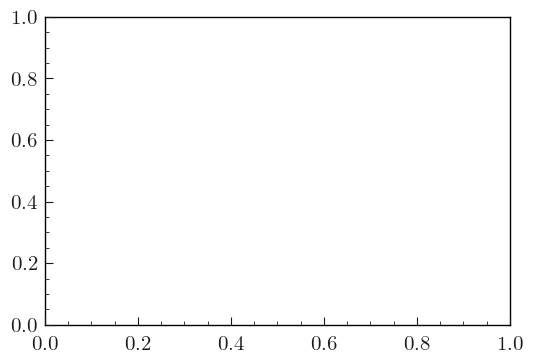

In [24]:
nplots = len(model_names)
for mname in model_names:
    vals = df[mname]
    fig, ax = plt.subplots()
    for t in types:
        mask = masks[t]
        ax.scatter(vals[mask], df['weights'][mask] * df['selection_weight'][mask] , s=0.05, alpha=0.2, label=t)
        ax.set_yscale('log')
        ax.set_xlabel("NN Score")
        ax.set_ylabel("$w^{sel.}_{i} \cdot p_{i} \cdot n^{\gamma}_{i}$")
        
    ax.set_yscale('log')
    ax.set_title(mname)
    i+=1

# axs[0].legend()



,min_pred,speed,speed_normed
0,0.00,3.417347e-13,0.086843
1,0.25,3.064518e-12,0.778771
2,0.50,3.697739e-12,0.939689
3,0.75,3.907200e-12,0.992918
4,1.00,3.935067e-12,1.000000


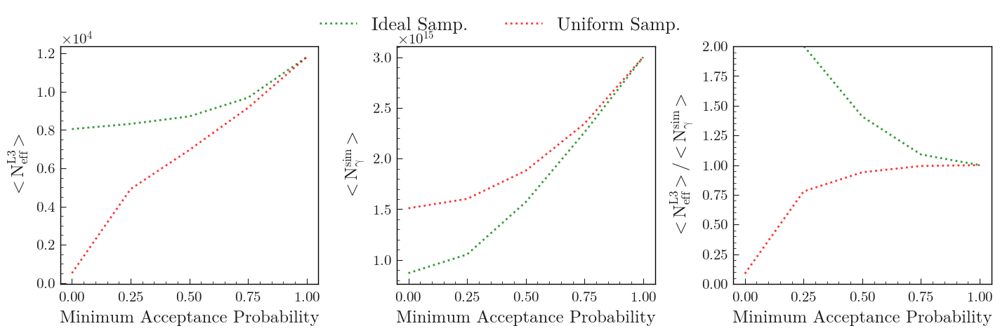

In [26]:
sdfs = {}
xvals=list(np.linspace(0,1,5))
for pname in ['pseudo_pred_gauss', 'pseudo_pred_uniform']:
    sdf = utils.speedup_utils.get_pred_speed_up(df, pname, min_pred_range=xvals) 
    sdfs[pname] = sdf
# utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)
# plt.ylim(0,2)

# sdf[['min_pred', 'speed', 'speed_normed']]




In [41]:
vals.shape, pred.shape

((333889, 1), (333889, 1))

In [ ]:
params = [-1.  ,       1. ,        1]
params = result.x
vals = logistic(bare_res, *params)
# _=plt.hist(vals, bins=100)
# plt.yscale('log')

sdf = utils.speedup_utils.get_pred_speed_up(df, vals, min_pred_range=xvals)
# sdfs['calib'] = sdf
# utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)
# plt.ylim(0,2)
# sdf[['min_pred', 'speed', 'speed_normed']]




,min_pred,speed,speed_normed
0,0.00,9.254567e-12,2.351819
1,0.25,7.889970e-12,2.005041
2,0.50,5.542532e-12,1.408497
3,0.75,4.287990e-12,1.089687
4,1.00,3.935067e-12,1.000000


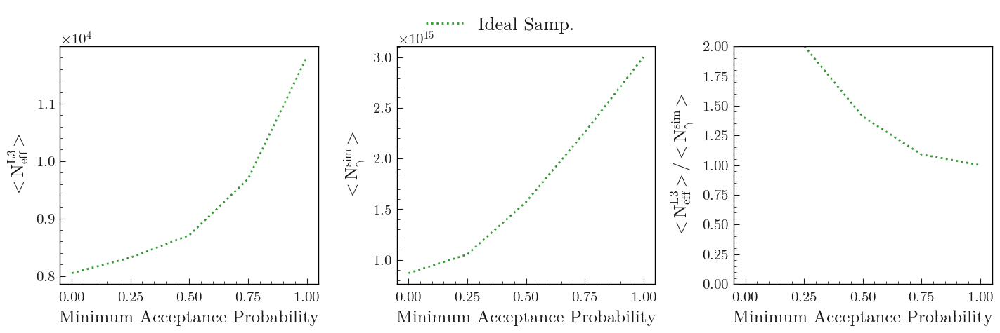

,min_pred,speed,speed_normed
0,0.00,9.254567e-12,2.351819
1,0.25,7.889970e-12,2.005041
2,0.50,5.542532e-12,1.408497
3,1.00,3.935067e-12,1.000000


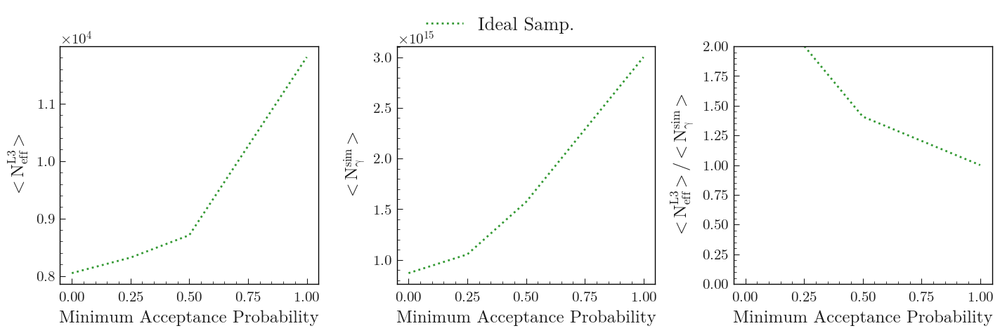

In [84]:
sdfs = {}
xvals=list(np.linspace(0,0.5,3)) + [1] 
for pname in ['pseudo_pred_gauss', ]:
    sdf = utils.speedup_utils.get_pred_speed_up(df, pname, min_pred_range=xvals) 
    sdfs[pname] = sdf
utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)
plt.ylim(0,2)

sdf[['min_pred', 'speed', 'speed_normed']]


(<Figure size 1500x500 with 3 Axes>,
 array([<Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{eff}^{L3}>$'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{\\gamma}^{sim}>$'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='$<N_{eff}^{L3}>$/$<N_{\\gamma}^{sim}>$'>],
       dtype=object))

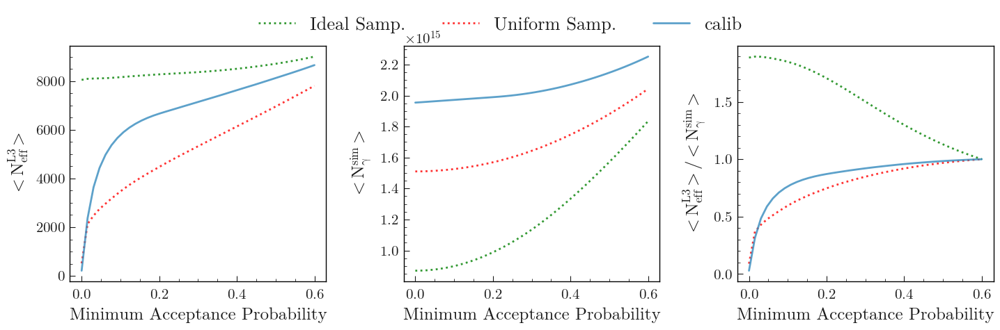

In [66]:
pred = df['pred']
pred = np.where(pred<0.2,0.001, pred)
sdf = utils.speedup_utils.get_pred_speed_up(df, pred, min_pred_range=xvals)
sdfs['calib'] = sdf

utils.speedup_utils.make_tri_plot('n_eff_passed', 'n_photons_simulated', sdfs=sdfs)


In [54]:
sdfs

['min_pred',
 'n_eff_passed',
 'n_photons_simulated',
 'n_eff_noflux_passed',
 'speed',
 'n_eff_passed_normed',
 'n_photons_simulated_normed',
 'speed_normed']

In [18]:
pseudo_preds = ['pseudo_pred_gauss', 'pseudo_pred_2gauss', 'pseudo_pred_uniform', 'pseudo_pred_coin_flip']
pseudo_preds = ['pseudo_pred_gauss', 'pseudo_pred_uniform', ]

model_prob_names = [k+"_prob" for k in model_names]
logistic_prob_names = [k+"_prob" for k in logistic_names]


In [19]:
pseudo_preds + model_names + model_prob_names + logistic_names + logistic_prob_names

['pseudo_pred_gauss',
 'pseudo_pred_uniform',
 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs',
 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs',
 'gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs_prob',
 'gen2L3_nguncorr_logactspeedup_hyperband3_50epochs_prob',
 'logistic_1_1_1',
 'logistic_2_1_1',
 'logistic_1_2_1',
 'logistic_0.5_2_1',
 'logistic_1_3_1',
 'logistic_1_2_0.5',
 'logistic_1_1_2',
 'logistic_2_1_2',
 'logistic_0.5_1_2',
 'logistic_1_1_1_prob',
 'logistic_2_1_1_prob',
 'logistic_1_2_1_prob',
 'logistic_0.5_2_1_prob',
 'logistic_1_3_1_prob',
 'logistic_1_2_0.5_prob',
 'logistic_1_1_2_prob',
 'logistic_2_1_2_prob',
 'logistic_0.5_1_2_prob']

In [20]:
sdfs = {}

pseudo_preds = ['pseudo_pred_gauss', 'pseudo_pred_2gauss', 'pseudo_pred_uniform', 'pseudo_pred_coin_flip']
pseudo_preds = ['pseudo_pred_gauss', 'pseudo_pred_uniform', ]

model_prob_names = [k+"_prob" for k in model_names]
for pred_name in  pseudo_preds + model_names + model_prob_names + logistic_names[:] + logistic_prob_names[:] :
    print(pred_name)
    sdf = get_pred_summary(df, 
                            pred=pred_name,
                            # col_gen_weights='weights',
                            # col_sel_weights=np.ones(len(df)),
                            # col_gen_weights='weights', 
                            # col_sel_weights=np.ones(len(df)),
                            min_pred_range=np.linspace(0,1,30),
    )
    sdfs[pred_name] = sdf





pseudo_pred_gauss
pseudo_pred_uniform
gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs
gen2L3_nguncorr_logactspeedup_hyperband3_50epochs
gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs_prob
gen2L3_nguncorr_logactspeedup_hyperband3_50epochs_prob
logistic_1_1_1
logistic_2_1_1
logistic_1_2_1
logistic_0.5_2_1
logistic_1_3_1
logistic_1_2_0.5
logistic_1_1_2
logistic_2_1_2
logistic_0.5_1_2
logistic_1_1_1_prob
logistic_2_1_1_prob
logistic_1_2_1_prob
logistic_0.5_2_1_prob
logistic_1_3_1_prob
logistic_1_2_0.5_prob
logistic_1_1_2_prob
logistic_2_1_2_prob
logistic_0.5_1_2_prob


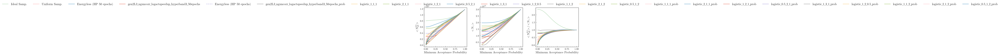

In [33]:
sdf.columns

_ = make_tri_plot("n_eff_sampled_gen_expected", "n_photons_sampled_expected", sdfs=sdfs, legend=True)

ValueError: If using all scalar values, you must pass an index

In [30]:
def get_pred_summary(df,
                    pred='pred',
                    passed='passed',
                    col_n_photons='n_photons',
                    col_gen_weights='weights',
                    col_sel_weights='selection_weight',
                    min_pred_range=np.linspace(0,1, 100),
                    full=False):
    """
        calculate summary information for a given prediction
    """
    steps = []
    # pred = df_[pred_name]
    pred = df[pred] if isinstance(pred, str) else pred
    passed = df[passed] if isinstance(passed, str) else passed
    w_gen = df[col_gen_weights] if isinstance(col_gen_weights, str) else col_gen_weights
    w_sel = df[col_sel_weights] if isinstance(col_sel_weights, str) else col_sel_weights
    n_photons = df[col_n_photons] if isinstance(col_n_photons, str) else col_n_photons


    for min_pred in min_pred_range:
        step_pred = np.where(pred<=min_pred, min_pred, pred )
        w_pred, mask_sample = get_weight_from_pred(step_pred)
        w_passed_sampled = w_pred[mask_sample & passed]

        w_pred_passed = w_pred[passed]
        w_gen_passed = w_gen[passed]
        step_pred_passed = step_pred[passed]
        
        n_photons_w_sell = n_photons*w_sel
        n_photons_w_sell_pred = n_photons_w_sell * step_pred

        n_photons_sampled_expected = (n_photons_w_sell_pred).sum() 
        #n_photons_sampled_expected = (n_photons * w_sel).sum()
        n_photons_sampled_gen_expected = (n_photons_w_sell_pred * w_gen).sum()  

        n_eff_sampled_passed = calc_n_eff(w_passed_sampled)
        n_eff_sampled_expected = calc_expected_n_eff(w_pred_passed)
        # n_eff_sampled_expected2 = calc_expected_n_eff(w_pred_passed, p=step_pred_passed) # xcheck expected

        n_eff_sampled_gen_expected = calc_expected_n_eff(w_pred_passed * w_gen_passed, p=step_pred_passed)
        n_eff_sampled_gen = calc_n_eff(w_passed_sampled * w_gen[mask_sample & passed] )


        
        steps_dict = dict(
            min_pred=min_pred,

            n_photons_sampled_expected=n_photons_sampled_expected,
            n_photons_sampled_gen_expected=n_photons_sampled_gen_expected,

            n_eff_sampled_passed=n_eff_sampled_passed,
            n_eff_sampled_expected=n_eff_sampled_expected,
            n_eff_sampled_gen_expected=n_eff_sampled_gen_expected,
            n_eff_sampled_gen=n_eff_sampled_gen,
            n_photons_rej_sampled_expected = (n_photons * w_sel * (1-step_pred)).sum(),
            n_photons_0_sampled_expected = (n_photons**(0) * w_sel * step_pred ).sum(),
            n_photons_1_sampled_expected = (n_photons**(1) * w_sel * step_pred ).sum(),
            n_photons_2_sampled_expected = (n_photons**(2) * w_sel * step_pred ).sum(),
                          
        )
        
        
        if full:
            pass
                    
        steps.append(steps_dict)
    
    sdf = pd.DataFrame(steps)
    return sdf



def get_pred_speed(pred, passed=None, n_photons=None, gen_weights=None, sel_weights=None):
    pred_passed = pred[passed]
    w_pred, mask_sample = get_weight_from_pred(pred)

    
    n_eff_passed = calc_expected_n_eff(w_pred[passed] * gen_weights[passed] * sel_weights[passed], pred[passed] )
    # n_eff_passed = calc_n_eff( (w_pred * gen_weights * sel_weights)[passed & mask_sample] )
    n_photons_simulated = (n_photons * sel_weights * pred).sum()
    speed = n_eff_passed / n_photons_simulated
    results = dict(n_eff_passed=n_eff_passed, n_photons_simulated=n_photons_simulated, speed=speed)
    n_photons_simulated_0 = (sel_weights*pred).sum()
    n_photons_simulated_2 = (sel_weights*pred*n_photons**2).sum()
    results.update(n_photons_simulated_0=n_photons_simulated_0, n_photons_simulated_2=n_photons_simulated_2)
    return results


def get_pred_speed_up(df,
                    pred='pred',
                    passed='passed',
                    col_n_photons='n_photons',
                    col_gen_weights='weights',
                    col_sel_weights='selection_weight',
                    min_pred_range=np.linspace(0,1, 100),
                    full=False):
    """
        calculate summary information for a given prediction
    """
    steps = []

    pred = df[pred] if isinstance(pred, str) else pred
    passed = df[passed] if isinstance(passed, str) else passed
    w_gen = df[col_gen_weights] if isinstance(col_gen_weights, str) else col_gen_weights
    w_sel = df[col_sel_weights] if isinstance(col_sel_weights, str) else col_sel_weights
    n_photons = df[col_n_photons] if isinstance(col_n_photons, str) else col_n_photons


    speed_dict_nominal = get_pred_speed(np.ones_like(pred), 
                                        passed=passed, 
                                        n_photons=n_photons, 
                                        gen_weights=w_gen, 
                                        sel_weights=w_sel)
    speed_nominal = speed_dict_nominal['speed']
    n_eff_passed_nominal = speed_dict_nominal['n_eff_passed']
    n_photons_simulated_nominal = speed_dict_nominal['n_photons_simulated']

    for min_pred in min_pred_range:
        step_pred = np.where(pred<=min_pred, min_pred, pred )

    
        speed_dict = get_pred_speed(step_pred, passed=passed, n_photons=n_photons, gen_weights=w_gen, sel_weights=w_sel)

        n_eff_passed = speed_dict['n_eff_passed']
        n_photons_simulated = speed_dict['n_photons_simulated']
        speed = speed_dict['speed']

        n_eff_passed_normed = n_eff_passed / n_eff_passed_nominal
        n_photons_simulated_normed = n_photons_simulated / n_photons_simulated_nominal
        speed_normed = speed / speed_nominal
        
        steps_dict = dict(min_pred=min_pred,
                            **speed_dict,
                            n_eff_passed_normed=n_eff_passed_normed,
                            n_photons_simulated_normed=n_photons_simulated_normed,
                            speed_normed=speed_normed,
                            #n_photons_simulated_0 = speed_dict['n_photons_simulated_0'],
                            #n_photons_simulated_2 = speed_dict['n_photons_simulated_2'],

                          )
                    
        steps.append(steps_dict)
    
    sdf = pd.DataFrame(steps)
    return sdf

In [31]:
sdfs = {}

pseudo_preds = ['pseudo_pred_gauss', 'pseudo_pred_2gauss', 'pseudo_pred_uniform', 'pseudo_pred_coin_flip']
pseudo_preds = ['pseudo_pred_gauss', 'pseudo_pred_uniform', ]

model_prob_names = [k+"_prob" for k in model_names]
for pred_name in  pseudo_preds + model_names: # + logistic_names[:3] + logistic_prob_names[:3] :
    print(pred_name)
    # sdf = get_pred_summary(df, 
    #                         pred=pred_name,
    #                         min_pred_range=np.linspace(0,1,40),
    # )
    sdf = get_pred_speed_up(df, 
                            pred=pred_name,
                            min_pred_range=np.linspace(0,1,40),
    )

    sdfs[pred_name] = sdf





pseudo_pred_gauss
pseudo_pred_uniform
gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_bayesian0_100epochs
gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_hyperband2
gen2L3_allfeatures_gen_weights_balanced_bayesian2_20epochs
gen2L3_ngammauncorr_gen_weights_balanced
gen2L3_ngammauncorr_gen_weights_balanced_bayesian2_50epochs


In [37]:
model_names
infos[model_names[0]]

{'color': 'blue', 'label': 'B0_100epochs'}

In [38]:
sdfs_ = {k:sdfs[k] for k in pseudo_preds + model_names[2:] }
for s in sdfs_:
    if s not in infos:
        infos[s] = dict(label="Model ")



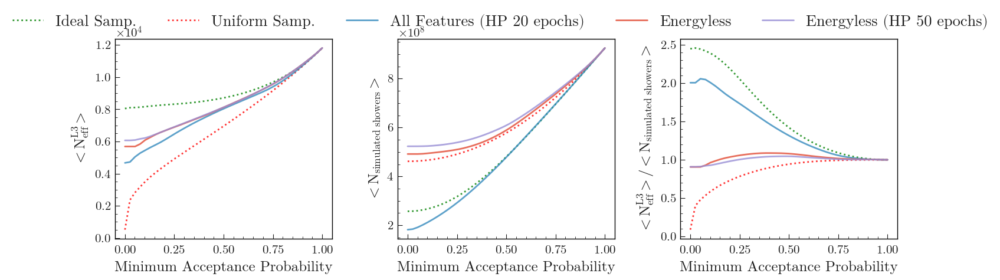

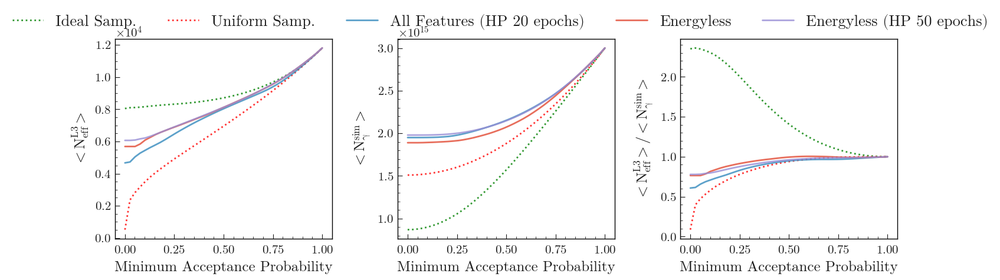

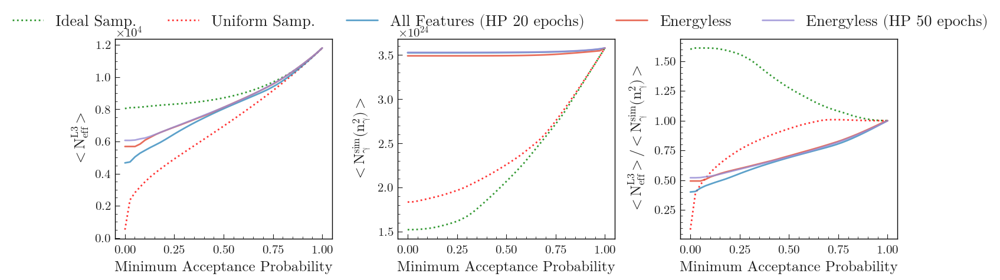

In [53]:
sdfs_ = {k:sdfs[k] for k in pseudo_preds + model_names[2:] }

fig, axs = make_tri_plot( 'n_eff_passed',
                         'n_photons_simulated_0', 
                         sdfs=sdfs_,
                         legend=True,
                           )

fig, axs = make_tri_plot( 'n_eff_passed',
                         'n_photons_simulated', 
                         sdfs=sdfs_,
                         legend=True,
                           )


                           
fig, axs = make_tri_plot( 'n_eff_passed',
                         'n_photons_simulated_2', 
                         sdfs=sdfs_,
                         legend=True,
                           )

In [84]:
# for i in range(100):
#     sum 
#     speed_dict = get_pred_speed(pred, passed=passed, n_photons=n_photons, gen_weights=w_gen, sel_weights=w_sel)


vals = []
for i in range(1000):
    res = get_pred_summary(df, min_pred_range=[0.01] )
    vals.append(res['n_eff_sampled_passed'].iloc[0])



Text(0.5, 0, '$N_{eff}^{sampled}$')

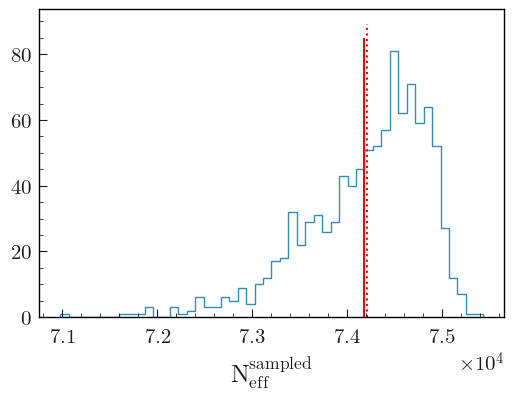

In [85]:
_ = plt.hist(vals, bins=50, histtype='step')
plt.vlines(res['n_eff_sampled_expected'].iloc[0], *plt.gca().get_ylim(), color='red')
plt.vlines(np.mean(vals), *plt.gca().get_ylim(), color='red', ls=":")
plt.xlabel("$N_{eff}^{sampled}$")


# valsres['n_eff_sampled_passed

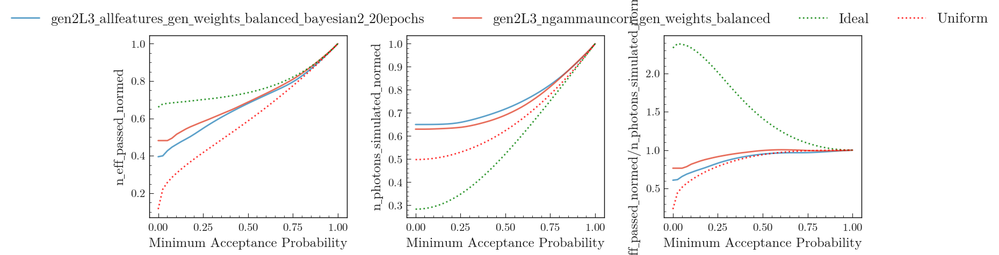

In [150]:
fig, axs = make_tri_plot( 'n_eff_passed_normed',
                         'n_photons_simulated_normed', 
                         sdfs={k:sdfs[k] for k in model_names[2:]   + pseudo_preds},
                         legend=True,
                           )


In [146]:

    

get_pred_speed(df['gen2L3_ngammauncorr_gen_weights_balanced'], 
               passed=df['passed'], 
               n_photons=df['n_photons'], 
               gen_weights=df['weights'], 
               sel_weights=df['selection_weight']
               )

{'n_eff_passed': 5688.214920947949,
 'n_gamma': 1890093727822083.2,
 'speed': 3.0094882794528737e-12}

In [144]:
get_pred_speed(df['gen2L3_ngammauncorr_gen_weights_balanced'], df['passed'], df['n_photons'], df['gen_weights'], df['selection_weight'] )

{'n_eff_passed': 5924.695480557563,
 'n_gamma': 1890093727822083.2,
 'speed': 3.1346040639923557e-12}

In [143]:
sdfs['gen2L3_ngammauncorr_gen_weights_balanced']['n_photons_sampled_expected'][0]
sdfs['gen2L3_ngammauncorr_gen_weights_balanced']['n_eff_sampled_gen_expected'][0]

5688.214920947949

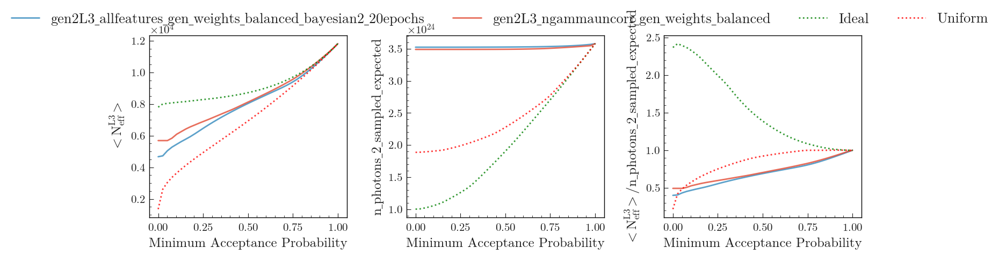

In [64]:
fig, axs = make_tri_plot( 'n_eff_sampled_gen_expected',
                         'n_photons_2_sampled_expected', 
                         sdfs={k:sdfs[k] for k in model_names[2:]   + pseudo_preds},
                         legend=True,
                           )


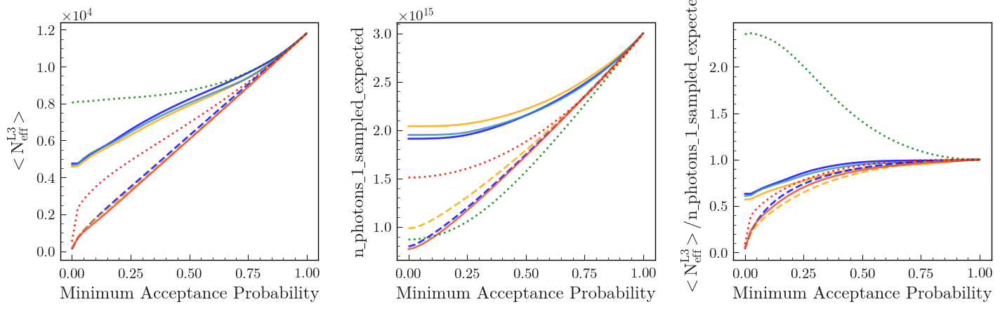

In [269]:
fig, axs = make_tri_plot( 'n_eff_sampled_gen_expected',
                         'n_photons_1_sampled_expected', 
                         sdfs={k:sdfs[k] for k in model_names + model_prob_names  + pseudo_preds},
                         # sdfs={k:sdfs[k] for k in model_names[:] },
                         # norm_idx=-1,
                         legend=False,
                           )


In [241]:

min_pred = 0
pred = df['pred']
passed = df['truth']==1


ngammas = []
for i in range(1000):
    step_pred = np.where(pred<=min_pred, min_pred, pred )
    w_pred, mask_sample = get_weight_from_pred(step_pred)
    w_passed_sampled = w_pred[mask_sample & passed]

    n_photons = df['n_photons']

    ng = (df[mask_sample]['n_photons']*df[mask_sample]['selection_weight']).sum() 
    ngammas.append(ng)
    print(ng)







1920403947432000.0
1907688802812000.0
1919442452896000.0
1913301915652000.0
1910821183113000.0
1910070277405000.0
1909886407279000.0
1914093153778000.0
1902678296520000.0
1904776224244000.0
1905809492061000.0
1919339383599000.0
1898702563716000.0
1905871454644000.0
1913997400547000.0
1914189216498000.0
1912640278970000.0
1912051187843000.0
1912886039955000.0
1916431158459000.0
1907369005531000.0
1921548191347000.0
1903359459879000.0
1922819239944000.0
1911026148846000.0
1913089618396000.0
1916380157640000.0
1916813063745000.0
1913505903655000.0
1907451828120000.0
1898842141360000.0
1903908803025000.0
1913062506666000.0
1916755508043000.0
1908172461043000.0
1895551315881000.0
1913018982064000.0
1914910550271000.0
1912235571588000.0
1910096776926000.0
1911291765436000.0
1907782227535000.0
1912107241806000.0
1913631335054000.0
1906260515284000.0
1894012091084000.0
1918143405373000.0
1922626730952000.0
1923143902428000.0
1916400278451000.0
1916592773486000.0
1912588540458000.0
191377190956

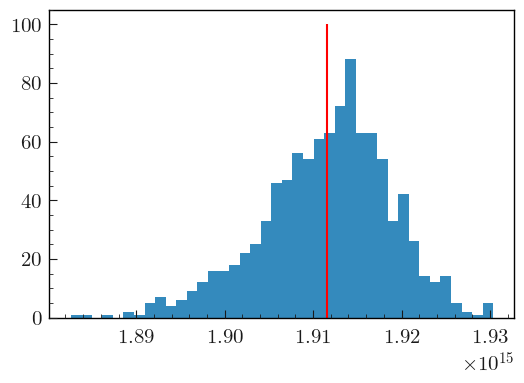

In [243]:
_=plt.hist(ngammas, bins=40)

nge = (n_photons*pred*df['selection_weight']).sum()
plt.vlines(nge, 0, 100, color='red')

In [70]:
calc_n_eff(df['gen_weights'])



def calc_expected_n_eff(w, p=None):
    """
        w are the weights for calcuting the N_eff
        p is the sampling probabilities for each event
        if p is not given, it is assumed that the given weights are only the sampling weights,
        i.e w = 1.0/p

    
    """
    if p is None:
        expected_n_eff = (len(w)*len(w)) / (w).sum()
    else:
        expected_n_eff = (p*w).sum()**2/( p*(w)**2).sum()
    return expected_n_eff


129955.00961229332

In [73]:
calc_expected_n_eff(df['gen_weights'], p=np.ones(len(df))), calc_expected_n_eff(df['gen_weights'] )


(129955.00961229332, 57314916714.07747)

In [81]:
w = df['gen_weights']
s = df['selection_weight']
p = df['pred']

value_counts = s.value_counts().to_dict()
n_effs = []
for w_sel, count in value_counts.items():
    print(f"{w_sel:0.2f} {count:0.0f} {calc_expected_n_eff(w, p=s/w_sel):0.2f}")
    #calc_expected_n_eff(w, p)
    expected_n_eff = (p*w).sum()**2/( p*(w)**2).sum()


200.00 86010 2835846.88
1000.00 82937 567169.38
1.00 82478 567169375.22
10000.00 82464 56716.94


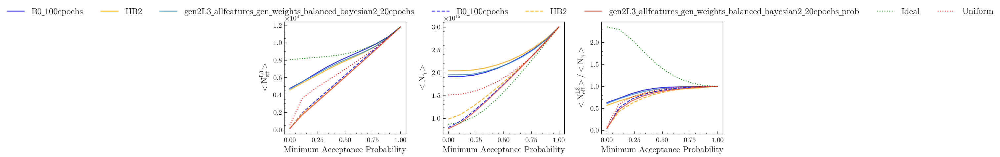

In [220]:
fig, axs = make_tri_plot( 'n_eff_sampled_gen_expected',
                         'n_photons_sampled_expected', 
                         sdfs={k:sdfs[k] for k in model_names + model_prob_names + pseudo_preds},
                         # sdfs={k:sdfs[k] for k in model_names[:] },
                         # norm_idx=-1,
                         legend=True,
                           )


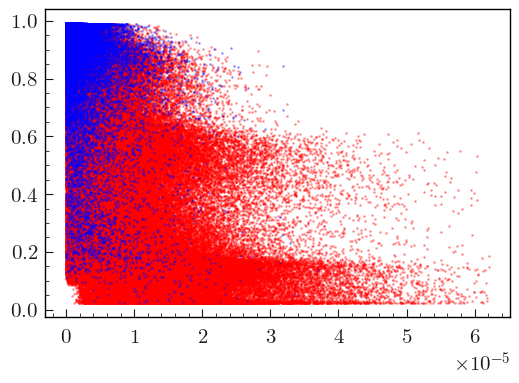

In [193]:
#from py

#norm=plt.colors.LogNorm()
import matplotlib.colors as mcolors
#_=plt.hist2d( df['pred'], df['gen_weights'],bins=100, norm=mcolors.LogNorm())
plt.scatter( df[cls0]['gen_weights'], df[cls0]['pred'], color='red', s=1, alpha=0.3)
plt.scatter( df[cls1]['gen_weights'], df[cls1]['pred'], color='blue', s=1, alpha=0.3)

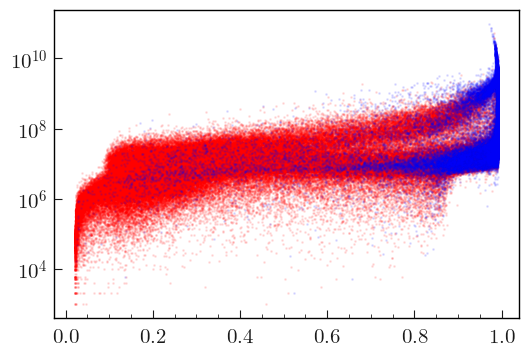

In [196]:
plt.scatter(  df[cls0]['pred'], df[cls0]['n_photons'],color='red', s=1, alpha=0.1)
plt.scatter(  df[cls1]['pred'], df[cls1]['n_photons'],color='blue', s=1, alpha=0.1)
plt.yscale('log')

In [168]:
# s.groupby(s).apply(lambda x: df.iloc[x.index]['gen_weights'].sum() )

s.groupby(s).apply(lambda x: x)

def apply_n_eff(x):
    idx = x.index
    values = x.values

    d = df.loc[idx]

    w = d['gen_weights']
    p = d['pred']
    s = d['selection_weight']
    w_pred = 1.0/(p+1E-9)

    passed = d['Level3'] == 1
    print(  s[passed].sum(), len(s), passed.sum()  )

    nom = ( w[passed] * w_pred[passed]*s[passed] ).sum()**2
    denom = ( ( w[passed] * w_pred[passed] )**2 ).sum()

    return nom/denom


s = df['selection_weight']
s.groupby(s).apply(apply_n_eff)
# s.groupby(s).apply(lambda x: df.loc[ x.index ]["Level3"] )

# s.groupby(s).apply(lambda x: x.index )








82478.0 82478 82478
0.0 86010 0
0.0 82937 0
0.0 82464 0


selection_weight
1.0        1756.080918
200.0              NaN
1000.0             NaN
10000.0            NaN
Name: selection_weight, dtype: float64

In [180]:
w = df.sample(10000)['weights']

calc_livetime(w)




32.86013396213878

In [170]:
get_pred_summary(df)

,min_pred,n_photons_sampled_expected,n_photons_sampled_gen_expected,n_eff_sampled_passed,n_eff_sampled_expected,n_eff_sampled_gen_expected,n_eff_sampled_gen
0,0.000000,1.911551e+15,6.800913e+12,73658.563473,74176.206256,4752.707455,4858.037629
1,0.010101,1.911551e+15,6.800913e+12,74104.286224,74176.206256,4752.707455,5039.422351
2,0.020202,1.911551e+15,6.800913e+12,74685.533075,74176.206256,4752.707455,5403.693611
3,0.030303,1.911584e+15,6.802335e+12,73316.287046,74206.600084,4779.135493,4093.877736
4,0.040404,1.911707e+15,6.807499e+12,73774.100139,74290.571560,4888.832141,4926.328090
...,...,...,...,...,...,...,...
95,0.959596,2.893947e+15,1.697652e+13,81155.673816,81191.903291,11365.170752,11353.602260
96,0.969697,2.918820e+15,1.715274e+13,81328.084792,81346.283868,11471.428326,11465.820176
97,0.979798,2.944300e+15,1.732949e+13,81515.257837,81513.070998,11579.566262,11612.082970
98,0.989899,2.971005e+15,1.750696e+13,81746.973863,81707.001805,11690.810159,11708.724405


In [131]:
# pd.Series.groupby(s, level=1).groups
# s.groupby('selection_weight')

# s.groupby(level="selection_weight")

s.groupby(s).apply( lambda x: df[x.index]   ) 

KeyError: "None of [Index([ 62044,  91748,  83597,  48844, 209403, 188757,  23932,  15996, 184338,\n       174603,\n       ...\n       226918, 144857,   1858, 313934, 153260, 214502, 327752, 324997, 210267,\n       146206],\n      dtype='int64', length=82478)] are in the [columns]"

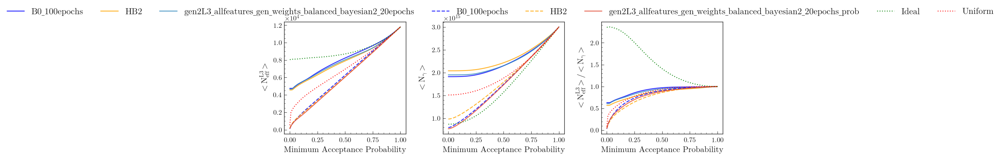

In [65]:
fig, axs = make_tri_plot( 'n_eff_sampled_gen_expected',
                         'n_photons_sampled_expected', 
                         sdfs={k:sdfs[k] for k in model_names + model_prob_names + pseudo_preds},
                         # sdfs={k:sdfs[k] for k in model_names[:] },
                         # norm_idx=-1,
                         legend=True,
                           )


In [ ]:
ef get_pred_summary(df,
                    pred='pred',
                    passed='passed',
                    col_n_photons='n_photons',
                    col_gen_weights='weights',
                    col_sel_weights='selection_weight',
                    min_pred_range=np.linspace(0,1, 100),
                    full=False):
    """
        calculate summary information for a given prediction
    """
    steps = []
    # pred = df_[pred_name]
    pred = df[pred] if isinstance(pred, str) else pred
    passed = df[passed] if isinstance(passed, str) else passed
    w_gen = df[col_gen_weights] if isinstance(col_gen_weights, str) else col_gen_weights
    w_sel = df[col_sel_weights] if isinstance(col_sel_weights, str) else col_sel_weights
    n_photons = df[col_n_photons] if isinstance(col_n_photons, str) else col_n_photons


    for min_pred in min_pred_range:
        step_pred = np.where(pred<=min_pred, min_pred, pred )
        w_pred, mask_sample = get_weight_from_pred(step_pred)
        w_passed_sampled = w_pred[mask_sample & passed]

        w_pred_passed = w_pred[passed]
        w_gen_passed = w_gen[passed]
        step_pred_passed = step_pred[passed]
        
        n_photons_w_sell = n_photons*w_sel
        n_photons_w_sell_pred = n_photons_w_sell * step_pred

        n_photons_sampled_expected = (n_photons_w_sell_pred).sum() 
        n_photons_sampled_gen_expected = (n_photons_w_sell_pred * w_gen).sum()  

        n_eff_sampled_passed = calc_n_eff(w_passed_sampled)
        n_eff_sampled_expected = calc_expected_n_eff(w_pred_passed)
        # n_eff_sampled_expected2 = calc_expected_n_eff(w_pred_passed, p=step_pred_passed) # xcheck expected

        n_eff_sampled_gen_expected = calc_expected_n_eff(w_pred_passed * w_gen_passed, p=step_pred_passed)
        n_eff_sampled_gen = calc_n_eff(w_passed_sampled * w_gen[mask_sample & passed] )

        # n_eff_sampled = calc_n_eff(w_pred)
        # n_photons_sampled_balanced = (n_photons)[mask_sample].sum()
        # n_photons_sampled_balanced_expected = (n_photons * step_pred ).sum()
        
        steps_dict = dict(
            min_pred=min_pred,

            n_photons_sampled_expected=n_photons_sampled_expected,
            n_photons_sampled_gen_expected=n_photons_sampled_gen_expected,

            n_eff_sampled_passed=n_eff_sampled_passed,
            n_eff_sampled_expected=n_eff_sampled_expected,
            n_eff_sampled_gen_expected=n_eff_sampled_gen_expected,
            n_eff_sampled_gen=n_eff_sampled_gen,
                          
        )
        
        
        if full:
            pass
                    
        steps.append(steps_dict)
    
    sdf = pd.DataFrame(steps)
    return sdf

In [51]:
from utils.speedup_utils import *


d = df_biased

## calculate the expected N_eff while ignoring the selection weight on the denominator!
##


1.007072697948757

In [27]:
"""
Maximize the speed_up by calibrating the logistic function


"""

def speed_up(df,
            pred='pred',
            ):

    pred = df[pred]
    min_pred = 0.2
    step_pred = np.where(pred<=min_pred, min_pred, pred )
    w_pred, mask_sample = get_weight_from_pred(step_pred)

    n_photons = df['n_photons']
    w_gen = df['weights']
    w_sel = df['selection_weight']
    passed = df['passed']

    w_pred_passed = w_pred[passed]

    n_photons_sampled_expected = (n_photons * step_pred * w_sel).sum() 
    n_eff_sampled_expected = calc_expected_n_eff(w_pred_passed)

    n_photons_nominal = (n_photons * w_sel).sum()
    n_eff_nominal = np.sum(w_pred_passed)

    speed_sampled = n_eff_sampled_expected/n_photons_sampled_expected
    speed_nominal = n_eff_nominal/n_photons_nominal

    speed_up = speed_sampled/speed_nominal
    # print(f"""{speed_sampled = }, 
    #         {speed_nominal = }, 
    #         {speed_up      = }""")
    print(f"""{speed_up = }""")

    return speed_up

speed_up(df, 'pseudo_pred_gauss',)

bare_model = remove_final_activation(mf.model)
bare_res = bare_model.predict(df[mf.features], batch_size=mf.batch_size)

def speed_up_wrapper(params):
    df['logistic_pred'] = logistic(bare_res, *params)
    print(params)
    return -1 * speed_up(df, 'logistic_pred')

from scipy.optimize import minimize

result = minimize(speed_up_wrapper, x0=(1,1,1), method='Nelder-Mead')



KeyError: 'selection_weight'

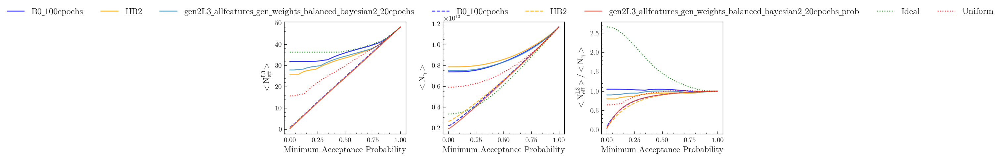

In [26]:
fig, axs = make_tri_plot( 'n_eff_sampled_gen_expected',
                         'n_photons_sampled_expected', 
                         sdfs={k:sdfs[k] for k in model_names + model_prob_names + pseudo_preds},
                         # sdfs={k:sdfs[k] for k in model_names[:] },
                         # norm_idx=-1,
                         legend=True,
                           )


In [36]:
fig, axs = make_tri_plot( 'n_eff_sampled_gen_expected',
                         'n_photons_sampled_expected', 
                         sdfs={k:sdfs[k] for k in ['unbiased'] + pseudo_preds},
                         #sdfs=sdfs,
                         norm_idx=-1,
                         legend=False,
                           )



KeyError: 'unbiased'

In [40]:
list( df.columns )

df[['pred', 'gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_bayesian0']]

KeyError: "['gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_bayesian0'] not in index"

In [34]:
sdfs.update({'unbiased': get_pred_summary(df, pred='pred', col_gen_weights='weights', col_sel_weights=np.ones(len(df))),
          # 'biased':   get_pred_summary(df_biased, pred='pred', col_gen_weights='weights', ),
          #'biased_gen': get_pred_summary(df, pred='pred', col_gen_weights='gen_weights', ),
        })

# sdf = sdfs['unbiased']
# factor = df['Level3'].sum()/df_unbiased['Level3'].sum()
# factor = np.ones_like( sdf ) * factor
# factor[:,0] = 1
# sdfs['unbiased'] = factor * sdf


In [58]:
sdf = sdfs['unbiased']
factor = df['Level3'].sum()/df_unbiased['Level3'].sum()
factor = np.ones_like( sdf ) * factor
factor[:,0] = 1
sdfs['unbiased'] = factor * sdf



,min_pred,n_photons_sampled,n_photons_sampled_expected,n_photons_sampled_gen_expected,n_eff_sampled_passed,n_eff_sampled_expected,n_eff_sampled_expected2,n_eff_sampled_gen_expected,n_eff_sampled_gen
0,0.000000,1.752458e+15,1.755361e+15,6.339451e+12,79960.238632,77737.935526,77737.935526,11094.874605,11649.662784
1,0.010101,1.764763e+15,1.755361e+15,6.339451e+12,76148.222264,77737.935526,77737.935526,11094.874605,11864.573882
2,0.020202,1.749284e+15,1.755361e+15,6.339451e+12,74118.273124,77737.935526,77737.935526,11094.874605,8693.412342
3,0.030303,1.758602e+15,1.755393e+15,6.340803e+12,76709.277755,77737.935526,77737.935526,11094.874605,9848.496835
4,0.040404,1.758745e+15,1.755509e+15,6.345553e+12,78922.125004,77737.935526,77737.935526,11094.874605,11003.079960
...,...,...,...,...,...,...,...,...,...
95,0.959596,2.668911e+15,2.671883e+15,1.590692e+13,81469.670975,81094.542659,81094.542659,13197.626181,13414.682153
96,0.969697,2.697557e+15,2.695026e+15,1.607201e+13,82418.626704,81266.264156,81266.264156,13328.662441,13652.179892
97,0.979798,2.721840e+15,2.718640e+15,1.623760e+13,82423.200295,81445.871324,81445.871324,13463.549623,13695.329774
98,0.989899,2.744305e+15,2.743324e+15,1.640382e+13,81953.982700,81651.634685,81651.641738,13598.824938,13734.110279


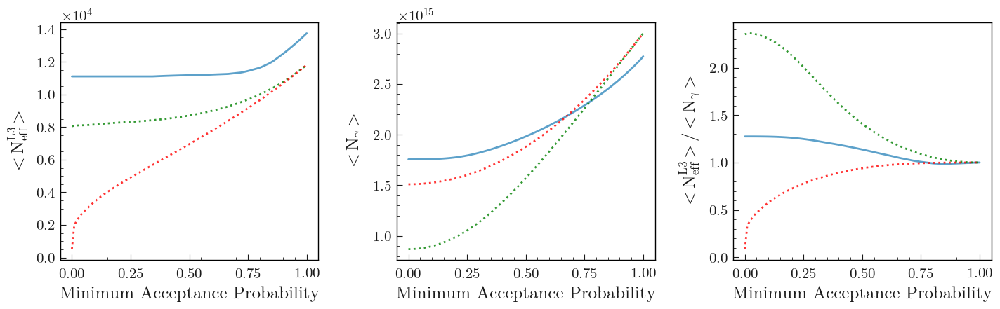

In [33]:
fig, axs = make_tri_plot( 'n_eff_sampled_gen_expected',
                         'n_photons_sampled_expected', 
                         sdfs={k:sdfs[k] for k in ['unbiased'] + pseudo_preds},
                         #sdfs=sdfs,
                         norm_idx=-1,
                         legend=False
                           )


In [39]:
unbiassed_passed = df_unbiased['passed']
calc_expected_n_eff( 1.0/df_unbiased['pred'][df_unbiased['passed']] * df_unbiased['weights'][df_unbiased['passed']], df_unbiased['pred'][df_unbiased['passed']] )

23.555997038153993

471.30285714285714

['pseudo_pred_gauss', 'pseudo_pred_uniform', 'logistic_1_1_1', 'logistic_2_1_1', 'logistic_1_1_1_prob']


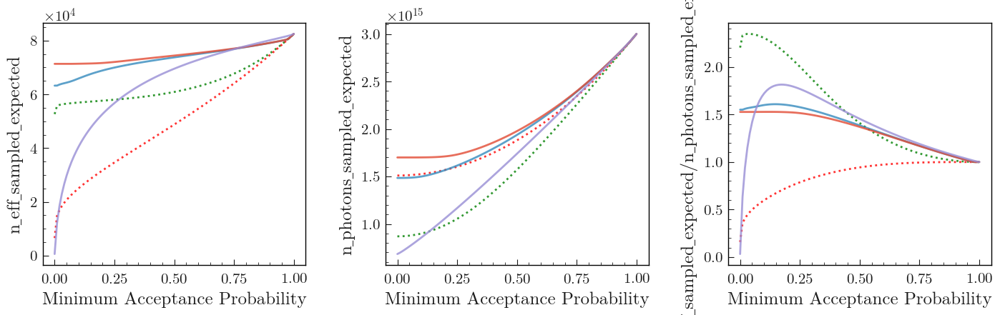

In [31]:
model_names_ = pseudo_preds + model_names + model_prob_names
model_names_ = pseudo_preds + logistic_names[:2] + \
    logistic_prob_names[:1] + \
    [ 
     # 'gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_bayesian0_100epochs', 
     # 'gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_bayesian0_100epochs_prob'
     ]
print(model_names_)
# model_names_ = ['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_bayesian0_100epochs', 'gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_hyperband2']

fig, axs = make_tri_plot( 'n_eff_sampled_expected',
                         'n_photons_sampled_expected', 
                         sdfs={k:sdfs[k] for k in model_names_}, legend=False)




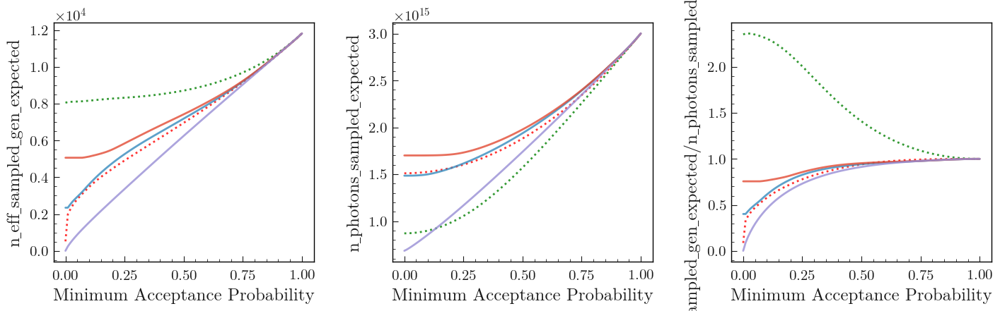

In [32]:

fig, axs = make_tri_plot( 'n_eff_sampled_gen_expected',
                         'n_photons_sampled_expected', 
                         sdfs={k:sdfs[k] for k in model_names_}, legend=False)


['pseudo_pred_gauss', 'pseudo_pred_uniform', 'logistic_1_1_1', 'logistic_2_1_1', 'logistic_1_1_1_prob', 'logistic_2_1_1_prob']


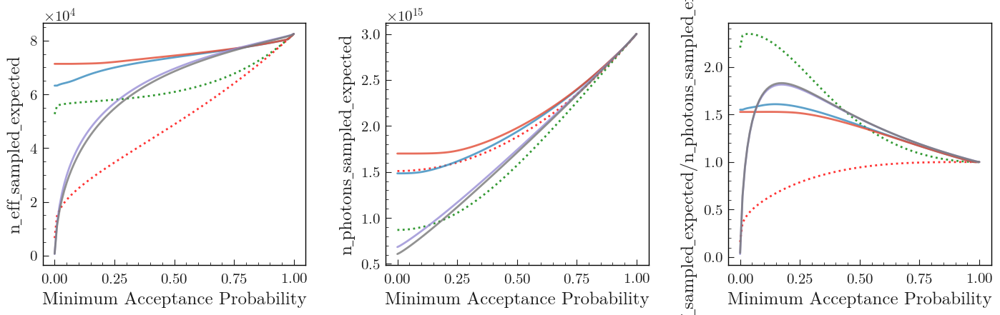

In [16]:
model_names_ = pseudo_preds + model_names + model_prob_names
model_names_ = pseudo_preds + logistic_names[:2] + logistic_prob_names[:2]
print(model_names_)
# model_names_ = ['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_bayesian0_100epochs', 'gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_hyperband2']

fig, axs = make_tri_plot( 'n_eff_sampled_expected',
                         'n_photons_sampled_expected', 
                         sdfs={k:sdfs[k] for k in model_names_}, legend=False)


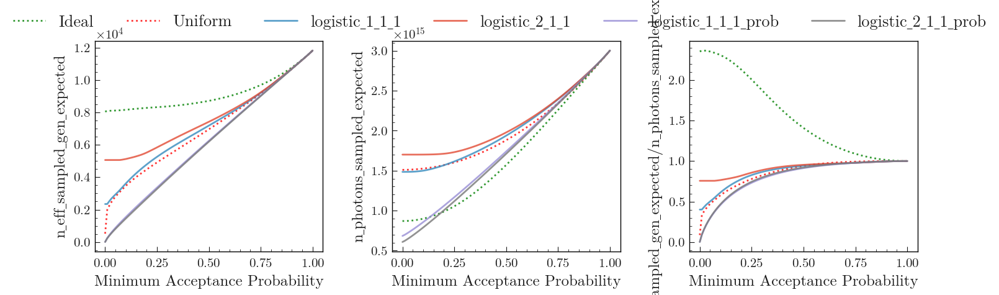

In [42]:
fig, axs = make_tri_plot( 'n_eff_sampled_gen_expected',
                         'n_photons_sampled_expected', 
                         sdfs={k:sdfs[k] for k in model_names_}, legend=True)


In [67]:
model_name = 'pseudo_pred_gauss'
model_name = 'logistic_1_1_1'

pred = df[model_name]
passed = df['truth']==1
w_sel = df['selection_weight']
w_gen = df['weights']
n_photons = df['n_photons']

min_pred = 0.0
step_pred = np.where(pred<=min_pred, min_pred, pred)
w_pred, mask_sample = get_weight_from_pred(step_pred)
w_passed_sampled = w_pred[mask_sample & passed]


ws = w_sel[passed]*w_gen[passed]

n_eff_sampled = calc_expected_n_eff(ws * w_pred[passed], p=step_pred[passed]) 
n_photons_sampled = (n_photons * step_pred * w_sel).sum()
# n_photons_sampled = (n_photons * w_sel)[mask_sample].sum()

n_eff_nominal = calc_expected_n_eff(ws, p=np.ones(passed.sum()) ) 
n_photons_nominal = (n_photons * w_sel).sum()


print(f"""
{model_name}
{n_eff_sampled     = :.2e}
{n_photons_sampled = :.2e}
ratio = {n_eff_sampled/n_photons_sampled :.2e}
{n_eff_nominal     = :.2e}  
{n_photons_nominal = :.2e}
ratio = {n_eff_nominal/n_photons_nominal :.2e}

double_ratio = { (n_eff_sampled/n_photons_sampled) / (n_eff_nominal/n_photons_nominal) :.2f}
      """)


logistic_1_1_1
n_eff_sampled     = 2.34e+03
n_photons_sampled = 1.51e+15
ratio = 1.56e-12
n_eff_nominal     = 1.18e+04  
n_photons_nominal = 3.00e+15
ratio = 3.94e-12

double_ratio = 0.40
      


In [55]:
model_name = 'pseudo_pred_gauss'
# model_name = 'logistic_1_1_1'

pred = df[model_name]
passed = df['truth']==1
w_sel = df['selection_weight']
w_gen = df['weights']
n_photons = df['n_photons']

min_pred = 0.0
step_pred = np.where(pred<=min_pred, min_pred, pred)
w_pred, mask_sample = get_weight_from_pred(step_pred)
w_passed_sampled = w_pred[mask_sample & passed]


ws = w_sel[passed]*w_gen[passed]

n_eff_sampled = calc_expected_n_eff(ws * w_pred[passed], p=step_pred[passed]) 
n_photons_sampled = (n_photons * step_pred * w_sel).sum()

n_eff_nominal = calc_expected_n_eff(ws, p=np.ones(passed.sum()) ) 
n_photons_nominal = (n_photons * w_sel).sum()


print(f"""
{model_name}
{n_eff_sampled     = :.2e}
{n_photons_sampled = :.2e}
ratio = {n_eff_sampled/n_photons_sampled :.2e}
{n_eff_nominal     = :.2e}  
{n_photons_nominal = :.2e}
ratio = {n_eff_nominal/n_photons_nominal :.2e}

double_ratio = { (n_eff_sampled/n_photons_sampled) / (n_eff_nominal/n_photons_nominal) :.2f}
      """)


pseudo_pred_gauss
n_eff_sampled     = 8.05e+03
n_photons_sampled = 8.70e+14
ratio = 9.25e-12
n_eff_nominal     = 1.18e+04  
n_photons_nominal = 3.00e+15
ratio = 3.94e-12

double_ratio = 2.35
      


['pseudo_pred_gauss', 'pseudo_pred_uniform', 'logistic_1_1_1', 'logistic_2_1_1', 'logistic_1_2_1', 'logistic_0.5_2_1', 'logistic_1_3_1', 'logistic_1_2_0.5', 'logistic_1_1_2', 'logistic_2_1_2', 'logistic_0.5_1_2', 'logistic_1_1_1_prob', 'logistic_2_1_1_prob', 'logistic_1_2_1_prob', 'logistic_0.5_2_1_prob', 'logistic_1_3_1_prob', 'logistic_1_2_0.5_prob', 'logistic_1_1_2_prob', 'logistic_2_1_2_prob', 'logistic_0.5_1_2_prob']


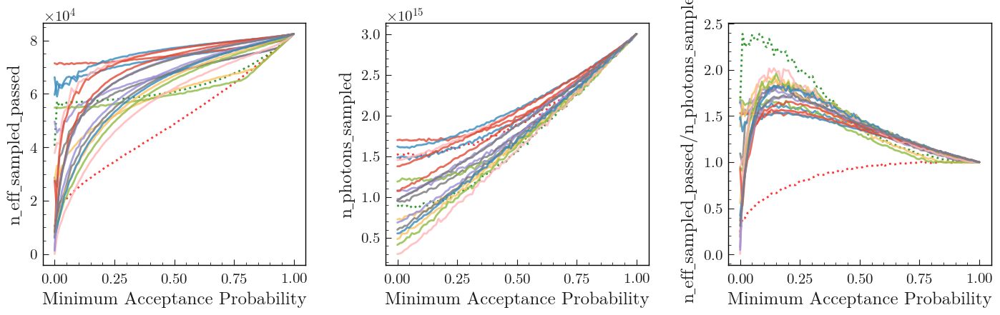

In [24]:
model_names_ = pseudo_preds + model_names + model_prob_names
model_names_ = pseudo_preds + logistic_names + logistic_prob_names
print(model_names_)
# model_names_ = ['pseudo_pred_gauss', 'pseudo_pred_uniform', 'gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_bayesian0_100epochs', 'gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_hyperband2']

fig, axs = make_tri_plot( 'n_eff_sampled_passed',
                         'n_photons_sampled', 
                         sdfs={k:sdfs[k] for k in model_names_}, legend=False)


In [ ]:
# print weight columns
print("weight columns:")
print( [k for k in df.columns if "weight" in k] )

df[['balanced_weight', 'Level3']]


(0.0, 3.0)

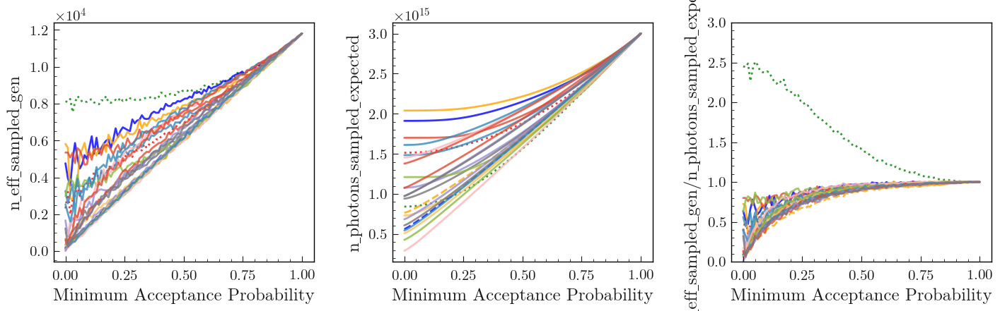

In [35]:
# sdf = get_pred_summary(df, 'pred')

# make_tri_plot('n_eff_sampled_passed', 'n_eff_sampled_expected', sdfs={'test':sdf})

# make_tri_plot('n_eff_sampled_expected2', 'n_eff_sampled_expected', sdfs={'test':sdf})

# make_tri_plot('n_eff_sampled_gen', 'n_eff_sampled_gen_expected', sdfs={'test':sdf})
fig, ax = make_tri_plot('n_eff_sampled_gen', 'n_photons_sampled_expected', sdfs=sdfs, legend=False)
ax[-1].set_ylim(0,3)

(<Figure size 1500x500 with 3 Axes>,
 array([<Axes: xlabel='Minimum Acceptance Probability', ylabel='n_eff_sampled_gen_expected'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='n_photons_sampled_gen_expected'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='n_eff_sampled_gen_expected/n_photons_sampled_gen_expected'>],
       dtype=object))

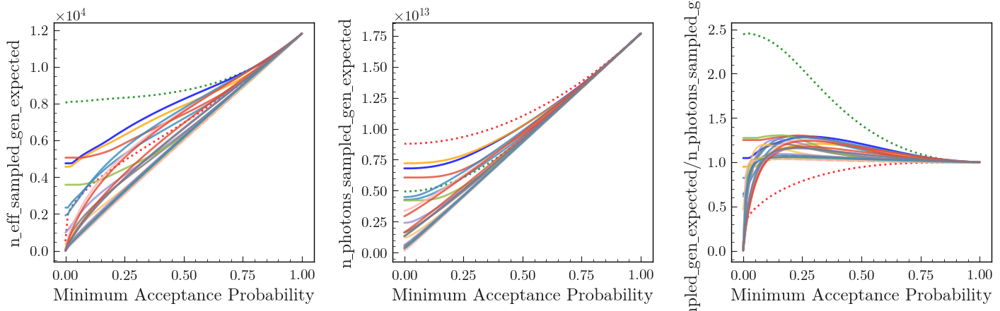

In [20]:
sdfs['gen2L3_merged_balanced_gen_weighted_combinedall_allfeatures_bayesian0_100epochs'].keys()
make_tri_plot( 'n_eff_sampled_gen_expected','n_photons_sampled_gen_expected', sdfs=sdfs, legend=False )

In [46]:
"""
Maximize the speed_up by calibrating the logistic function


"""

def speed_up(df,
            pred='pred',
            ):

    pred = df[pred]
    min_pred = 0.2
    step_pred = np.where(pred<=min_pred, min_pred, pred )
    w_pred, mask_sample = get_weight_from_pred(step_pred)

    n_photons = df['n_photons']
    w_gen = df['weights']
    w_sel = df['selection_weight']
    passed = df['passed']

    w_pred_passed = w_pred[passed]

    n_photons_sampled_expected = (n_photons * step_pred * w_sel).sum() 
    n_eff_sampled_expected = calc_expected_n_eff(w_pred_passed)

    n_photons_nominal = (n_photons * w_sel).sum()
    n_eff_nominal = np.sum(w_pred_passed)

    speed_sampled = n_eff_sampled_expected/n_photons_sampled_expected
    speed_nominal = n_eff_nominal/n_photons_nominal

    speed_up = speed_sampled/speed_nominal
    # print(f"""{speed_sampled = }, 
    #         {speed_nominal = }, 
    #         {speed_up      = }""")
    print(f"""{speed_up = }""")

    return speed_up

speed_up(df, 'pseudo_pred_gauss',)

bare_model = remove_final_activation(mf.model)
bare_res = bare_model.predict(df[mf.features], batch_size=mf.batch_size)

def speed_up_wrapper(params):
    df['logistic_pred'] = logistic(bare_res, *params)
    print(params)
    return -1 * speed_up(df, 'logistic_pred')

from scipy.optimize import minimize

result = minimize(speed_up_wrapper, x0=(1,1,1), method='Nelder-Mead')



speed_up = 1.4829154285543762


41/41 [==============================] - 1s 12ms/step
[1. 1. 1.]
speed_up = 1.3347741930885848
[1.05 1.   1.  ]
speed_up = 1.3348744258377556
[1.   1.05 1.  ]
speed_up = 1.3346931071761208
[1.   1.   1.05]
speed_up = 1.3378822642428039
[1.03333333 0.95       1.03333333]
speed_up = 1.3367470704301558
[1.05555556 0.96666667 1.05555556]
speed_up = 1.3381241255498562
[1.08333333 0.95       1.08333333]
speed_up = 1.3391967442700123
[1.02777778 0.93333333 1.11111111]
speed_up = 1.3396578020829348
[1.01666667 0.9        1.16666667]
speed_up = 1.3398964299460303
[1.03333333 0.95       1.16666667]
speed_up = 1.3409137605757926
[1.03333333 0.95       1.23333333]
speed_up = 1.3410871770828026
[1.08888889 0.86666667 1.27222222]
speed_up = 1.3390724628842967
[1.06666667 0.9        1.21666667]
speed_up = 1.3402997062220552
[0.99444444 0.88333333 1.32777778]
speed_up = 1.3378664304409795
[1.06111111 0.93333333 1.14444444]
speed_up = 1.3405139438668343
[1.09074074 0.95555556 1.22962963]
speed_up = 1.3

coefs = array([ -8.94091144,   5.68290166,  12.50360348, -16.13849748])
coefs = array([ 20.77790794, -22.2355215 ,  11.61353002, -15.27064959])
coefs = array([ 29.9242909 , -38.10050431,  19.2132218 , -15.55149154])


(<Figure size 1500x500 with 3 Axes>,
 array([<Axes: xlabel='Minimum Acceptance Probability', ylabel='n_eff_sampled_expected'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='n_photons_sampled_expected'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='n_eff_sampled_expected/n_photons_sampled_expected'>],
       dtype=object))

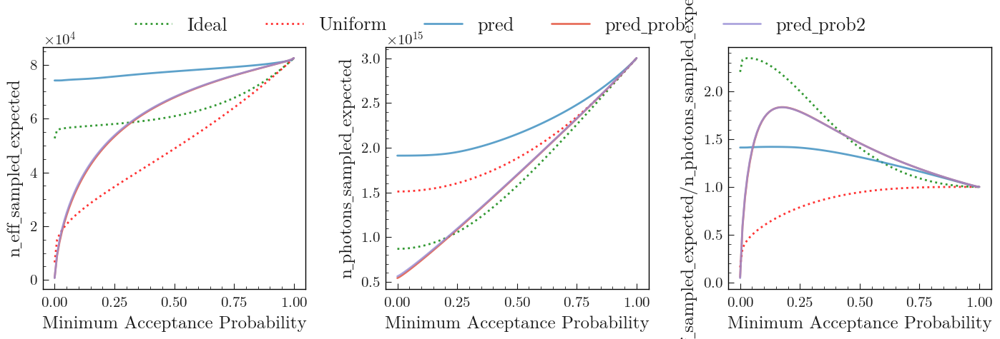

In [109]:
df['logistic_pred'] = logistic(bare_res, *(11.83, 2.65, 4.48))

sdfs_log = {}
get_class_probability(df, label="Level3",
                    pred='logistic_pred',
                    weight_columns=['selection_weight', 'weights'],
                    # weight_columns=['gen_weights_balanced'],
                    bins=100, return_func="polyfit")
get_class_probability(df, label="Level3",
                    pred='pred',
                    weight_columns=['selection_weight', 'weights'],
                    # weight_columns=['gen_weights_balanced'],
                    bins=100, return_func="polyfit")
df['pred_prob2'] = df['pred_prob']
get_class_probability(df, label="Level3",
                    pred='pred',
                    weight_columns=['selection_weight'],
                    # weight_columns=['gen_weights_balanced'],
                    bins=100, return_func="polyfit")


#for model_name in ['pseudo_pred_gauss', 'pseudo_pred_uniform', 'logistic_pred', 'pred', 'logistic_pred_prob', 'pred_prob', ] + ['pred_prob2']:
for model_name in ['pseudo_pred_gauss', 'pseudo_pred_uniform', 'pred', 'pred_prob', ] + ['pred_prob2']:
    sdf = get_pred_summary(df, pred=model_name)
    sdfs_log[model_name] = sdf

make_tri_plot('n_eff_sampled_expected', 'n_photons_sampled_expected', sdfs=sdfs_log, legend=True)



(<Figure size 1500x500 with 3 Axes>,
 array([<Axes: xlabel='Minimum Acceptance Probability', ylabel='n_eff_sampled_gen_expected'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='n_photons_sampled_expected'>,
        <Axes: xlabel='Minimum Acceptance Probability', ylabel='n_eff_sampled_gen_expected/n_photons_sampled_expected'>],
       dtype=object))

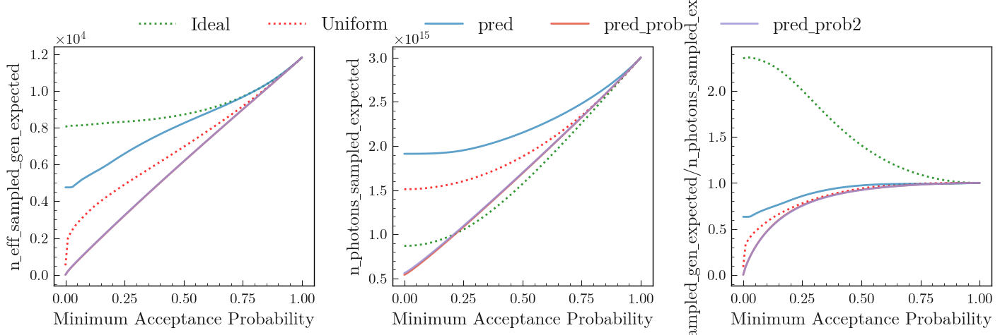

In [110]:
make_tri_plot('n_eff_sampled_gen_expected', 'n_photons_sampled_expected', sdfs=sdfs_log, legend=True)

In [8]:
print('blah')
import numpy as np
xs = np.linspace(0,20,50)


blah
